# Imports

In [985]:
import pandas as pd
import kmapper as km
from kmapper import Cover, jupyter
from kmapper.plotlyviz import plotlyviz
import numpy as np
import ripser

from sklearn.datasets import fetch_20newsgroups
from sklearn.cluster import AgglomerativeClustering
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import Isomap, TSNE
from sklearn.preprocessing import MinMaxScaler

In [3]:
original_df = pd.read_csv('data/obras_machado_de_assis.csv')
original_df.tail()

,arquivo,caminho completo,categoria,autor,paginas,titulo,edicao,publicacao,publicacao ano,publicacao editora,publicacao cidade,edicao ano,edicao editora,edicao cidade,edicao titulo,edicao volume,texto
111,contosFluminenses.pdf,./pdf/conto/contosFluminenses.pdf,conto,Machado de Assis,164,Contos Fluminenses,"Texto-fonte: Obra Completa, Machado de Assis, ...","Publicado originalmente pela Editora Garnier, ...",1870,Editora Garnier,Rio de Janeiro,1994,Nova Aguilar,Rio de Janeiro,"Obra Completa, Machado de Assis",II,Contos Fluminenses\n\nÍNDICE\nMISS DOLLAR\nLUÍ...
112,paginasRecolhidas.pdf,./pdf/conto/paginasRecolhidas.pdf,conto,Machado de Assis,43,Páginas Recolhidas,"Texto-fonte: Obra Completa, de Machado de Assi...","Publicado originalmente pela Editora Garnier, ...",1899,Editora Garnier,Rio de Janeiro,1994,Nova Aguilar,Rio de Janeiro,"Obra Completa, de Machado de Assis",II,Páginas Recolhidas\n\nÍNDICE\nPREFÁCIO\nO CASO...
113,trabalhadoresMar.pdf,./pdf/tradução/trabalhadoresMar.pdf,tradução,Machado de Assis,247,Os Trabalhadores do Mar,"Texto-fonte: Os Trabalhadores do Mar, Victor H...",Publicado originalmente como Os Trabalhadores ...,1866,Tipografia Perseverança,Rio de Janeiro,2002,Editora Nova Cultural,São Paulo,Os Trabalhadores do Mar,NaN,Os Trabalhadores do Mar\n\nÍNDICE\nDEDICATÓRIA...
114,suplicioMulher.pdf,./pdf/tradução/suplicioMulher.pdf,tradução,Machado de Assis,29,Suplício de uma mulher,"Texto-fonte: Teatro de Machado de Assis, org. ...","Publicada originalmente Obra Completa, Rio de ...",1865,W. M. Jackson,Rio de Janeiro,2003,Martins Fontes,São Paulo,Teatro de Machado de Assis,NaN,Suplício de uma mulher\n\nDRAMA EM 3 ACTOS\npo...
115,oliverTwist.pdf,./pdf/tradução/oliverTwist.pdf,tradução,Machado de Assis,125,Oliver Twist,"Texto-fonte: Oliver Twist, Charles Dickens, Tr...","Publicado originalmente em Jornal da Tarde, Ri...",1870,Jornal da Tarde,Rio de Janeiro,2002,Hedra,São Paulo,Oliver Twist,NaN,Oliver Twist\n\nÍNDICE\nCAPÍTULO PRIMEIRO\nCAP...


<AxesSubplot: xlabel='categoria'>

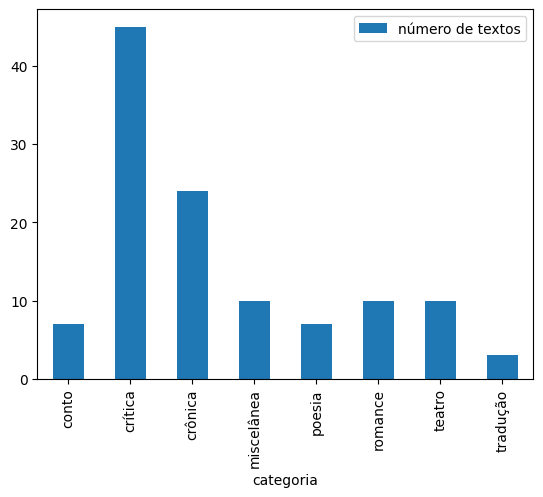

In [788]:
original_df.groupby('categoria').count()['titulo'].reset_index().rename(columns={'titulo': 'número de textos'}).plot.bar(x='categoria', y='número de textos')

In [3]:
original_df.groupby('categoria').count()

,arquivo,caminho completo,autor,paginas,titulo,edicao,publicacao,publicacao ano,publicacao editora,publicacao cidade,edicao ano,edicao editora,edicao cidade,edicao titulo,edicao volume,texto
categoria,,,,,,,,,,,,,,,,
conto,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7
crítica,45,45,45,45,45,45,45,45,37,37,45,44,44,44,33,45
crônica,24,24,24,24,24,24,24,24,24,24,24,24,24,24,17,24
miscelânea,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10
poesia,7,7,7,7,7,7,6,7,6,6,7,7,7,7,5,7
romance,10,10,10,10,10,10,10,10,10,10,10,10,10,10,4,10
teatro,10,10,10,10,10,10,10,10,9,10,10,10,10,10,4,10
tradução,3,3,3,3,3,3,3,3,3,3,3,3,3,3,0,3


# Clean Data

In [822]:
def clean_stopwords(row):
    
    for word in pt_stopwords:
        
        row['words'] = list(filter(lambda a: a != word, row['words']))
        
    return row['words']
        

In [978]:
# remove lines, punctuation and stop words
df = original_df.copy()

df['texto'] = df['texto'].str.lower()
df['texto'] = df['texto'].str.replace('\n', ' ')
df['texto'] = df['texto'].str.replace(',', '')
df['texto'] = df['texto'].str.replace('.', '')
df['words'] = df['texto'].str.split(' ')
df['antes'] = df['words'].str.len()
from nltk.corpus import stopwords
pt_stopwords = stopwords.words('portuguese')


df['words'] = df.apply(lambda row: clean_stopwords(row), axis=1)
df['depois'] = df['words'].str.len()


/var/folders/yf/2tw_d78n6c38q9md5v_pp0jm0000gn/T/ipykernel_14913/3123390999.py:7: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



In [826]:
df['words']

0      [revelações, poesias, zaluar, garnier, editor,...
1      [magalhães, azeredo:, horas, sagradas;, mário,...
2      [nova, geração, , i, nova, geração, poética, g...
3      [eduardo, prado, , última, vez, vi, eduardo, p...
4      [jm, macedo:, culto, dever, , autor, d'a, nebu...
5      [revista, dramática, , sumário:, —, crítica, t...
6      [idéias, sobre, teatro, , i, arte, dramática, ...
7      [flores, frutos, poesias, bruno, seabra, garni...
8      [constituinte, perante, história, sr, homem, m...
9      [oliveira, lima:, secretário, d’el-rei, , sr, ...
10     [raimundo, correia:, sinfonias, , suponho, lei...
11     [henriqueta, renan, , espartano, convidado, ou...
12     [ideal, crítico, , exercer, crítica, afigura-s...
13     [junqueira, freire:, inspirações, claustro, , ...
14     [eça, queirós:, primo, basílio, , bons, vivaze...
15     [castro, alves, , exmo, sr, —, boa, grande, fo...
16     [pareceres, machado, assis, diversas, peças, t...
17     [eça, queirós, , caro, h

In [980]:
df[['titulo', 'antes', 'depois']]

,titulo,antes,depois
0,"Revelações. Poesias de A. E. Zaluar, Garnier e...",1548,823
1,Magalhães de Azeredo: Horas sagradas; Mário de...,1469,837
2,A nova geração,14092,7737
3,Eduardo Prado,685,390
4,J.M. de Macedo: O culto do dever,2596,1411
5,Revista Dramática,30987,16984
6,Idéias sobre o Teatro,3861,2093
7,"Flores e frutos. Poesias por Bruno Seabra, Gar...",768,428
8,"A Constituinte perante a história, pelo sr. Ho...",2203,1170
9,Oliveira Lima: Secretário D’El-Rei,679,373


In [974]:
df[df['categoria'] == 'poesia']

,arquivo,caminho completo,categoria,autor,paginas,titulo,edicao,publicacao,publicacao ano,publicacao editora,publicacao cidade,edicao ano,edicao editora,edicao cidade,edicao titulo,edicao volume,texto,words,words_count_before,words_count_after
65,americanas.pdf,./pdf/poesia/americanas.pdf,poesia,Machado de Assis,57,Americanas,"Texto-fonte: Obra Completa, Machado de Assis, ...","Publicado originalmente no Rio de Janeiro, por...",1875,B.-L. Garnier,Rio de Janeiro,1994,Nova Aguilar,Rio de Janeiro,"Obra Completa, Machado de Assis",II,americanas índice potira niâni a cristã-nova ...,"[americanas, , índice, potira, niâni, cristã-n...",17714,10571
66,gazeta.pdf,./pdf/poesia/gazeta.pdf,poesia,Machado de Assis,109,Gazeta de Holanda,Texto-Fonte: Obra Completa de Machado de Assis...,"Publicado originalmente na Gazeta de Noticias,...",1888,Gazeta de Noticias,Rio de Janeiro,1937,Edições Jackson,Rio de Janeiro,Obra Completa de Machado de Assis,NaN,gazeta de holanda n° 1 1º de novembro de 1886...,"[gazeta, holanda, , n°, 1, 1º, novembro, 1886,...",20304,11964
67,almada.pdf,./pdf/poesia/almada.pdf,poesia,Machado de Assis,54,O Almada,"Texto-fonte: Poesias Completas, Machado de Ass...","Publicado originalmente em Outras Relíquias, R...",1910,Outras Relíquias,Rio de Janeiro,1938,W. M. Jackson,Rio de Janeiro,"Poesias Completas, Machado de Assis",NaN,o almada índice advertência canto primeiro ca...,"[almada, , índice, advertência, canto, primeir...",17643,10412
68,ocidentais.pdf,./pdf/poesia/ocidentais.pdf,poesia,Machado de Assis,27,Ocidentais,"Texto-fonte: Obra Completa, Machado de Assis, ...","Publicado originalmente em Poesias Completas, ...",1901,Poesias Completas,Rio de Janeiro,1994,Nova Aguilar,Rio de Janeiro,"Obra Completa, Machado de Assis",III,ocidentais índice o desfecho círculo vicioso ...,"[ocidentais, , índice, desfecho, círculo, vici...",7404,4349
69,falenas.pdf,./pdf/poesia/falenas.pdf,poesia,Machado de Assis,69,Falenas,"Texto-fonte: Obra Completa, Machado de Assis, ...","Publicado originalmente no Rio de Janeiro, por...",1870,B.-L. Garnier,Rio de Janeiro,1994,Nova Aguilar,Rio de Janeiro,"Obra Completa, Machado de Assis",II,falenas índice flor da mocidade quando ela fa...,"[falenas, , índice, flor, mocidade, fala, manh...",17515,10745
70,crisalidas.pdf,./pdf/poesia/crisalidas.pdf,poesia,Machado de Assis,48,Crisálidas,"Texto-fonte: Obra Completa, Machado de Assis, ...","Publicado originalmente no Rio de Janeiro, por...",1864,B.-L. Garnier,Rio de Janeiro,1994,Nova Aguilar,Rio de Janeiro,"Obra Completa, Machado de Assis",II,crisálidas índice musa consolatrix visio quin...,"[crisálidas, , índice, musa, consolatrix, visi...",12789,7458
71,dispersas.pdf,./pdf/poesia/dispersas.pdf,poesia,Machado de Assis,99,Poesias dispersas,"Textos-fonte: Obra Completa, Machado de Assis,...",NaN,0,NaN,NaN,2008,Nova Aguilar,Rio de Janeiro,"Obra Completa, Machado de Assis",III,poesias dispersas índice a palmeira ela teu ca...,"[poesias, dispersas, índice, palmeira, canto, ...",23653,14403


# Models

## Mapper

In [1015]:
df['label'] = '(' + df['categoria'] + '-' + df['titulo'] + ')'
X, y = np.array(df[df['categoria'].isin(['romance', 'poesia', 'teatro'])]['texto'].tolist()), \
       np.array(df[df['categoria'].isin(['romance', 'poesia', 'teatro'])]['label'].tolist())
print("SAMPLE",y)


SAMPLE ['(romance-Memórias Póstumas de Brás Cubas)' '(romance-Esaú e Jacó)'
 '(romance-Helena)' '(romance-Ressurreição)' '(romance-A Mão e a Luva)'
 '(romance-Memorial de Aires)' '(romance-Casa Velha)'
 '(romance-Quincas Borba)' '(romance-Dom Casmurro)'
 '(romance-Iaiá Garcia)' '(poesia-Americanas)'
 '(poesia-Gazeta de Holanda)' '(poesia-O Almada)' '(poesia-Ocidentais)'
 '(poesia-Falenas)' '(poesia-Crisálidas)' '(poesia-Poesias dispersas)'
 '(teatro-Desencantos)' '(teatro-Quase ministro)'
 '(teatro-Tu, só tu, puro amor)'
 '(teatro-O Bote de Rapé Comédia em sete colunas)'
 '(teatro-Hoje avental, amanhã luva)' '(teatro-Lição de Botânica)'
 '(teatro-Não consultes médico)' '(teatro-As Forcas Caudinas)'
 '(teatro-Os Deuses de casaca)' '(teatro-O caminho da porta O protocolo)']


In [1010]:
mapper = km.KeplerMapper(verbose=2)

projected_X = mapper.fit_transform(X,
    projection=[TfidfVectorizer(analyzer="char",
                                ngram_range=(1,6),
                                max_df=0.83,
                                min_df=0.05),
                TruncatedSVD(n_components=100,
                             random_state=1729),
                Isomap(n_components=2)],
    scaler=[None, None, MinMaxScaler()])

print("SHAPE",projected_X.shape)

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap()
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (27,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))


..Created projection shaped (27, 331534)
..Projecting on data shaped (27, 331534)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (27, 27)

..Projecting data using: 
	Isomap()


..Scaling with: MinMaxScaler()

SHAPE (27, 2)


In [1011]:
from sklearn import cluster
graph = mapper.map(projected_X,
                   X=None,
                   clusterer=cluster.AgglomerativeClustering(n_clusters=3,
                                                             linkage="complete",
                                                             affinity="cosine"),
                   cover=Cover(perc_overlap=0.5, n_cubes=3))

Mapping on data shaped (27, 2) using lens shaped (27, 2)

Minimal points in hypercube before clustering: 3
Creating 9 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
Cube_5 is empty.

   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.

Created 32 edges and 21 nodes in 0:00:00.011402.


In [1014]:
vec = TfidfVectorizer(analyzer="word",
                      strip_accents="unicode",
                      ngram_range=(1,2),
                      max_df=0.97,
                      min_df=0.02)

interpretable_inverse_X = vec.fit_transform(X).toarray()
interpretable_inverse_X_names = vec.get_feature_names()


/opt/homebrew/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [1016]:
_ = mapper.visualize(graph,
                        X=interpretable_inverse_X,
                        X_names=interpretable_inverse_X_names,
                        path_html="machado_tda_full_test.html",
                        lens=projected_X,
                        lens_names=["var 1", "var 2", 'var3'],
                        title="Machado TDA: Análise de classificação de texto",
                        custom_tooltips=np.array(y),
                        color_values=colors,
                        color_function_name='target')



Wrote visualization to: machado_tda_full_test.html


In [169]:
y

array(['crítica', 'crítica', 'crítica', 'crítica', 'crítica', 'crítica',
       'crítica', 'crítica', 'crítica', 'crítica', 'crítica', 'crítica',
       'crítica', 'crítica', 'crítica', 'crítica', 'crítica', 'crítica',
       'crítica', 'crítica', 'crítica', 'crítica', 'crítica', 'crítica',
       'crítica', 'crítica', 'crítica', 'crítica', 'crítica', 'crítica',
       'crítica', 'crítica', 'crítica', 'crítica', 'crítica', 'crítica',
       'crítica', 'crítica', 'crítica', 'crítica', 'crítica', 'crítica',
       'crítica', 'crítica', 'crítica', 'miscelânea', 'miscelânea',
       'miscelânea', 'miscelânea', 'miscelânea', 'miscelânea',
       'miscelânea', 'miscelânea', 'miscelânea', 'miscelânea', 'romance',
       'romance', 'romance', 'romance', 'romance', 'romance', 'romance',
       'romance', 'romance', 'romance', 'poesia', 'poesia', 'poesia',
       'poesia', 'poesia', 'poesia', 'poesia', 'crônica', 'crônica',
       'crônica', 'crônica', 'crônica', 'crônica', 'crônica', 'crônica',

In [23]:
map_, colors = {}, []
for categoria, i in zip(list(set(y)), list(range(0, len(list(set(y)))))):
    
    map_[categoria] = i
    
for categoria in y:
    
    colors.append(map_[categoria])

### Tuning

In [112]:
pipelines = {
    'tfidf_svd_tsne_ac_cover' : {
        'linkage' : ['complete', 'average'],
        'affinity' : ['euclidean', 'cosine']
    },
    'tfidf_svd_tsne_km_cover' : {
        'linkage' : ['complete', 'average'],
        'affinity' : ['euclidean', 'cosine']
    },
    'tfidf_svd_isomap_ac_cover' : {},
    'tfidf_svd_isomap_km_cover' : {}
    }

params = {
    'ngram_range' : [(1,1), (1, 6), (2, 2), (3, 3)],
    'max_df' : [0.83, 0.9, 0.97],
    'min_df' : [0.02, 0.05, 0.1],
    'svd_n_components' : [50, 100, 1000],
    'n_components' : [2, 3],
    'n_clusters' : [2, 3, 10],
    'perc_overlap' : [0.33, 0.5], 
    'n_cubes' : [3, 5, 10]
}

In [113]:
def run_pipeline(pipeline_name, params):
    
    X, y = np.array(df['texto'].tolist()), np.array(df['categoria'].tolist())
    
    ## Projection
    
    if 'tsne' in pipeline_name:
        
        mapper = km.KeplerMapper(verbose=2)

        projected_X = mapper.fit_transform(
            X,
            projection=[TfidfVectorizer(analyzer="char",
                                        ngram_range=params['ngram_range'],
                                        max_df=params['max_df'],
                                        min_df=params['min_df']),
                        TruncatedSVD(n_components=params['svd_n_components'],
                                     random_state=1729),
                        TSNE(n_components=params['n_components'])],
            scaler=[None, None, MinMaxScaler()]
        )
    
    if 'isomap' in pipeline_name:
        
        mapper = km.KeplerMapper(verbose=2)

        projected_X = mapper.fit_transform(
            X,
            projection=[TfidfVectorizer(analyzer="char",
                                        ngram_range=params['ngram_range'],
                                        max_df=params['max_df'],
                                        min_df=params['min_df']),
                        TruncatedSVD(n_components=params['svd_n_components'],
                                     random_state=1729),
                        Isomap(n_components=params['n_components'],
                               n_jobs=-1)],
            scaler=[None, None, MinMaxScaler()]
        )

    
    ## Cluster and cover
    
    if 'ac' in pipeline_name: 
    
        graph = mapper.map(projected_X,
                       X=None,
                       clusterer=cluster.AgglomerativeClustering(n_clusters=params['n_clusters'],
                                                                 linkage=params['linkage'],
                                                                 affinity=params['affinity']),
                       cover=Cover(perc_overlap=params['perc_overlap'], n_cubes=params['n_cubes']))
        
        
    if 'km' in pipeline_name: 
    
        graph = mapper.map(projected_X,
                       X=None,
                       clusterer=cluster.KMeans(n_clusters=params['n_clusters']),
                       cover=Cover(perc_overlap=params['perc_overlap'], n_cubes=params['n_cubes']))
        
        
    params['graph'] = graph
    params['pipeline_type'] = pipeline_name
    
    return params
        
def grid_pipeline(pipeline_name, e_params):
    
    pipeline_params = {
        'ngram_range' : [(1,1), (1, 6), (2, 2), (3, 3)],
        'max_df' : [0.83, 0.97],
        'min_df' : [0.02, 0.05],
        'svd_n_components' : [100, 1000],
        'n_components' : [2, 3],
        'n_clusters' : [2, 3, 10],
        'perc_overlap' : [0.33, 0.5], 
        'n_cubes' : [3, 5, 10]
    }
    
    
    for e_param in e_params.keys():
        
        pipeline_params[e_param] = e_params[e_param]
        
    print(pipeline_name, pipeline_params)
    
    
    keys = list(pipeline_params)

    pipeline_grid = []
    for values in itertools.product(*map(pipeline_params.get, keys)):
        pipeline_grid.append(dict(zip(keys, values)))
    
    print(len(pipeline_grid))
    
    graphs = []
    
    for params in pipeline_grid:
        
        graphs.append(run_pipeline(pipeline_name=pipeline_name, params=params))
        
    df = pd.DataFrame(graphs)
    
    df.to_csv(f'{pipeline_name}.csv')
        
        

In [115]:
grid_pipeline(pipeline_name='tfidf_svd_isomap_km_cover', e_params=pipelines['tfidf_svd_isomap_km_cover'])

tfidf_svd_isomap_km_cover {'ngram_range': [(1, 1), (1, 6), (2, 2), (3, 3)], 'max_df': [0.83, 0.97], 'min_df': [0.02, 0.05], 'svd_n_components': [100, 1000], 'n_components': [2, 3], 'n_clusters': [2, 3, 10], 'perc_overlap': [0.33, 0.5], 'n_cubes': [3, 5, 10]}
1152
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 45)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (1

   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
   > Found 2 clusters in hypercube 22.
   > Found 2 clusters in hypercube 23.
   > Found 2 clusters in hypercube 24.

Created 118 edges and 50 nodes in 0:00:00.326511.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	Trunc

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17.
   > Found 3 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
   > Found 3 clusters in hypercube 22.
   > Found 3 clusters in hypercube 23.
   > Found 3 clusters in hypercube 24.
   > Found 3 clusters in hypercube 25.
Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

   > Found 3 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
Cube_37 is empty.

   > Found 3 clusters in hypercube 38.
Cube_39 is empty.

Cube_40 is empty.

   > Found 3 clusters in hypercube 41.
   > Found 3 clusters in hypercube 42.
Cube_43 is empty.

Cube_44 is empty.

Cube_45 is 

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (9) found smaller than n_clusters (10). Possibly due to duplicate points in X.



KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 45)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
Cube_4 is empty.

   > Found 10 clusters in hypercube 5.
   > Found 


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 45)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
  

   > Found 2 clusters in hypercube 105.
   > Found 2 clusters in hypercube 106.
   > Found 2 clusters in hypercube 107.
Cube_108 is empty.

Cube_109 is empty.

   > Found 2 clusters in hypercube 110.
   > Found 2 clusters in hypercube 111.
Cube_112 is empty.

Cube_113 is empty.

Cube_114 is empty.

Cube_115 is empty.

Cube_116 is empty.

Cube_117 is empty.

   > Found 2 clusters in hypercube 118.
   > Found 2 clusters in hypercube 119.
Cube_120 is empty.

Cube_121 is empty.

Cube_122 is empty.

   > Found 2 clusters in hypercube 123.
Cube_124 is empty.

Cube_125 is empty.

Cube_126 is empty.

Cube_127 is empty.

   > Found 2 clusters in hypercube 128.
   > Found 2 clusters in hypercube 129.
Cube_130 is empty.

Cube_131 is empty.

Cube_132 is empty.

Cube_133 is empty.

Cube_134 is empty.

Cube_135 is empty.

   > Found 2 clusters in hypercube 136.
   > Found 2 clusters in hypercube 137.
Cube_138 is empty.

Cube_139 is empty.

   > Found 2 clusters in hypercube 140.
   > Found 2 cluster


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 45)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 1000 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
Cube_3 is empty.

   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
Cube_7 is empty.

Cube_8 is empty.

   > Found 2 clusters in hypercube 9.
Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

   > Found 2 clusters in hypercube 15.
Cube_16 is empty.

   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
Cube_19 is empty.

Cube_

   > Found 2 clusters in hypercube 264.
   > Found 2 clusters in hypercube 265.
Cube_266 is empty.

   > Found 2 clusters in hypercube 267.
   > Found 2 clusters in hypercube 268.
   > Found 2 clusters in hypercube 269.
   > Found 2 clusters in hypercube 270.
   > Found 2 clusters in hypercube 271.
   > Found 2 clusters in hypercube 272.
   > Found 2 clusters in hypercube 273.
   > Found 2 clusters in hypercube 274.
   > Found 2 clusters in hypercube 275.
   > Found 2 clusters in hypercube 276.
Cube_277 is empty.

Cube_278 is empty.

   > Found 2 clusters in hypercube 279.
   > Found 2 clusters in hypercube 280.
   > Found 2 clusters in hypercube 281.
   > Found 2 clusters in hypercube 282.

Created 1289 edges and 312 nodes in 0:00:02.288037.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrice

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 58.
   > Found 3 clusters in hypercube 59.
Cube_60 is empty.

Cube_61 is empty.

Cube_62 is empty.

Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

   > Found 3 clusters in hypercube 67.
   > Found 3 clusters in hypercube 68.
Cube_69 is empty.

   > Found 3 clusters in hypercube 70.
Cube_71 is empty.

   > Found 3 clusters in hypercube 72.

Created 276 edges and 130 nodes in 0:00:00.719503.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	TruncatedSVD

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 35.
Cube_36 is empty.

   > Found 3 clusters in hypercube 37.
Cube_38 is empty.

   > Found 3 clusters in hypercube 39.
Cube_40 is empty.

   > Found 3 clusters in hypercube 41.
   > Found 3 clusters in hypercube 42.
   > Found 3 clusters in hypercube 43.
   > Found 3 clusters in hypercube 44.
   > Found 3 clusters in hypercube 45.
   > Found 3 clusters in hypercube 46.
Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

   > Found 3 clusters in hypercube 50.
   > Found 3 clusters in hypercube 51.
Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

Cube_61 is empty.

   > Found 3 clusters in hypercube 62.
   > Found 3 clusters in hypercube 63.
Cube_64 is empty.

   > Found 3 clusters in hypercube 65.
Cube_66 is empty.

Cube_67 is empty.

Cube_68 is empty.

Cube_69 is empty.

Cube_70 is empty.

   > Found 2 clusters in hypercube 7

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 89.
Cube_90 is empty.

Cube_91 is empty.

Cube_92 is empty.

Cube_93 is empty.

Cube_94 is empty.

Cube_95 is empty.

Cube_96 is empty.

Cube_97 is empty.

Cube_98 is empty.

Cube_99 is empty.

Cube_100 is empty.

Cube_101 is empty.

Cube_102 is empty.

Cube_103 is empty.

Cube_104 is empty.

Cube_105 is empty.

   > Found 3 clusters in hypercube 106.
   > Found 3 clusters in hypercube 107.
Cube_108 is empty.

Cube_109 is empty.

   > Found 3 clusters in hypercube 110.
Cube_111 is empty.

Cube_112 is empty.

Cube_113 is empty.

Cube_114 is empty.

Cube_115 is empty.

Cube_116 is empty.

Cube_117 is empty.

Cube_118 is empty.

   > Found 3 clusters in hypercube 119.
Cube_120 is empty.

Cube_121 is empty.

Cube_122 is empty.

Cube_123 is empty.

Cube_124 is empty.

Cube_125 is empty.

Cube_126 is empty.

Cube_127 is empty.

   > Found 3 clusters in hypercube 128.
Cube_129 is empty.

Cube_130 is empty.

Cube_131 is empty.

Cube_132 is empty.

Cube_133 is

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
   > Found 3 clusters in hypercube 33.
   > Found 3 clusters in hypercube 34.
Cube_35 is empty.

   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in hypercube 38.
Cube_39 is empty.

   > Found 3 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

   > Found 3 clusters in hypercube 45.
   > Found 2 clusters in hypercube 46.
Cube_47 is empty.



/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 48.
   > Found 3 clusters in hypercube 49.
   > Found 3 clusters in hypercube 50.
   > Found 3 clusters in hypercube 51.
   > Found 3 clusters in hypercube 52.
   > Found 3 clusters in hypercube 53.
   > Found 3 clusters in hypercube 54.
Cube_55 is empty.

   > Found 3 clusters in hypercube 56.
   > Found 3 clusters in hypercube 57.
Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

   > Found 3 clusters in hypercube 61.
   > Found 3 clusters in hypercube 62.
Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

   > Found 3 clusters in hypercube 66.
   > Found 3 clusters in hypercube 67.
   > Found 3 clusters in hypercube 68.
Cube_69 is empty.

   > Found 3 clusters in hypercube 70.
   > Found 3 clusters in hypercube 71.
Cube_72 is empty.

   > Found 3 clusters in hypercube 73.
   > Found 3 clusters in hypercube 74.
Cube_75 is empty.

Cube_76 is empty.

   > Found 3 clusters in hypercube 77.
   > Found 3 clusters in hypercube 78.
Cube_79 is 

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 62.
Cube_63 is empty.

   > Found 3 clusters in hypercube 64.
   > Found 3 clusters in hypercube 65.
   > Found 3 clusters in hypercube 66.
   > Found 3 clusters in hypercube 67.
   > Found 3 clusters in hypercube 68.
   > Found 3 clusters in hypercube 69.
   > Found 3 clusters in hypercube 70.
Cube_71 is empty.

   > Found 3 clusters in hypercube 72.
   > Found 3 clusters in hypercube 73.
   > Found 3 clusters in hypercube 74.
   > Found 3 clusters in hypercube 75.
Cube_76 is empty.

Cube_77 is empty.

Cube_78 is empty.

Cube_79 is empty.

   > Found 3 clusters in hypercube 80.
   > Found 3 clusters in hypercube 81.
   > Found 3 clusters in hypercube 82.
Cube_83 is empty.

Cube_84 is empty.

Cube_85 is empty.

Cube_86 is empty.

   > Found 3 clusters in hypercube 87.
   > Found 3 clusters in hypercube 88.
   > Found 3 clusters in hypercube 89.
Cube_90 is empty.

Cube_91 is empty.

Cube_92 is empty.

Cube_93 is empty.

Cube_94 is empty.

   > Found 3 

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 115.
   > Found 3 clusters in hypercube 116.
Cube_117 is empty.

Cube_118 is empty.

   > Found 3 clusters in hypercube 119.
   > Found 3 clusters in hypercube 120.
   > Found 3 clusters in hypercube 121.
   > Found 3 clusters in hypercube 122.
Cube_123 is empty.

Cube_124 is empty.

   > Found 3 clusters in hypercube 125.
   > Found 3 clusters in hypercube 126.
   > Found 3 clusters in hypercube 127.
Cube_128 is empty.

Cube_129 is empty.

   > Found 3 clusters in hypercube 130.
   > Found 3 clusters in hypercube 131.
   > Found 3 clusters in hypercube 132.
Cube_133 is empty.

Cube_134 is empty.

   > Found 3 clusters in hypercube 135.
   > Found 3 clusters in hypercube 136.
Cube_137 is empty.

Cube_138 is empty.

Cube_139 is empty.

Cube_140 is empty.

Cube_141 is empty.

Cube_142 is empty.

Cube_143 is empty.

Cube_144 is empty.

Cube_145 is empty.

Cube_146 is empty.

Cube_147 is empty.

Cube_148 is empty.

Cube_149 is empty.

Cube_150 is empty.



KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 45)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (9) found smaller than n_clusters (10). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (8) found smaller than n_clusters (10). Possibly due to duplicate points in X.



   > Found 8 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
Cube_14 is empty.

   > Found 10 clusters in hypercube 15.
   > Found 10 clusters in hypercube 16.
Cube_17 is empty.

   > Found 10 clusters in hypercube 18.
   > Found 10 clusters in hypercube 19.
Cube_20 is empty.

   > Found 10 clusters in hypercube 21.
   > Found 10 clusters in hypercube 22.
Cube_23 is empty.

   > Found 10 clusters in hypercube 24.
Cube_25 is empty.


Created 707 edges and 207 nodes in 0:00:00.581019.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 45)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hyper

   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
   > Found 2 clusters in hypercube 22.
   > Found 2 clusters in hypercube 23.
   > Found 2 clusters in hypercube 24.

Created 119 edges and 50 nodes in 0:00:00.312511.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	Trun

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17.
   > Found 3 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
   > Found 3 clusters in hypercube 22.
   > Found 3 clusters in hypercube 23.
   > Found 3 clusters in hypercube 24.
   > Found 3 clusters in hypercube 25.
Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

   > Found 3 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
Cube_37 is empty.

   > Found 3 clusters in hypercube 38.
Cube_39 is empty.

Cube_40 is empty.

   > Found 3 clusters in hypercube 41.
   > Found 3 clusters in hypercube 42.
Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is em

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (9) found smaller than n_clusters (10). Possibly due to duplicate points in X.



KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 45)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
Cube_4 is empty.

   > Found 10 clusters in hypercube 5.
   > Foun


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 45)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
 

   > Found 2 clusters in hypercube 85.
Cube_86 is empty.

Cube_87 is empty.

Cube_88 is empty.

   > Found 2 clusters in hypercube 89.
Cube_90 is empty.

Cube_91 is empty.

Cube_92 is empty.

   > Found 2 clusters in hypercube 93.
Cube_94 is empty.

Cube_95 is empty.

Cube_96 is empty.

   > Found 2 clusters in hypercube 97.
   > Found 2 clusters in hypercube 98.
Cube_99 is empty.

Cube_100 is empty.

Cube_101 is empty.

Cube_102 is empty.

Cube_103 is empty.

   > Found 2 clusters in hypercube 104.
   > Found 2 clusters in hypercube 105.
   > Found 2 clusters in hypercube 106.
   > Found 2 clusters in hypercube 107.
Cube_108 is empty.

Cube_109 is empty.

   > Found 2 clusters in hypercube 110.
   > Found 2 clusters in hypercube 111.
Cube_112 is empty.

Cube_113 is empty.

Cube_114 is empty.

Cube_115 is empty.

Cube_116 is empty.

Cube_117 is empty.

   > Found 2 clusters in hypercube 118.
   > Found 2 clusters in hypercube 119.
Cube_120 is empty.

Cube_121 is empty.

Cube_122 is emp

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 45)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 1000 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
Cube_3 is empty.

   > Found 2 cl

   > Found 2 clusters in hypercube 255.
   > Found 2 clusters in hypercube 256.
   > Found 2 clusters in hypercube 257.
   > Found 2 clusters in hypercube 258.
   > Found 2 clusters in hypercube 259.
   > Found 2 clusters in hypercube 260.
   > Found 2 clusters in hypercube 261.
   > Found 2 clusters in hypercube 262.
Cube_263 is empty.

   > Found 2 clusters in hypercube 264.
   > Found 2 clusters in hypercube 265.
Cube_266 is empty.

   > Found 2 clusters in hypercube 267.
   > Found 2 clusters in hypercube 268.
   > Found 2 clusters in hypercube 269.
   > Found 2 clusters in hypercube 270.
   > Found 2 clusters in hypercube 271.
   > Found 2 clusters in hypercube 272.
   > Found 2 clusters in hypercube 273.
   > Found 2 clusters in hypercube 274.
   > Found 2 clusters in hypercube 275.
   > Found 2 clusters in hypercube 276.
Cube_277 is empty.

Cube_278 is empty.

   > Found 2 clusters in hypercube 279.
   > Found 2 clusters in hypercube 280.
   > Found 2 clusters in hypercube 281.


/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 58.
   > Found 3 clusters in hypercube 59.
Cube_60 is empty.

Cube_61 is empty.

Cube_62 is empty.

Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

   > Found 3 clusters in hypercube 67.
   > Found 3 clusters in hypercube 68.
Cube_69 is empty.

   > Found 3 clusters in hypercube 70.
Cube_71 is empty.

   > Found 3 clusters in hypercube 72.

Created 275 edges and 130 nodes in 0:00:00.671837.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)


..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	TruncatedSV

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 37.
Cube_38 is empty.

   > Found 3 clusters in hypercube 39.
Cube_40 is empty.

   > Found 3 clusters in hypercube 41.
   > Found 3 clusters in hypercube 42.
   > Found 3 clusters in hypercube 43.
   > Found 3 clusters in hypercube 44.
   > Found 3 clusters in hypercube 45.
   > Found 3 clusters in hypercube 46.
Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

   > Found 3 clusters in hypercube 50.
   > Found 3 clusters in hypercube 51.
Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

Cube_61 is empty.

   > Found 3 clusters in hypercube 62.
   > Found 3 clusters in hypercube 63.
Cube_64 is empty.

   > Found 3 clusters in hypercube 65.
Cube_66 is empty.

Cube_67 is empty.

Cube_68 is empty.

Cube_69 is empty.

Cube_70 is empty.

   > Found 2 clusters in hypercube 71.


/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 2 clusters in hypercube 72.
   > Found 3 clusters in hypercube 73.
   > Found 3 clusters in hypercube 74.
   > Found 3 clusters in hypercube 75.
Cube_76 is empty.

   > Found 3 clusters in hypercube 77.
   > Found 3 clusters in hypercube 78.
   > Found 3 clusters in hypercube 79.
Cube_80 is empty.

   > Found 3 clusters in hypercube 81.
   > Found 3 clusters in hypercube 82.
Cube_83 is empty.

   > Found 3 clusters in hypercube 84.
   > Found 3 clusters in hypercube 85.
Cube_86 is empty.

Cube_87 is empty.

Cube_88 is empty.

   > Found 3 clusters in hypercube 89.
Cube_90 is empty.

Cube_91 is empty.

Cube_92 is empty.

Cube_93 is empty.

Cube_94 is empty.

Cube_95 is empty.

Cube_96 is empty.

Cube_97 is empty.

Cube_98 is empty.

Cube_99 is empty.

Cube_100 is empty.

Cube_101 is empty.

Cube_102 is empty.

Cube_103 is empty.

Cube_104 is empty.

Cube_105 is empty.

   > Found 3 clusters in hypercube 106.
   > Found 3 clusters in hypercube 107.
Cube_108 is empty.

Cube_109

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
   > Found 3 clusters in hypercube 33.
   > Found 3 clusters in hypercube 34.
Cube_35 is empty.

   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in hypercube 38.
Cube_39 is empty.

   > Found 3 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

   > Found 3 clusters in hypercube 45.
   > Found 2 clusters in hypercube 46.
Cube_47 is empty.

   > Found 3 clusters in hypercube 48.


/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 49.
   > Found 3 clusters in hypercube 50.
   > Found 3 clusters in hypercube 51.
   > Found 3 clusters in hypercube 52.
   > Found 3 clusters in hypercube 53.
   > Found 3 clusters in hypercube 54.
Cube_55 is empty.

   > Found 3 clusters in hypercube 56.
   > Found 3 clusters in hypercube 57.
Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

   > Found 3 clusters in hypercube 61.
   > Found 3 clusters in hypercube 62.
Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

   > Found 3 clusters in hypercube 66.
   > Found 3 clusters in hypercube 67.
   > Found 3 clusters in hypercube 68.
Cube_69 is empty.

   > Found 3 clusters in hypercube 70.
   > Found 3 clusters in hypercube 71.
Cube_72 is empty.

   > Found 3 clusters in hypercube 73.
   > Found 3 clusters in hypercube 74.
Cube_75 is empty.

Cube_76 is empty.

   > Found 3 clusters in hypercube 77.
   > Found 3 clusters in hypercube 78.
Cube_79 is empty.

Cube_80 is empty.

   > Found 3

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 60.
   > Found 3 clusters in hypercube 61.
   > Found 3 clusters in hypercube 62.
Cube_63 is empty.

   > Found 3 clusters in hypercube 64.
   > Found 3 clusters in hypercube 65.
   > Found 3 clusters in hypercube 66.
   > Found 3 clusters in hypercube 67.
   > Found 3 clusters in hypercube 68.
   > Found 3 clusters in hypercube 69.
   > Found 3 clusters in hypercube 70.
Cube_71 is empty.

   > Found 3 clusters in hypercube 72.
   > Found 3 clusters in hypercube 73.
   > Found 3 clusters in hypercube 74.
   > Found 3 clusters in hypercube 75.
Cube_76 is empty.

Cube_77 is empty.

Cube_78 is empty.

Cube_79 is empty.

   > Found 3 clusters in hypercube 80.
   > Found 3 clusters in hypercube 81.
   > Found 3 clusters in hypercube 82.
Cube_83 is empty.

Cube_84 is empty.

Cube_85 is empty.

Cube_86 is empty.

   > Found 3 clusters in hypercube 87.
   > Found 3 clusters in hypercube 88.
   > Found 3 clusters in hypercube 89.
Cube_90 is empty.

Cube_91 is 

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 115.
   > Found 3 clusters in hypercube 116.
Cube_117 is empty.

Cube_118 is empty.

   > Found 3 clusters in hypercube 119.
   > Found 3 clusters in hypercube 120.
   > Found 3 clusters in hypercube 121.
   > Found 3 clusters in hypercube 122.
Cube_123 is empty.

Cube_124 is empty.

   > Found 3 clusters in hypercube 125.
   > Found 3 clusters in hypercube 126.
   > Found 3 clusters in hypercube 127.
Cube_128 is empty.

Cube_129 is empty.

   > Found 3 clusters in hypercube 130.
   > Found 3 clusters in hypercube 131.
   > Found 3 clusters in hypercube 132.
Cube_133 is empty.

Cube_134 is empty.

   > Found 3 clusters in hypercube 135.
   > Found 3 clusters in hypercube 136.
Cube_137 is empty.

Cube_138 is empty.

Cube_139 is empty.

Cube_140 is empty.

Cube_141 is empty.

Cube_142 is empty.

Cube_143 is empty.

Cube_144 is empty.

Cube_145 is empty.

Cube_146 is empty.

Cube_147 is empty.

Cube_148 is empty.

Cube_149 is empty.

Cube_150 is empty.




..Created projection shaped (116, 45)
..Projecting on data shaped (116, 45)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 45)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is em

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (9) found smaller than n_clusters (10). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (8) found smaller than n_clusters (10). Possibly due to duplicate points in X.



   > Found 8 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
Cube_14 is empty.

   > Found 10 clusters in hypercube 15.
   > Found 10 clusters in hypercube 16.
Cube_17 is empty.

   > Found 10 clusters in hypercube 18.
   > Found 10 clusters in hypercube 19.
Cube_20 is empty.

   > Found 10 clusters in hypercube 21.
   > Found 10 clusters in hypercube 22.
Cube_23 is empty.

   > Found 10 clusters in hypercube 24.
Cube_25 is empty.


Created 687 edges and 207 nodes in 0:00:00.764930.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)


..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 33)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercu

   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
   > Found 2 clusters in hypercube 22.
   > Found 2 clusters in hypercube 23.
Cube_24 is empty.


Created 105 edges and 48 nodes in 0:00:00.330624.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)


..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)

..Projecting 

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 2 clusters in hypercube 9.
Cube_10 is empty.

   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
Cube_14 is empty.

Cube_15 is empty.

   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17.
   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
   > Found 3 clusters in hypercube 22.
   > Found 3 clusters in hypercube 23.
Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

   > Found 3 clusters in hypercube 27.
   > Found 3 clusters in hypercube 28.
   > Found 3 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
Cube_32 is empty.

   > Found 3 clusters in hypercube 33.
Cube_34 is empty.

   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
Cube_38 is empty.

   > Found 

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 6.
Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
Cube_17 is empty.

Cube_18 is empty.

   > Found 3 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
   > Found 3 clusters in hypercube 22.
   > Found 3 clusters in hypercube 23.
   > Found 3 clusters in hypercube 24.
   > Found 3 clusters in hypercube 25.
   > Found 3 clusters in hypercube 26.
   > Found 3 clusters in hypercube 27.
Cube_28 is empty.

   > Found 3 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
   > Found 3 clusters in hypercube 33.
   > Found 3 clusters in hypercube 34.
   > Found 3 

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)


..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 33)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
Cube_4 is empty.

   > Fou

   > Found 2 clusters in hypercube 46.
Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

   > Found 2 clusters in hypercube 50.
   > Found 2 clusters in hypercube 51.
Cube_52 is empty.

   > Found 2 clusters in hypercube 53.
Cube_54 is empty.

   > Found 2 clusters in hypercube 55.
   > Found 2 clusters in hypercube 56.
   > Found 2 clusters in hypercube 57.
Cube_58 is empty.

Cube_59 is empty.


Created 240 edges and 98 nodes in 0:00:00.690719.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)


..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)

..Projecting data using: 
	TruncatedSVD


..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 33)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 125 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
 

   > Found 2 clusters in hypercube 142.
   > Found 2 clusters in hypercube 143.
   > Found 2 clusters in hypercube 144.
Cube_145 is empty.

Cube_146 is empty.

   > Found 2 clusters in hypercube 147.
   > Found 2 clusters in hypercube 148.
   > Found 2 clusters in hypercube 149.
   > Found 2 clusters in hypercube 150.
Cube_151 is empty.

   > Found 2 clusters in hypercube 152.
   > Found 2 clusters in hypercube 153.
   > Found 2 clusters in hypercube 154.
   > Found 2 clusters in hypercube 155.
   > Found 2 clusters in hypercube 156.
   > Found 2 clusters in hypercube 157.
Cube_158 is empty.

   > Found 2 clusters in hypercube 159.
   > Found 2 clusters in hypercube 160.
   > Found 2 clusters in hypercube 161.
   > Found 2 clusters in hypercube 162.
Cube_163 is empty.

   > Found 2 clusters in hypercube 164.
   > Found 2 clusters in hypercube 165.
   > Found 2 clusters in hypercube 166.
Cube_167 is empty.

   > Found 2 clusters in hypercube 168.
   > Found 2 clusters in hypercube 169.


KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)


..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 33)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 1000 hypercubes.
   > Found 3 clusters in hypercube 0.
Cube_1 is empty.

   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

C

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 33.
Cube_34 is empty.

   > Found 3 clusters in hypercube 35.
Cube_36 is empty.

Cube_37 is empty.

Cube_38 is empty.

   > Found 3 clusters in hypercube 39.
   > Found 3 clusters in hypercube 40.
Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

   > Found 3 clusters in hypercube 44.
   > Found 3 clusters in hypercube 45.
Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

   > Found 3 clusters in hypercube 58.
   > Found 3 clusters in hypercube 59.
   > Found 3 clusters in hypercube 60.
Cube_61 is empty.

Cube_62 is empty.

Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

Cube_67 is empty.

   > Found 3 clusters in hypercube 68.
   > Found 3 clusters in hypercube 69.
   > Found 3 clusters in hypercube 70.
Cube_71 is empty.

Cube_72 is empty.



/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
Cube_17 is empty.

   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
   > Found 3 clusters in hypercube 22.
   > Found 3 clusters in hypercube 23.
Cube_24 is empty.

   > Found 3 clusters in hypercube 25.
   > Found 3 clusters in hypercube 26.
   > Found 3 clusters in hypercube 27.
   > Found 3 clusters in hypercube 28.
   > Found 2 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
   > Found 3 clusters in hypercube 33.
   > Found 3 clusters in hypercube 34.
   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in h

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 41.
   > Found 3 clusters in hypercube 42.
Cube_43 is empty.

Cube_44 is empty.

   > Found 3 clusters in hypercube 45.
   > Found 3 clusters in hypercube 46.
   > Found 3 clusters in hypercube 47.
Cube_48 is empty.

Cube_49 is empty.

   > Found 3 clusters in hypercube 50.
   > Found 3 clusters in hypercube 51.
   > Found 3 clusters in hypercube 52.
   > Found 3 clusters in hypercube 53.
   > Found 3 clusters in hypercube 54.
Cube_55 is empty.

   > Found 3 clusters in hypercube 56.
   > Found 3 clusters in hypercube 57.
Cube_58 is empty.

   > Found 3 clusters in hypercube 59.
   > Found 3 clusters in hypercube 60.
Cube_61 is empty.

Cube_62 is empty.

   > Found 3 clusters in hypercube 63.
   > Found 3 clusters in hypercube 64.
Cube_65 is empty.

   > Found 3 clusters in hypercube 66.
   > Found 3 clusters in hypercube 67.
Cube_68 is empty.

   > Found 3 clusters in hypercube 69.
   > Found 3 clusters in hypercube 70.
Cube_71 is empty.

   > Found 

   > Found 3 clusters in hypercube 245.
   > Found 3 clusters in hypercube 246.
   > Found 3 clusters in hypercube 247.
   > Found 3 clusters in hypercube 248.
Cube_249 is empty.

Cube_250 is empty.

   > Found 3 clusters in hypercube 251.
   > Found 3 clusters in hypercube 252.
   > Found 3 clusters in hypercube 253.
   > Found 3 clusters in hypercube 254.
Cube_255 is empty.

Cube_256 is empty.

Cube_257 is empty.

Cube_258 is empty.

   > Found 3 clusters in hypercube 259.
   > Found 3 clusters in hypercube 260.
   > Found 3 clusters in hypercube 261.
   > Found 3 clusters in hypercube 262.
Cube_263 is empty.

Cube_264 is empty.

   > Found 3 clusters in hypercube 265.
   > Found 3 clusters in hypercube 266.
   > Found 3 clusters in hypercube 267.
   > Found 3 clusters in hypercube 268.

Created 1241 edges and 342 nodes in 0:00:01.694893.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)
		Tru


..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 33)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
Cube_11 is empty.

   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
Cube_14 is empty.

   > Found 10 clusters in hypercube 15.
   > Found 10 clusters in hype

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (9) found smaller than n_clusters (10). Possibly due to duplicate points in X.



   > Found 10 clusters in hypercube 127.
Cube_128 is empty.

Cube_129 is empty.

Cube_130 is empty.

Cube_131 is empty.

Cube_132 is empty.

Cube_133 is empty.

Cube_134 is empty.

Cube_135 is empty.

Cube_136 is empty.

Cube_137 is empty.

Cube_138 is empty.

Cube_139 is empty.

Cube_140 is empty.

Cube_141 is empty.

Cube_142 is empty.

Cube_143 is empty.

Cube_144 is empty.

Cube_145 is empty.

Cube_146 is empty.

Cube_147 is empty.

Cube_148 is empty.

Cube_149 is empty.

Cube_150 is empty.

Cube_151 is empty.

Cube_152 is empty.

Cube_153 is empty.

Cube_154 is empty.

Cube_155 is empty.

Cube_156 is empty.

Cube_157 is empty.

Cube_158 is empty.

   > Found 10 clusters in hypercube 159.
   > Found 10 clusters in hypercube 160.
Cube_161 is empty.

Cube_162 is empty.

Cube_163 is empty.

Cube_164 is empty.

   > Found 10 clusters in hypercube 165.
Cube_166 is empty.

Cube_167 is empty.

Cube_168 is empty.

Cube_169 is empty.

Cube_170 is empty.

Cube_171 is empty.

Cube_172 is empt

   > Found 2 clusters in hypercube 56.
   > Found 2 clusters in hypercube 57.
   > Found 2 clusters in hypercube 58.
Cube_59 is empty.

   > Found 2 clusters in hypercube 60.
   > Found 2 clusters in hypercube 61.
Cube_62 is empty.

   > Found 2 clusters in hypercube 63.
   > Found 2 clusters in hypercube 64.
   > Found 2 clusters in hypercube 65.
   > Found 2 clusters in hypercube 66.
   > Found 2 clusters in hypercube 67.

Created 113 edges and 102 nodes in 0:00:00.711044.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)


..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)

..Projecting data using: 
	Trun

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)


..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 33)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 25 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
Cube_4 is empty.

   > Found 

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 2 clusters in hypercube 9.
Cube_10 is empty.

   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
Cube_14 is empty.

Cube_15 is empty.

   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17.
   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
   > Found 3 clusters in hypercube 22.
   > Found 3 clusters in hypercube 23.
Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

   > Found 3 clusters in hypercube 27.
   > Found 3 clusters in hypercube 28.
   > Found 3 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
Cube_32 is empty.

   > Found 3 clusters in hypercube 33.
Cube_34 is empty.

   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
Cube_38 is empty.

   > Found 

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
Cube_17 is empty.

Cube_18 is empty.

   > Found 3 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
   > Found 3 clusters in hypercube 22.
   > Found 3 clusters in hypercube 23.
   > Found 3 clusters in hypercube 24.
   > Found 3 clusters in hypercube 25.
   > Found 3 clusters in hypercube 26.
   > Found 3 clusters in hypercube 27.
Cube_28 is empty.

   > Found 3 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
   > Found 3 clusters in hypercube 33.
   > Found 3 c

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)


..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 33)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
Cube_4 is empty.

   > F

   > Found 2 clusters in hypercube 45.
   > Found 2 clusters in hypercube 46.
Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

   > Found 2 clusters in hypercube 50.
   > Found 2 clusters in hypercube 51.
Cube_52 is empty.

   > Found 2 clusters in hypercube 53.
Cube_54 is empty.

   > Found 2 clusters in hypercube 55.
   > Found 2 clusters in hypercube 56.
   > Found 2 clusters in hypercube 57.
Cube_58 is empty.

Cube_59 is empty.


Created 237 edges and 98 nodes in 0:00:00.725995.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05)


..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)



..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 33)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 125 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.


   > Found 2 clusters in hypercube 126.
   > Found 2 clusters in hypercube 127.
   > Found 2 clusters in hypercube 128.
   > Found 2 clusters in hypercube 129.
Cube_130 is empty.

   > Found 2 clusters in hypercube 131.
   > Found 2 clusters in hypercube 132.
   > Found 2 clusters in hypercube 133.
   > Found 2 clusters in hypercube 134.
Cube_135 is empty.

Cube_136 is empty.

   > Found 2 clusters in hypercube 137.
   > Found 2 clusters in hypercube 138.
   > Found 2 clusters in hypercube 139.
Cube_140 is empty.

   > Found 2 clusters in hypercube 141.
   > Found 2 clusters in hypercube 142.
   > Found 2 clusters in hypercube 143.
   > Found 2 clusters in hypercube 144.
Cube_145 is empty.

Cube_146 is empty.

   > Found 2 clusters in hypercube 147.
   > Found 2 clusters in hypercube 148.
   > Found 2 clusters in hypercube 149.
   > Found 2 clusters in hypercube 150.
Cube_151 is empty.

   > Found 2 clusters in hypercube 152.
   > Found 2 clusters in hypercube 153.
   > Found 2 cluster

   > Found 3 clusters in hypercube 34.
   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in hypercube 38.
   > Found 3 clusters in hypercube 39.
Cube_40 is empty.

   > Found 3 clusters in hypercube 41.
   > Found 3 clusters in hypercube 42.
   > Found 3 clusters in hypercube 43.
   > Found 3 clusters in hypercube 44.
Cube_45 is empty.

   > Found 3 clusters in hypercube 46.
Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

   > Found 3 clusters in hypercube 50.
   > Found 3 clusters in hypercube 51.
Cube_52 is empty.

   > Found 3 clusters in hypercube 53.
Cube_54 is empty.

   > Found 3 clusters in hypercube 55.
   > Found 3 clusters in hypercube 56.
   > Found 3 clusters in hypercube 57.
Cube_58 is empty.

Cube_59 is empty.


Created 283 edges and 126 nodes in 0:00:00.610331.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char'

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 33.
Cube_34 is empty.

   > Found 3 clusters in hypercube 35.
Cube_36 is empty.

Cube_37 is empty.

Cube_38 is empty.

   > Found 3 clusters in hypercube 39.
   > Found 3 clusters in hypercube 40.
Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

   > Found 3 clusters in hypercube 44.
   > Found 3 clusters in hypercube 45.
Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

   > Found 3 clusters in hypercube 58.
   > Found 3 clusters in hypercube 59.
   > Found 3 clusters in hypercube 60.
Cube_61 is empty.

Cube_62 is empty.

Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

Cube_67 is empty.

   > Found 3 clusters in hypercube 68.
   > Found 3 clusters in hypercube 69.
   > Found 3 clusters in hypercube 70.
Cube_71 is empty.

Cube_72 is empty.



/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
Cube_17 is empty.

   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
   > Found 3 clusters in hypercube 22.
   > Found 3 clusters in hypercube 23.
Cube_24 is empty.

   > Found 3 clusters in hypercube 25.
   > Found 3 clusters in hypercube 26.
   > Found 3 clusters in hypercube 27.
   > Found 3 clusters in hypercube 28.
   > Found 2 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
   > Found 3 clusters in hypercube 33.
   > Found 3 clusters in hypercube 34.
   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in hypercube 38.
   > Found 3 clusters in h

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.



   > Found 3 clusters in hypercube 41.
   > Found 3 clusters in hypercube 42.
Cube_43 is empty.

Cube_44 is empty.

   > Found 3 clusters in hypercube 45.
   > Found 3 clusters in hypercube 46.
   > Found 3 clusters in hypercube 47.
Cube_48 is empty.

Cube_49 is empty.

   > Found 3 clusters in hypercube 50.
   > Found 3 clusters in hypercube 51.
   > Found 3 clusters in hypercube 52.
   > Found 3 clusters in hypercube 53.
   > Found 3 clusters in hypercube 54.
Cube_55 is empty.

   > Found 3 clusters in hypercube 56.
   > Found 3 clusters in hypercube 57.
Cube_58 is empty.

   > Found 3 clusters in hypercube 59.
   > Found 3 clusters in hypercube 60.
Cube_61 is empty.

Cube_62 is empty.

   > Found 3 clusters in hypercube 63.
   > Found 3 clusters in hypercube 64.
Cube_65 is empty.

   > Found 3 clusters in hypercube 66.
   > Found 3 clusters in hypercube 67.
Cube_68 is empty.

   > Found 3 clusters in hypercube 69.
   > Found 3 clusters in hypercube 70.
Cube_71 is empty.

   > Found 

   > Found 3 clusters in hypercube 229.
   > Found 3 clusters in hypercube 230.
Cube_231 is empty.

   > Found 3 clusters in hypercube 232.
   > Found 3 clusters in hypercube 233.
Cube_234 is empty.

   > Found 3 clusters in hypercube 235.
   > Found 3 clusters in hypercube 236.
   > Found 3 clusters in hypercube 237.
   > Found 3 clusters in hypercube 238.
Cube_239 is empty.

Cube_240 is empty.

Cube_241 is empty.

   > Found 3 clusters in hypercube 242.
   > Found 3 clusters in hypercube 243.
Cube_244 is empty.

   > Found 3 clusters in hypercube 245.
   > Found 3 clusters in hypercube 246.
   > Found 3 clusters in hypercube 247.
   > Found 3 clusters in hypercube 248.
Cube_249 is empty.

Cube_250 is empty.

   > Found 3 clusters in hypercube 251.
   > Found 3 clusters in hypercube 252.
   > Found 3 clusters in hypercube 253.
   > Found 3 clusters in hypercube 254.
Cube_255 is empty.

Cube_256 is empty.

Cube_257 is empty.

Cube_258 is empty.

   > Found 3 clusters in hypercube 259.



..Created projection shaped (116, 33)
..Projecting on data shaped (116, 33)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 33)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
Cube_11 is empty.

   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
Cube_14 is empty.

   > Found 10 clusters in hypercube 15.
   > Found 10 clusters in hyp

/opt/homebrew/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1255: ConvergenceWarning:

Number of distinct clusters (9) found smaller than n_clusters (10). Possibly due to duplicate points in X.



   > Found 10 clusters in hypercube 124.
Cube_125 is empty.

Cube_126 is empty.

   > Found 10 clusters in hypercube 127.
Cube_128 is empty.

Cube_129 is empty.

Cube_130 is empty.

Cube_131 is empty.

Cube_132 is empty.

Cube_133 is empty.

Cube_134 is empty.

Cube_135 is empty.

Cube_136 is empty.

Cube_137 is empty.

Cube_138 is empty.

Cube_139 is empty.

Cube_140 is empty.

Cube_141 is empty.

Cube_142 is empty.

Cube_143 is empty.

Cube_144 is empty.

Cube_145 is empty.

Cube_146 is empty.

Cube_147 is empty.

Cube_148 is empty.

Cube_149 is empty.

Cube_150 is empty.

Cube_151 is empty.

Cube_152 is empty.

Cube_153 is empty.

Cube_154 is empty.

Cube_155 is empty.

Cube_156 is empty.

Cube_157 is empty.

Cube_158 is empty.

   > Found 10 clusters in hypercube 159.
   > Found 10 clusters in hypercube 160.
Cube_161 is empty.

Cube_162 is empty.

Cube_163 is empty.

Cube_164 is empty.

   > Found 10 clusters in hypercube 165.
Cube_166 is empty.

Cube_167 is empty.

Cube_168 is emp

   > Found 2 clusters in hypercube 49.
Cube_50 is empty.

   > Found 2 clusters in hypercube 51.
Cube_52 is empty.

   > Found 2 clusters in hypercube 53.
   > Found 2 clusters in hypercube 54.
Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

Cube_58 is empty.

   > Found 2 clusters in hypercube 59.
   > Found 2 clusters in hypercube 60.
Cube_61 is empty.

Cube_62 is empty.


Created 91 edges and 94 nodes in 0:00:00.688160.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 51)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 25 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
Cube_14 is empty.

   > Found 3 clusters in hypercube 15.

   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17.
   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
   > Found 3 clusters in hypercube 22.
   > Found 3 clusters in hypercube 23.
   > Found 3 clusters in hypercube 24.
Cube_25 is empty.

Cube_26 is empty.

   > Found 3 clusters in hypercube 27.
   > Found 3 clusters in hypercube 28.
   > Found 3 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
   > Found 3 clusters in hypercube 33.
   > Found 3 clusters in hypercube 34.
   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in hypercube 38.
   > Found 3 clusters in hypercube 39.
   > Found 3 clusters in hypercube 40.
   > Found 3 clusters in hypercube 41.
   > Found 3 clusters in h


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 51)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
Cube_4 is empty.

   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
Cube_10 is empty.

   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
Cube_15 is empty.

   > Found 10 clusters in

   > Found 2 clusters in hypercube 59.
Cube_60 is empty.

Cube_61 is empty.

   > Found 2 clusters in hypercube 62.
   > Found 2 clusters in hypercube 63.
Cube_64 is empty.

   > Found 2 clusters in hypercube 65.
   > Found 2 clusters in hypercube 66.
   > Found 2 clusters in hypercube 67.
   > Found 2 clusters in hypercube 68.
Cube_69 is empty.

Cube_70 is empty.

Cube_71 is empty.


Created 299 edges and 104 nodes in 0:00:00.689014.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=100,

   > Found 2 clusters in hypercube 25.

Created 348 edges and 52 nodes in 0:00:00.396547.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 51)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 125 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters 

   > Found 2 clusters in hypercube 98.
   > Found 2 clusters in hypercube 99.
   > Found 2 clusters in hypercube 100.
   > Found 2 clusters in hypercube 101.
Cube_102 is empty.

   > Found 2 clusters in hypercube 103.
Cube_104 is empty.

Cube_105 is empty.

Cube_106 is empty.

   > Found 2 clusters in hypercube 107.
Cube_108 is empty.

   > Found 2 clusters in hypercube 109.
   > Found 2 clusters in hypercube 110.
Cube_111 is empty.

Cube_112 is empty.

Cube_113 is empty.

   > Found 2 clusters in hypercube 114.
   > Found 2 clusters in hypercube 115.
   > Found 2 clusters in hypercube 116.
Cube_117 is empty.

Cube_118 is empty.

   > Found 2 clusters in hypercube 119.
Cube_120 is empty.

Cube_121 is empty.

Cube_122 is empty.

Cube_123 is empty.

Cube_124 is empty.

Cube_125 is empty.

   > Found 2 clusters in hypercube 126.
Cube_127 is empty.

Cube_128 is empty.

Cube_129 is empty.

Cube_130 is empty.

Cube_131 is empty.

   > Found 2 clusters in hypercube 132.
   > Found 2 clusters 


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 51)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 125 hypercubes.
Cube_0 is empty.

   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

   > Found 3 clusters in hypercube 4.
Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

   > Found 3 clusters in hypercube 16.
Cube_17 is empty.

   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Fo


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 51)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
  

   > Found 3 clusters in hypercube 88.
   > Found 3 clusters in hypercube 89.
   > Found 3 clusters in hypercube 90.
   > Found 3 clusters in hypercube 91.
Cube_92 is empty.

Cube_93 is empty.

Cube_94 is empty.

Cube_95 is empty.

   > Found 3 clusters in hypercube 96.
Cube_97 is empty.

   > Found 3 clusters in hypercube 98.
   > Found 3 clusters in hypercube 99.
   > Found 3 clusters in hypercube 100.
Cube_101 is empty.

Cube_102 is empty.

Cube_103 is empty.

Cube_104 is empty.

Cube_105 is empty.

Cube_106 is empty.

Cube_107 is empty.

Cube_108 is empty.

Cube_109 is empty.

Cube_110 is empty.

Cube_111 is empty.

Cube_112 is empty.

Cube_113 is empty.

Cube_114 is empty.

Cube_115 is empty.

Cube_116 is empty.

Cube_117 is empty.

Cube_118 is empty.

Cube_119 is empty.

Cube_120 is empty.

Cube_121 is empty.

Cube_122 is empty.

Cube_123 is empty.

Cube_124 is empty.

Cube_125 is empty.

Cube_126 is empty.

Cube_127 is empty.

Cube_128 is empty.

Cube_129 is empty.

Cube_130 is 

   > Found 10 clusters in hypercube 54.
Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

Cube_61 is empty.

Cube_62 is empty.

Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

   > Found 10 clusters in hypercube 67.
   > Found 10 clusters in hypercube 68.
Cube_69 is empty.

Cube_70 is empty.

Cube_71 is empty.


Created 70 edges and 110 nodes in 0:00:00.228990.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(

   > Found 10 clusters in hypercube 33.
   > Found 10 clusters in hypercube 34.
   > Found 10 clusters in hypercube 35.
   > Found 10 clusters in hypercube 36.
Cube_37 is empty.

Cube_38 is empty.

   > Found 10 clusters in hypercube 39.
   > Found 10 clusters in hypercube 40.
Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

   > Found 10 clusters in hypercube 44.
Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.

   > Found 10 clusters in hypercube 53.
Cube_54 is empty.

Cube_55 is empty.

   > Found 10 clusters in hypercube 56.
   > Found 10 clusters in hypercube 57.
Cube_58 is empty.

   > Found 10 clusters in hypercube 59.
   > Found 10 clusters in hypercube 60.
   > Found 10 clusters in hypercube 61.
Cube_62 is empty.

   > Found 10 clusters in hypercube 63.
   > Found 10 clusters in hypercube 64.
Cube_65 is empty.

Cube_66 is empty.

Cube_67 is empty.

Cube_68 is empty.

C

Cube_286 is empty.

Cube_287 is empty.

Cube_288 is empty.

Cube_289 is empty.

Cube_290 is empty.

Cube_291 is empty.

   > Found 10 clusters in hypercube 292.
   > Found 10 clusters in hypercube 293.
   > Found 10 clusters in hypercube 294.
   > Found 10 clusters in hypercube 295.
Cube_296 is empty.

Cube_297 is empty.

Cube_298 is empty.

Cube_299 is empty.


Created 335 edges and 130 nodes in 0:00:00.258081.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on 

   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
   > Found 2 clusters in hypercube 22.
Cube_23 is empty.


Created 111 edges and 46 nodes in 0:00:00.304380.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_component

   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
Cube_22 is empty.

Cube_23 is empty.

   > Found 3 clusters in hypercube 24.
   > Found 3 clusters in hypercube 25.
   > Found 3 clusters in hypercube 26.
   > Found 3 clusters in hypercube 27.
   > Found 3 clusters in hypercube 28.
   > Found 3 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
Cube_31 is empty.

   > Found 3 clusters in hypercube 32.
Cube_33 is empty.

   > Found 3 clusters in hypercube 34.
Cube_35 is empty.

Cube_36 is empty.

   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in hypercube 38.
Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

   > Found 3 clusters in hypercube 42.
   > Found 3 clusters in hypercube 43.
   > Found 3 clusters in hypercube 44.
   > Found 3 clusters in hypercube 45.
Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.

   > Found 3 clusters in hypercub

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 51)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hype

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 51)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
Cube_2 is empty.

   > Found 2 clusters in hypercube 3.
   > Found 2 clus

   > Found 2 clusters in hypercube 92.
   > Found 2 clusters in hypercube 93.
Cube_94 is empty.

   > Found 2 clusters in hypercube 95.
Cube_96 is empty.

Cube_97 is empty.

Cube_98 is empty.

   > Found 2 clusters in hypercube 99.
   > Found 2 clusters in hypercube 100.
Cube_101 is empty.

Cube_102 is empty.

   > Found 2 clusters in hypercube 103.
Cube_104 is empty.

Cube_105 is empty.

Cube_106 is empty.

Cube_107 is empty.

Cube_108 is empty.

   > Found 2 clusters in hypercube 109.
   > Found 2 clusters in hypercube 110.
Cube_111 is empty.

Cube_112 is empty.

Cube_113 is empty.

Cube_114 is empty.

   > Found 2 clusters in hypercube 115.
   > Found 2 clusters in hypercube 116.
Cube_117 is empty.

Cube_118 is empty.

   > Found 2 clusters in hypercube 119.
Cube_120 is empty.

Cube_121 is empty.

   > Found 2 clusters in hypercube 122.
Cube_123 is empty.

Cube_124 is empty.

   > Found 2 clusters in hypercube 125.
Cube_126 is empty.

Cube_127 is empty.

   > Found 2 clusters in hyp

   > Found 2 clusters in hypercube 82.
   > Found 2 clusters in hypercube 83.
   > Found 2 clusters in hypercube 84.
   > Found 2 clusters in hypercube 85.
   > Found 2 clusters in hypercube 86.
   > Found 2 clusters in hypercube 87.
   > Found 2 clusters in hypercube 88.
   > Found 2 clusters in hypercube 89.
Cube_90 is empty.

Cube_91 is empty.


Created 893 edges and 168 nodes in 0:00:01.126650.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting o

   > Found 2 clusters in hypercube 232.
   > Found 2 clusters in hypercube 233.
Cube_234 is empty.

   > Found 2 clusters in hypercube 235.
   > Found 2 clusters in hypercube 236.
   > Found 2 clusters in hypercube 237.
   > Found 2 clusters in hypercube 238.
Cube_239 is empty.

   > Found 2 clusters in hypercube 240.
   > Found 2 clusters in hypercube 241.
   > Found 2 clusters in hypercube 242.
   > Found 2 clusters in hypercube 243.
Cube_244 is empty.

Cube_245 is empty.

Cube_246 is empty.

Cube_247 is empty.

Cube_248 is empty.

Cube_249 is empty.

   > Found 2 clusters in hypercube 250.
Cube_251 is empty.

Cube_252 is empty.

Cube_253 is empty.

Cube_254 is empty.

Cube_255 is empty.

Cube_256 is empty.

Cube_257 is empty.

   > Found 2 clusters in hypercube 258.
   > Found 2 clusters in hypercube 259.
Cube_260 is empty.

Cube_261 is empty.

   > Found 2 clusters in hypercube 262.
   > Found 2 clusters in hypercube 263.
   > Found 2 clusters in hypercube 264.
   > Found 2 cluster

   > Found 3 clusters in hypercube 48.
Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

   > Found 3 clusters in hypercube 55.
   > Found 3 clusters in hypercube 56.
Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

Cube_61 is empty.

Cube_62 is empty.

Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

Cube_67 is empty.

Cube_68 is empty.

Cube_69 is empty.

Cube_70 is empty.

Cube_71 is empty.

Cube_72 is empty.

Cube_73 is empty.

Cube_74 is empty.

Cube_75 is empty.

Cube_76 is empty.

   > Found 3 clusters in hypercube 77.
Cube_78 is empty.

Cube_79 is empty.

Cube_80 is empty.

Cube_81 is empty.

   > Found 3 clusters in hypercube 82.
Cube_83 is empty.

Cube_84 is empty.

   > Found 3 clusters in hypercube 85.
   > Found 3 clusters in hypercube 86.
Cube_87 is empty.

Cube_88 is empty.

Cube_89 is empty.

Cube_90 is empty.

Cube_91 is empty.

   > Found 3 clusters in

   > Found 3 clusters in hypercube 68.
   > Found 3 clusters in hypercube 69.
   > Found 3 clusters in hypercube 70.
   > Found 3 clusters in hypercube 71.
   > Found 3 clusters in hypercube 72.
   > Found 3 clusters in hypercube 73.
   > Found 3 clusters in hypercube 74.
   > Found 3 clusters in hypercube 75.
   > Found 3 clusters in hypercube 76.
   > Found 3 clusters in hypercube 77.
   > Found 3 clusters in hypercube 78.
   > Found 3 clusters in hypercube 79.
   > Found 3 clusters in hypercube 80.
Cube_81 is empty.

   > Found 3 clusters in hypercube 82.
   > Found 3 clusters in hypercube 83.
   > Found 3 clusters in hypercube 84.
   > Found 3 clusters in hypercube 85.
   > Found 3 clusters in hypercube 86.
   > Found 3 clusters in hypercube 87.
Cube_88 is empty.

Cube_89 is empty.

Cube_90 is empty.

Cube_91 is empty.


Created 1019 edges and 225 nodes in 0:00:01.157028.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='ch

   > Found 3 clusters in hypercube 290.
   > Found 3 clusters in hypercube 291.
   > Found 3 clusters in hypercube 292.
   > Found 3 clusters in hypercube 293.
   > Found 3 clusters in hypercube 294.
   > Found 3 clusters in hypercube 295.
Cube_296 is empty.

Cube_297 is empty.

Cube_298 is empty.

Cube_299 is empty.


Created 1037 edges and 309 nodes in 0:00:01.529190.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02)


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 51)

..Pr


..Created projection shaped (116, 51)
..Projecting on data shaped (116, 51)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 51)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in

   > Found 10 clusters in hypercube 281.
Cube_282 is empty.

Cube_283 is empty.

Cube_284 is empty.

Cube_285 is empty.

Cube_286 is empty.

Cube_287 is empty.

Cube_288 is empty.

Cube_289 is empty.

Cube_290 is empty.

Cube_291 is empty.

   > Found 10 clusters in hypercube 292.
   > Found 10 clusters in hypercube 293.
   > Found 10 clusters in hypercube 294.
   > Found 10 clusters in hypercube 295.
Cube_296 is empty.

Cube_297 is empty.

Cube_298 is empty.

Cube_299 is empty.


Created 335 edges and 130 nodes in 0:00:00.270868.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)


..Created projection shaped (116, 39)
..Projecting o

   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
Cube_22 is empty.


Created 110 edges and 44 nodes in 0:00:00.327454.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)


..Created projection shaped (116, 39)
..Projecting on data shaped (116, 39)

..Projecting data using: 
	TruncatedSVD(n_components

   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
Cube_38 is empty.

Cube_39 is empty.

   > Found 3 clusters in hypercube 40.
   > Found 3 clusters in hypercube 41.
   > Found 3 clusters in hypercube 42.
Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

   > Found 3 clusters in hypercube 52.
   > Found 3 clusters in hypercube 53.
Cube_54 is empty.

Cube_55 is empty.

Cube_56 is empty.

   > Found 3 clusters in hypercube 57.
   > Found 3 clusters in hypercube 58.
Cube_59 is empty.

Cube_60 is empty.


Created 102 edges and 99 nodes in 0:00:00.531285.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Proje


..Created projection shaped (116, 39)
..Projecting on data shaped (116, 39)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 39)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
   > Found 10 clusters in hypercube 8.
Cube_9 is empty.

Cube_10 is empty.

   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

   > Found 10 clusters in hypercube 17.
   > Found 10 clusters in hypercube 18.
Cube_19 is empty.

Cube_20 is e


..Created projection shaped (116, 39)
..Projecting on data shaped (116, 39)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 39)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
Cube_9 is empty.

   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters 

   > Found 2 clusters in hypercube 138.
   > Found 2 clusters in hypercube 139.
   > Found 2 clusters in hypercube 140.
Cube_141 is empty.

Cube_142 is empty.

   > Found 2 clusters in hypercube 143.
Cube_144 is empty.

   > Found 2 clusters in hypercube 145.
   > Found 2 clusters in hypercube 146.
   > Found 2 clusters in hypercube 147.
Cube_148 is empty.

Cube_149 is empty.

   > Found 2 clusters in hypercube 150.
   > Found 2 clusters in hypercube 151.
   > Found 2 clusters in hypercube 152.
Cube_153 is empty.

Cube_154 is empty.

   > Found 2 clusters in hypercube 155.
   > Found 2 clusters in hypercube 156.
   > Found 2 clusters in hypercube 157.
Cube_158 is empty.

Cube_159 is empty.

Cube_160 is empty.

Cube_161 is empty.

Cube_162 is empty.

Cube_163 is empty.

Cube_164 is empty.

Cube_165 is empty.

Cube_166 is empty.

Cube_167 is empty.

Cube_168 is empty.

   > Found 2 clusters in hypercube 169.
   > Found 2 clusters in hypercube 170.
Cube_171 is empty.

Cube_172 is empty.



   > Found 2 clusters in hypercube 21.
Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

   > Found 2 clusters in hypercube 25.
   > Found 2 clusters in hypercube 26.
   > Found 2 clusters in hypercube 27.
   > Found 2 clusters in hypercube 28.
Cube_29 is empty.

   > Found 2 clusters in hypercube 30.
   > Found 2 clusters in hypercube 31.
   > Found 2 clusters in hypercube 32.
   > Found 2 clusters in hypercube 33.
   > Found 2 clusters in hypercube 34.
Cube_35 is empty.

   > Found 2 clusters in hypercube 36.
   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
   > Found 2 clusters in hypercube 42.
Cube_43 is empty.

Cube_44 is empty.

   > Found 2 clusters in hypercube 45.
Cube_46 is empty.

Cube_47 is empty.

   > Found 2 clusters in hypercube 48.
   > Found 2 clusters in hypercube 49.
   > Found 2 clusters in hypercube 50.
   > Found

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)


..Created projection shaped (116, 39)
..Projecting on data shaped (116, 39)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 39)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.

   > Found 3 clusters in hypercube 124.
   > Found 3 clusters in hypercube 125.
Cube_126 is empty.

Cube_127 is empty.

Cube_128 is empty.

   > Found 3 clusters in hypercube 129.
   > Found 3 clusters in hypercube 130.
   > Found 3 clusters in hypercube 131.
Cube_132 is empty.

Cube_133 is empty.

   > Found 3 clusters in hypercube 134.
Cube_135 is empty.

Cube_136 is empty.

Cube_137 is empty.

Cube_138 is empty.

Cube_139 is empty.

Cube_140 is empty.

Cube_141 is empty.

Cube_142 is empty.

Cube_143 is empty.

Cube_144 is empty.

Cube_145 is empty.

Cube_146 is empty.

Cube_147 is empty.

Cube_148 is empty.

Cube_149 is empty.

   > Found 3 clusters in hypercube 150.
   > Found 3 clusters in hypercube 151.
Cube_152 is empty.

Cube_153 is empty.

Cube_154 is empty.

   > Found 3 clusters in hypercube 155.
   > Found 3 clusters in hypercube 156.
Cube_157 is empty.

Cube_158 is empty.

Cube_159 is empty.

Cube_160 is empty.

Cube_161 is empty.

Cube_162 is empty.

Cube_163 is empty.



   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
   > Found 3 clusters in hypercube 33.
Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.

   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in hypercube 38.
   > Found 3 clusters in hypercube 39.
Cube_40 is empty.

Cube_41 is empty.

   > Found 3 clusters in hypercube 42.
Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

   > Found 3 clusters in hypercube 49.
Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

   > Found 3 clusters in hypercube 61.
   > Found 3 clusters in hypercube 62.
   > Found 3 clusters in hypercube 63.
Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

Cube_67 is empty.

   > Found 3 clusters in hypercube 68.
   > Found 3 clusters in hypercube 69.

   > Found 10 clusters in hypercube 13.
Cube_14 is empty.

   > Found 10 clusters in hypercube 15.
   > Found 10 clusters in hypercube 16.
Cube_17 is empty.

   > Found 10 clusters in hypercube 18.
   > Found 10 clusters in hypercube 19.
Cube_20 is empty.

Cube_21 is empty.


Created 237 edges and 140 nodes in 0:00:00.269803.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)


..Created projection shaped (116, 39)
..Projecting on data shaped (116, 39)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 39)

..Projecting data using: 
	Isomap(n_components=3, n

   > Found 10 clusters in hypercube 7.
   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
   > Found 10 clusters in hypercube 15.
   > Found 10 clusters in hypercube 16.
Cube_17 is empty.

Cube_18 is empty.

   > Found 10 clusters in hypercube 19.
   > Found 10 clusters in hypercube 20.
   > Found 10 clusters in hypercube 21.
   > Found 10 clusters in hypercube 22.
   > Found 10 clusters in hypercube 23.
Cube_24 is empty.

Cube_25 is empty.


Created 873 edges and 220 nodes in 0:00:00.479994.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scaler

   > Found 10 clusters in hypercube 300.
Cube_301 is empty.

   > Found 10 clusters in hypercube 302.
   > Found 10 clusters in hypercube 303.
Cube_304 is empty.

Cube_305 is empty.

Cube_306 is empty.

Cube_307 is empty.


Created 270 edges and 100 nodes in 0:00:00.234619.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)


..Created projection shaped (116, 39)
..Projecting on data shaped (116, 39)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 39)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using l

   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
Cube_22 is empty.


Created 114 edges and 44 nodes in 0:00:00.303998.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)


..Created projection shaped (116, 39)
..Projecting on data shaped (116, 39)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 39)

..Projectin

   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
Cube_38 is empty.

Cube_39 is empty.

   > Found 3 clusters in hypercube 40.
   > Found 3 clusters in hypercube 41.
   > Found 3 clusters in hypercube 42.
Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

   > Found 3 clusters in hypercube 52.
   > Found 3 clusters in hypercube 53.
Cube_54 is empty.

Cube_55 is empty.

Cube_56 is empty.

   > Found 3 clusters in hypercube 57.
   > Found 3 clusters in hypercube 58.
Cube_59 is empty.

Cube_60 is empty.


Created 102 edges and 99 nodes in 0:00:00.550060.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Proj


..Created projection shaped (116, 39)
..Projecting on data shaped (116, 39)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 39)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
   > Found 10 clusters in hypercube 8.
Cube_9 is empty.

Cube_10 is empty.

   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

   > Found 10 clusters in hypercube 17.
   > Found 10 clusters in hypercube 18.
Cube_19 is empty.

Cube_20 is 

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)


..Created projection shaped (116, 39)
..Projecting on data shaped (116, 39)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 39)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 

   > Found 2 clusters in hypercube 94.
   > Found 2 clusters in hypercube 95.
Cube_96 is empty.

Cube_97 is empty.

Cube_98 is empty.

   > Found 2 clusters in hypercube 99.
   > Found 2 clusters in hypercube 100.
   > Found 2 clusters in hypercube 101.
Cube_102 is empty.

Cube_103 is empty.

Cube_104 is empty.

Cube_105 is empty.

Cube_106 is empty.

Cube_107 is empty.

   > Found 2 clusters in hypercube 108.
Cube_109 is empty.

   > Found 2 clusters in hypercube 110.
Cube_111 is empty.

   > Found 2 clusters in hypercube 112.
   > Found 2 clusters in hypercube 113.
Cube_114 is empty.

Cube_115 is empty.

Cube_116 is empty.

Cube_117 is empty.

Cube_118 is empty.

Cube_119 is empty.

Cube_120 is empty.

Cube_121 is empty.

Cube_122 is empty.

Cube_123 is empty.

   > Found 2 clusters in hypercube 124.
   > Found 2 clusters in hypercube 125.
Cube_126 is empty.

Cube_127 is empty.

Cube_128 is empty.

   > Found 2 clusters in hypercube 129.
   > Found 2 clusters in hypercube 130.
   > F

   > Found 2 clusters in hypercube 82.
Cube_83 is empty.

   > Found 2 clusters in hypercube 84.
   > Found 2 clusters in hypercube 85.
   > Found 2 clusters in hypercube 86.
   > Found 2 clusters in hypercube 87.
Cube_88 is empty.

Cube_89 is empty.


Created 859 edges and 158 nodes in 0:00:01.101561.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05)


..Created projection shaped (116, 39)
..Projecting on data shaped (116, 39)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 39)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling 

   > Found 2 clusters in hypercube 228.
   > Found 2 clusters in hypercube 229.
   > Found 2 clusters in hypercube 230.
   > Found 2 clusters in hypercube 231.
Cube_232 is empty.

Cube_233 is empty.

Cube_234 is empty.

   > Found 2 clusters in hypercube 235.
Cube_236 is empty.

Cube_237 is empty.

Cube_238 is empty.

   > Found 2 clusters in hypercube 239.
   > Found 2 clusters in hypercube 240.
   > Found 2 clusters in hypercube 241.
Cube_242 is empty.

   > Found 2 clusters in hypercube 243.
   > Found 2 clusters in hypercube 244.
   > Found 2 clusters in hypercube 245.
   > Found 2 clusters in hypercube 246.
Cube_247 is empty.

   > Found 2 clusters in hypercube 248.
   > Found 2 clusters in hypercube 249.
   > Found 2 clusters in hypercube 250.
   > Found 2 clusters in hypercube 251.
   > Found 2 clusters in hypercube 252.
   > Found 2 clusters in hypercube 253.
   > Found 2 clusters in hypercube 254.
Cube_255 is empty.

Cube_256 is empty.

Cube_257 is empty.

   > Found 2 cluster

   > Found 3 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.

Cube_37 is empty.

Cube_38 is empty.

Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

   > Found 3 clusters in hypercube 46.
   > Found 3 clusters in hypercube 47.
   > Found 3 clusters in hypercube 48.
   > Found 3 clusters in hypercube 49.
   > Found 3 clusters in hypercube 50.
Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

Cube_55 is empty.

   > Found 3 clusters in hypercube 56.
Cube_57 is empty.

   > Found 3 clusters in hypercube 58.
Cube

   > Found 3 clusters in hypercube 45.
   > Found 3 clusters in hypercube 46.
   > Found 3 clusters in hypercube 47.
Cube_48 is empty.

   > Found 3 clusters in hypercube 49.
Cube_50 is empty.

Cube_51 is empty.

   > Found 3 clusters in hypercube 52.
   > Found 3 clusters in hypercube 53.
   > Found 3 clusters in hypercube 54.
   > Found 3 clusters in hypercube 55.
   > Found 3 clusters in hypercube 56.
   > Found 3 clusters in hypercube 57.
   > Found 3 clusters in hypercube 58.
   > Found 3 clusters in hypercube 59.
   > Found 3 clusters in hypercube 60.
   > Found 3 clusters in hypercube 61.
   > Found 3 clusters in hypercube 62.
   > Found 3 clusters in hypercube 63.
Cube_64 is empty.

   > Found 3 clusters in hypercube 65.
   > Found 3 clusters in hypercube 66.
Cube_67 is empty.

Cube_68 is empty.

   > Found 3 clusters in hypercube 69.
   > Found 3 clusters in hypercube 70.
   > Found 3 clusters in hypercube 71.
   > Found 3 clusters in hypercube 72.
   > Found 3 clusters in hyp

   > Found 3 clusters in hypercube 230.
Cube_231 is empty.

Cube_232 is empty.

Cube_233 is empty.

Cube_234 is empty.

Cube_235 is empty.

Cube_236 is empty.

Cube_237 is empty.

Cube_238 is empty.

   > Found 3 clusters in hypercube 239.
   > Found 3 clusters in hypercube 240.
Cube_241 is empty.

Cube_242 is empty.

Cube_243 is empty.

   > Found 3 clusters in hypercube 244.
   > Found 3 clusters in hypercube 245.
   > Found 3 clusters in hypercube 246.
Cube_247 is empty.

   > Found 3 clusters in hypercube 248.
   > Found 3 clusters in hypercube 249.
   > Found 3 clusters in hypercube 250.
Cube_251 is empty.

Cube_252 is empty.

   > Found 3 clusters in hypercube 253.
Cube_254 is empty.

Cube_255 is empty.

Cube_256 is empty.

Cube_257 is empty.

Cube_258 is empty.

Cube_259 is empty.

Cube_260 is empty.

Cube_261 is empty.

Cube_262 is empty.

Cube_263 is empty.

Cube_264 is empty.

Cube_265 is empty.

Cube_266 is empty.

Cube_267 is empty.

Cube_268 is empty.

Cube_269 is empty.




..Created projection shaped (116, 39)
..Projecting on data shaped (116, 39)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 39)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in

   > Found 10 clusters in hypercube 302.
   > Found 10 clusters in hypercube 303.
Cube_304 is empty.

Cube_305 is empty.

Cube_306 is empty.

Cube_307 is empty.


Created 270 edges and 100 nodes in 0:00:00.212806.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(1, 6))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(1, 6))


..Created projection shaped (116, 429469)
..Projecting on data shaped (116, 429469)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (11

   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
   > Found 2 clusters in hypercube 22.
   > Found 2 clusters in hypercube 23.
   > Found 2 clusters in hypercube 24.

Created 108 edges and 50 nodes in 

   > Found 3 clusters in hypercube 0.
Cube_1 is empty.

Cube_2 is empty.

   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
Cube_5 is empty.

   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
Cube_12 is empty.

Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.
Cube_20 is empty.

Cube_21 is empty.

   > Found 3 clusters in hypercube 22.
   > Found 3 clusters in hypercube 23.
   > Found 3 clusters in hypercube 24.
   > Found 3 clusters in hypercube 25.
Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters 


..Created projection shaped (116, 429469)
..Projecting on data shaped (116, 429469)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 9 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.


Created 57 edges and 70 nodes in 0:00:00.152442.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(1, 6))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_

   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

   > Found 10 clusters in hypercube 16.
   > Found 10 clusters in hypercube 17.
Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

   > Found 10 clusters in hypercube 23.
Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

Cube_27 is empty.

   > Found 10 clusters in hypercube 28.
   > Found 10 clusters in hypercube 29.
   > Found 10 clusters in hypercube 30.
   > Found 10 clusters in hypercube 31.
Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.

Cube_37 is empty.

   > Found 10 clusters in hypercube 38.
   > Found 10 clusters in hypercube 39.
   > Found 10 clusters in hypercube 40.
   > Found 10 clusters in hypercube 41.
Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_

   > Found 2 clusters in hypercube 25.
   > Found 2 clusters in hypercube 26.
   > Found 2 clusters in hypercube 27.
   > Found 2 clusters in hypercube 28.
   > Found 2 clusters in hypercube 29.
   > Found 2 clusters in hypercube 30.
   > Found 2 clusters in hypercube 31.
   > Found 2 clusters in hypercube 32.
Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.

   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
Cube_39 is empty.

   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

   > Found 2 clusters in hypercube 48.
   > Found 2 clusters in hypercube 49.
Cube_50 is empty.

   > Found 2 clusters in hypercube 51.
   > Found 2 clusters in hypercube 52.
   > Found 2 clusters in hypercube 53.
Cube_54 is empty.

Cube_55 is empty.

   > Found 2 clusters in hypercube 56.
   > Found 2 clusters in hypercu

   > Found 2 clusters in hypercube 53.
   > Found 2 clusters in hypercube 54.
   > Found 2 clusters in hypercube 55.
   > Found 2 clusters in hypercube 56.
   > Found 2 clusters in hypercube 57.
Cube_58 is empty.

Cube_59 is empty.

   > Found 2 clusters in hypercube 60.
   > Found 2 clusters in hypercube 61.
   > Found 2 clusters in hypercube 62.
   > Found 2 clusters in hypercube 63.
   > Found 2 clusters in hypercube 64.
   > Found 2 clusters in hypercube 65.
   > Found 2 clusters in hypercube 66.
   > Found 2 clusters in hypercube 67.
Cube_68 is empty.

   > Found 2 clusters in hypercube 69.
   > Found 2 clusters in hypercube 70.
Cube_71 is empty.

Cube_72 is empty.

   > Found 2 clusters in hypercube 73.
   > Found 2 clusters in hypercube 74.
   > Found 2 clusters in hypercube 75.
   > Found 2 clusters in hypercube 76.
   > Found 2 clusters in hypercube 77.
   > Found 2 clusters in hypercube 78.
Cube_79 is empty.

   > Found 2 clusters in hypercube 80.
   > Found 2 clusters in hyp

   > Found 2 clusters in hypercube 208.
   > Found 2 clusters in hypercube 209.
   > Found 2 clusters in hypercube 210.
   > Found 2 clusters in hypercube 211.
   > Found 2 clusters in hypercube 212.
Cube_213 is empty.

   > Found 2 clusters in hypercube 214.
   > Found 2 clusters in hypercube 215.
   > Found 2 clusters in hypercube 216.
   > Found 2 clusters in hypercube 217.
Cube_218 is empty.

Cube_219 is empty.

Cube_220 is empty.

Cube_221 is empty.

Cube_222 is empty.

Cube_223 is empty.

Cube_224 is empty.

   > Found 2 clusters in hypercube 225.
   > Found 2 clusters in hypercube 226.
   > Found 2 clusters in hypercube 227.
Cube_228 is empty.

   > Found 2 clusters in hypercube 229.
   > Found 2 clusters in hypercube 230.
   > Found 2 clusters in hypercube 231.
   > Found 2 clusters in hypercube 232.
   > Found 2 clusters in hypercube 233.
   > Found 2 clusters in hypercube 234.
   > Found 2 clusters in hypercube 235.
Cube_236 is empty.

Cube_237 is empty.

Cube_238 is empty.



   > Found 3 clusters in hypercube 52.
   > Found 3 clusters in hypercube 53.
Cube_54 is empty.

Cube_55 is empty.

   > Found 3 clusters in hypercube 56.
   > Found 3 clusters in hypercube 57.
Cube_58 is empty.

Cube_59 is empty.

   > Found 3 clusters in hypercube 60.
Cube_61 is empty.

   > Found 3 clusters in hypercube 62.
Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

Cube_67 is empty.

Cube_68 is empty.

Cube_69 is empty.

Cube_70 is empty.

Cube_71 is empty.

Cube_72 is empty.

Cube_73 is empty.

Cube_74 is empty.

   > Found 3 clusters in hypercube 75.
Cube_76 is empty.

Cube_77 is empty.

   > Found 3 clusters in hypercube 78.
Cube_79 is empty.

Cube_80 is empty.

Cube_81 is empty.

   > Found 3 clusters in hypercube 82.
   > Found 3 clusters in hypercube 83.
Cube_84 is empty.

Cube_85 is empty.

Cube_86 is empty.

Cube_87 is empty.

   > Found 3 clusters in hypercube 88.
Cube_89 is empty.

Cube_90 is empty.

   > Found 3 clusters in hypercube 91.



..Created projection shaped (116, 429469)
..Projecting on data shaped (116, 429469)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 1000 hypercubes.
Cube_0 is empty.

   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
Cube_10 is empty.

   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

   > Found 3 clusters in hypercube 17.
   > Found 3 clusters in hypercube 18.
Cube_19 is empty.

   > Found 3 clusters in hypercube 2


..Created projection shaped (116, 429469)
..Projecting on data shaped (116, 429469)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
Cube_0 is empty.

   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
Cube_10 is empty.

   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
Cube_14 is empty.

   > Found 10 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

   > Found 10 clusters in hypercube 18.
Cube_1

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
   > Found 10 clusters in hypercube 15.
Cube_16 is empty.

   > Found 10 clusters in hypercube 17.
   > Found 10 clusters in hypercube 18.
Cu

   > Found 10 clusters in hypercube 144.
   > Found 10 clusters in hypercube 145.
Cube_146 is empty.

Cube_147 is empty.

Cube_148 is empty.

Cube_149 is empty.

Cube_150 is empty.

Cube_151 is empty.

Cube_152 is empty.

Cube_153 is empty.

Cube_154 is empty.

Cube_155 is empty.

Cube_156 is empty.

Cube_157 is empty.

Cube_158 is empty.

Cube_159 is empty.

Cube_160 is empty.

Cube_161 is empty.

Cube_162 is empty.

Cube_163 is empty.

Cube_164 is empty.

Cube_165 is empty.

Cube_166 is empty.

Cube_167 is empty.

Cube_168 is empty.

Cube_169 is empty.

Cube_170 is empty.

Cube_171 is empty.

Cube_172 is empty.

Cube_173 is empty.

Cube_174 is empty.

Cube_175 is empty.

Cube_176 is empty.

Cube_177 is empty.

Cube_178 is empty.

Cube_179 is empty.

Cube_180 is empty.

Cube_181 is empty.

Cube_182 is empty.

Cube_183 is empty.

Cube_184 is empty.

Cube_185 is empty.

Cube_186 is empty.

Cube_187 is empty.

Cube_188 is empty.

Cube_189 is empty.

Cube_190 is empty.

Cube_191 is empty.

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.

Created 38 edges and 16 nodes in 0:00:00.130476.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(1, 6))


..Created projection shaped (116, 429469)
..Projecting on data

   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
Cube_17 is empty.

   > Found 3 clusters in hypercube 18.
Cube_19 is empty.

   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
Cube_22 is empty.

Cube_23 is empty.

   > Found 3 clusters in hypercube 24.
   > Found 3 clusters in hypercube 25.
   > Found 3 clusters in hypercube 26.
   > Found 3 clusters in hypercube 27.
   > Found 3 clusters in hypercube 28.
Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

   > Found 3 clusters in hypercube 33.
Cube_34 is empty.

   > Found 3 clusters in hypercube 35.

Created 62 edges and 63 nodes in 0:00:00.372954.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..P


..Created projection shaped (116, 429469)
..Projecting on data shaped (116, 429469)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 100 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

   > Found 10 clusters in hypercube 7.
   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
   > Found 10 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

   > Found 10 clusters in hypercube 21.
Cube_22 is empty.

Cube_23


..Created projection shaped (116, 429469)
..Projecting on data shaped (116, 429469)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 125 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
Cube_2 is empty.

   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
Cube_6 is empty.

Cube_7 is empty.

   > Found 2 clusters in hypercube 8.
Cube_9 is empty.

Cube_10 is empty.

   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 


..Created projection shaped (116, 429469)
..Projecting on data shaped (116, 429469)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 125 hypercubes.
Cube_0 is empty.

   > Found 2 clusters in hypercube 1.
Cube_2 is empty.

   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
Cube_11 is empty.

   > Found 2 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 

   > Found 2 clusters in hypercube 166.
   > Found 2 clusters in hypercube 167.
   > Found 2 clusters in hypercube 168.
   > Found 2 clusters in hypercube 169.
Cube_170 is empty.

Cube_171 is empty.

   > Found 2 clusters in hypercube 172.
Cube_173 is empty.

   > Found 2 clusters in hypercube 174.
   > Found 2 clusters in hypercube 175.
Cube_176 is empty.

   > Found 2 clusters in hypercube 177.
Cube_178 is empty.

   > Found 2 clusters in hypercube 179.
   > Found 2 clusters in hypercube 180.
Cube_181 is empty.

Cube_182 is empty.

   > Found 2 clusters in hypercube 183.
Cube_184 is empty.

Cube_185 is empty.

   > Found 2 clusters in hypercube 186.
Cube_187 is empty.


Created 775 edges and 206 nodes in 0:00:01.192081.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrice


..Created projection shaped (116, 429469)
..Projecting on data shaped (116, 429469)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
Cube_6 is empty.

   > Found 3 clusters in hypercube 7.
Cube_8 is empty.

   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
Cube_15 is empty.

Cube_16 is em

   > Found 3 clusters in hypercube 142.
   > Found 3 clusters in hypercube 143.
Cube_144 is empty.

Cube_145 is empty.

   > Found 3 clusters in hypercube 146.
   > Found 3 clusters in hypercube 147.
   > Found 3 clusters in hypercube 148.
Cube_149 is empty.

Cube_150 is empty.

Cube_151 is empty.

Cube_152 is empty.

Cube_153 is empty.

Cube_154 is empty.

Cube_155 is empty.

Cube_156 is empty.

   > Found 3 clusters in hypercube 157.
   > Found 3 clusters in hypercube 158.
Cube_159 is empty.

   > Found 3 clusters in hypercube 160.
Cube_161 is empty.

   > Found 3 clusters in hypercube 162.
   > Found 3 clusters in hypercube 163.
Cube_164 is empty.

Cube_165 is empty.

   > Found 3 clusters in hypercube 166.
   > Found 3 clusters in hypercube 167.
   > Found 3 clusters in hypercube 168.
   > Found 3 clusters in hypercube 169.
Cube_170 is empty.

Cube_171 is empty.

Cube_172 is empty.

Cube_173 is empty.

   > Found 3 clusters in hypercube 174.
   > Found 3 clusters in hypercube 175.



..Created projection shaped (116, 429469)
..Projecting on data shaped (116, 429469)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

   > Found 10 clusters in hypercube 18.
   > 


..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
Cube_4 is empty.

   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.

Created 15 edges and 14 nodes in 0:00:00.119788.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrice


..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 100 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
Cube_2 is empty.

   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
Cube_14 is empty.

Cube_15 is empty.

   > Found 2 clusters in hype

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 9 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.

Created 50 edges and 27 nodes in 0:00:00.123967.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting d

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 100 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

   > Found 10 clusters in hypercube 10.
Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

   > Found 10 clusters in hypercube 20.
   > Found 10 clusters in hypercube 21.
Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

   > Found 10 clusters in hypercube 25.
Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

Cube_35


..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 125 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
Cube_3 is empty.

   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
Cube_8 is empty.

   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
Cube_13 is empty.

   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 


..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercu

   > Found 2 clusters in hypercube 62.
   > Found 2 clusters in hypercube 63.
   > Found 2 clusters in hypercube 64.
   > Found 2 clusters in hypercube 65.
   > Found 2 clusters in hypercube 66.
   > Found 2 clusters in hypercube 67.
Cube_68 is empty.

Cube_69 is empty.

Cube_70 is empty.

   > Found 2 clusters in hypercube 71.
   > Found 2 clusters in hypercube 72.
   > Found 2 clusters in hypercube 73.
   > Found 2 clusters in hypercube 74.
   > Found 2 clusters in hypercube 75.
Cube_76 is empty.

Cube_77 is empty.

Cube_78 is empty.

Cube_79 is empty.

Cube_80 is empty.

   > Found 2 clusters in hypercube 81.
Cube_82 is empty.

Cube_83 is empty.

Cube_84 is empty.

Cube_85 is empty.

Cube_86 is empty.

Cube_87 is empty.

   > Found 2 clusters in hypercube 88.
   > Found 2 clusters in hypercube 89.
   > Found 2 clusters in hypercube 90.
   > Found 2 clusters in hypercube 91.
   > Found 2 clusters in hypercube 92.
Cube_93 is empty.

   > Found 2 clusters in hypercube 94.
   > Found 2 

   > Found 3 clusters in hypercube 34.
   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
Cube_37 is empty.

Cube_38 is empty.

   > Found 3 clusters in hypercube 39.
   > Found 3 clusters in hypercube 40.
Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

   > Found 3 clusters in hypercube 50.
   > Found 3 clusters in hypercube 51.
Cube_52 is empty.

Cube_53 is empty.

   > Found 3 clusters in hypercube 54.
Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.


Created 182 edges and 81 nodes in 0:00:00.298994.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False


..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 125 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
Cube_4 is empty.

   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
Cube_9 is empty.

   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
Cube_12 is empty.

Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17.
   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
  

   > Found 3 clusters in hypercube 191.
Cube_192 is empty.

Cube_193 is empty.

Cube_194 is empty.

Cube_195 is empty.

   > Found 3 clusters in hypercube 196.
   > Found 3 clusters in hypercube 197.
   > Found 3 clusters in hypercube 198.
Cube_199 is empty.

Cube_200 is empty.

Cube_201 is empty.

Cube_202 is empty.

Cube_203 is empty.

Cube_204 is empty.

Cube_205 is empty.

Cube_206 is empty.

Cube_207 is empty.

Cube_208 is empty.

Cube_209 is empty.

Cube_210 is empty.

Cube_211 is empty.

   > Found 3 clusters in hypercube 212.
   > Found 3 clusters in hypercube 213.
   > Found 3 clusters in hypercube 214.
Cube_215 is empty.

Cube_216 is empty.

   > Found 3 clusters in hypercube 217.
   > Found 3 clusters in hypercube 218.
   > Found 3 clusters in hypercube 219.
Cube_220 is empty.

Cube_221 is empty.

Cube_222 is empty.

   > Found 3 clusters in hypercube 223.
   > Found 3 clusters in hypercube 224.
Cube_225 is empty.

Cube_226 is empty.

Cube_227 is empty.

Cube_228 is empty.




..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

   > Found 10 clusters 

   > Found 10 clusters in hypercube 185.
Cube_186 is empty.

Cube_187 is empty.

Cube_188 is empty.

   > Found 10 clusters in hypercube 189.
   > Found 10 clusters in hypercube 190.
   > Found 10 clusters in hypercube 191.
Cube_192 is empty.

Cube_193 is empty.

Cube_194 is empty.

Cube_195 is empty.

Cube_196 is empty.

Cube_197 is empty.

Cube_198 is empty.

Cube_199 is empty.

Cube_200 is empty.

Cube_201 is empty.

Cube_202 is empty.

Cube_203 is empty.

Cube_204 is empty.

Cube_205 is empty.

Cube_206 is empty.

Cube_207 is empty.

Cube_208 is empty.

Cube_209 is empty.

Cube_210 is empty.

Cube_211 is empty.

Cube_212 is empty.

   > Found 10 clusters in hypercube 213.
Cube_214 is empty.

Cube_215 is empty.

Cube_216 is empty.

Cube_217 is empty.

   > Found 10 clusters in hypercube 218.
Cube_219 is empty.

Cube_220 is empty.

Cube_221 is empty.

Cube_222 is empty.

Cube_223 is empty.

Cube_224 is empty.

Cube_225 is empty.

Cube_226 is empty.

Cube_227 is empty.

Cube_228 is em

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))


..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 100 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
Cube_3 is empty.



..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 25 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
Cube_15 is empty.

   > Foun


..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 9 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
Cube_6 is empty.

   > Found 10 clusters in hypercube 7.
   > Found 10 clusters in hypercube 8.

Created 127 edges and 80 nodes in 0:00:00.110256.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random


..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 1000 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
Cube_10 is empty.

   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
Cube_13 is empty.

   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
Cube_17 is e


..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 1000 hypercubes.
Cube_0 is empty.

   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
Cube_3 is empty.

   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
Cube_6 is empty.

Cube_7 is empty.

   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 

   > Found 3 clusters in hypercube 30.
Cube_31 is empty.

   > Found 3 clusters in hypercube 32.
Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.


Created 126 edges and 63 nodes in 0:00:00.222123.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))


..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping o


..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 1000 hypercubes.
Cube_0 is empty.

   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
Cube_15 is empty.

Cube_16 is empty.

   > Found 3 clusters in hypercube 17.
   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.
Cube_20 is empty.

Cube_21 is empty

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))


..Created projection shaped (116, 273693)
..Projecting on data shaped (116, 273693)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 

   > Found 10 clusters in hypercube 68.
   > Found 10 clusters in hypercube 69.
Cube_70 is empty.

Cube_71 is empty.

Cube_72 is empty.

   > Found 10 clusters in hypercube 73.
   > Found 10 clusters in hypercube 74.
   > Found 10 clusters in hypercube 75.
Cube_76 is empty.

Cube_77 is empty.

   > Found 10 clusters in hypercube 78.
   > Found 10 clusters in hypercube 79.
Cube_80 is empty.

Cube_81 is empty.

Cube_82 is empty.

Cube_83 is empty.

Cube_84 is empty.

Cube_85 is empty.

Cube_86 is empty.

Cube_87 is empty.

Cube_88 is empty.

Cube_89 is empty.

Cube_90 is empty.

Cube_91 is empty.

Cube_92 is empty.

Cube_93 is empty.

   > Found 10 clusters in hypercube 94.
Cube_95 is empty.

Cube_96 is empty.

Cube_97 is empty.

   > Found 10 clusters in hypercube 98.
   > Found 10 clusters in hypercube 99.
Cube_100 is empty.

Cube_101 is empty.

   > Found 10 clusters in hypercube 102.
   > Found 10 clusters in hypercube 103.
Cube_104 is empty.

Cube_105 is empty.

Cube_106 is empty.



   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.

Created 35 edges and 18 nodes in 0:00:00.147753.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(1, 6))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(1, 6))


..Created projection shaped (116, 431467)
..Projecting on data shaped (116, 431467)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minim

   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
Cube_10 is empty.

   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17.
Cube_18 is empty.

   > Found 3 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
Cube_22 is empty.

   > Found 3 clusters in hypercube 23.
Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

   > Found 3 clusters in hypercube 27.
   > Found 3 clusters in hypercube 28.
   > Found 3 clusters in hypercube 29.
Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

   > Found 3 clusters in hypercube 33.
   > Found 3 clusters in hypercube 34.
Cube_35 is empty.

Cube_36 is empty.

   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in hypercube 38.
   > Found 3 cl


..Created projection shaped (116, 431467)
..Projecting on data shaped (116, 431467)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
Cube_4 is empty.

Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

Cube_9 is empty.

   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
Cube_12 is empty.

Cube_13 is empty.

   > Found 10 clusters in hypercube 14.
   > Found 10 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.


Created 106 edges and


..Created projection shaped (116, 431467)
..Projecting on data shaped (116, 431467)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
Cube_5 is empty.

Cube_6 is empty.

   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercub

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(1, 6))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(1, 6))


..Created projection shaped (116, 431467)
..Projecting on data shaped (116, 431467)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in h

   > Found 2 clusters in hypercube 61.
   > Found 2 clusters in hypercube 62.
Cube_63 is empty.

   > Found 2 clusters in hypercube 64.
Cube_65 is empty.

   > Found 2 clusters in hypercube 66.
   > Found 2 clusters in hypercube 67.
Cube_68 is empty.

Cube_69 is empty.

Cube_70 is empty.

Cube_71 is empty.

Cube_72 is empty.

Cube_73 is empty.

Cube_74 is empty.

Cube_75 is empty.

   > Found 2 clusters in hypercube 76.
Cube_77 is empty.

   > Found 2 clusters in hypercube 78.
   > Found 2 clusters in hypercube 79.
   > Found 2 clusters in hypercube 80.
   > Found 2 clusters in hypercube 81.
   > Found 2 clusters in hypercube 82.
   > Found 2 clusters in hypercube 83.
   > Found 2 clusters in hypercube 84.
Cube_85 is empty.

   > Found 2 clusters in hypercube 86.
   > Found 2 clusters in hypercube 87.
   > Found 2 clusters in hypercube 88.
   > Found 2 clusters in hypercube 89.
   > Found 2 clusters in hypercube 90.
   > Found 2 clusters in hypercube 91.
   > Found 2 clusters in hyperc

   > Found 3 clusters in hypercube 24.
   > Found 3 clusters in hypercube 25.
Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
   > Found 3 clusters in hypercube 33.
Cube_34 is empty.

   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
Cube_38 is empty.

Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

   > Found 3 clusters in hypercube 42.
   > Found 3 clusters in hypercube 43.
   > Found 3 clusters in hypercube 44.
   > Found 3 clusters in hypercube 45.
Cube_46 is empty.

   > Found 3 clusters in hypercube 47.
   > Found 3 clusters in hypercube 48.
   > Found 3 clusters in hypercube 49.
Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.


Created 304 edges and 108 nodes in 0:00:00.506175.
KeplerMapper(verbose=2)
..Composing projection pipeline of

   > Found 3 clusters in hypercube 25.
   > Found 3 clusters in hypercube 26.
   > Found 3 clusters in hypercube 27.
   > Found 3 clusters in hypercube 28.
   > Found 3 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
Cube_33 is empty.

   > Found 3 clusters in hypercube 34.
   > Found 3 clusters in hypercube 35.
Cube_36 is empty.

Cube_37 is empty.

Cube_38 is empty.

Cube_39 is empty.

   > Found 3 clusters in hypercube 40.
Cube_41 is empty.

Cube_42 is empty.

   > Found 3 clusters in hypercube 43.
   > Found 3 clusters in hypercube 44.
   > Found 3 clusters in hypercube 45.
   > Found 3 clusters in hypercube 46.
Cube_47 is empty.

   > Found 3 clusters in hypercube 48.
   > Found 3 clusters in hypercube 49.
   > Found 3 clusters in hypercube 50.
Cube_51 is empty.

   > Found 3 clusters in hypercube 52.
   > Found 3 clusters in hypercube 53.
Cube_54 is empty.

Cube_55 is empty.

Cube_56 is 

   > Found 3 clusters in hypercube 209.
Cube_210 is empty.

   > Found 3 clusters in hypercube 211.
   > Found 3 clusters in hypercube 212.
   > Found 3 clusters in hypercube 213.
Cube_214 is empty.

Cube_215 is empty.

Cube_216 is empty.

Cube_217 is empty.

Cube_218 is empty.

Cube_219 is empty.

Cube_220 is empty.

Cube_221 is empty.

Cube_222 is empty.

Cube_223 is empty.

Cube_224 is empty.

Cube_225 is empty.

Cube_226 is empty.


Created 903 edges and 264 nodes in 0:00:01.106477.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(1, 6))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(1, 6))


..Created projection shaped (116, 431467)


..Created projection shaped (116, 431467)
..Projecting on data shaped (116, 431467)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
Cube_15 is empty.

Cube_16 is empty.

Cu


..Created projection shaped (116, 431467)
..Projecting on data shaped (116, 431467)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
Cube_2 is empty.

   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.

Created 16 edges and 12 nodes in 0:00:00.060515.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None


   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
Cube_21 is empty.

Cube_22 is empty.

   > Found 2 clusters in hypercube 23.
   > Found 2 clusters in hypercube 24.
   > Found 2 clusters in hypercube 25.
   > Found 2 clusters in hypercube 26.
   > Found 2 clusters in hypercube 27.
Cube_28 is empty.

   > Found 2 clusters in hypercube 29.
   > Found 2 clusters in hypercube 30.
Cube_31 is empty.

   > Found 2 clusters in hypercube 32.
   > Found 2 clusters in hypercube 33.
   > Found 2 clusters in hypercube 34.
   > Found 2 clusters in hypercube 35.
   > Found 2 clusters in hypercube 36.
Cube_37 is empty.

   > Found 2 clusters in hypercube 38.
   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
Cube_42 is empty.


Created 144 edges and 70 nodes in 0:00:00.703125.
KeplerMapper(ver

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(1, 6))


..Created projection shaped (116, 431467)
..Projecting on data shaped (116, 431467)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 100 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
Cube_2 is empty.

   > Found 3 clusters in hypercube 3.


..Created projection shaped (116, 431467)
..Projecting on data shaped (116, 431467)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
Cube_12 is empty.

Cube_13 is empty.

   > Found 10 clusters in hypercube 14.
Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.


Created 173 edges an

   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

   > Found 2 clusters in hypercube 50.
   > Found 2 clusters in hypercube 51.
Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

   > Found 2 clusters in hypercube 55.
   > Found 2 clusters in hypercube 56.
Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

Cube_61 is empty.

Cube_62 is empty.

Cube_63 is empty.

   > Found 2 clusters in hypercube 64.
Cube_65 is empty.

   > Found 2 clusters in hypercube 66.
   > Found 2 clusters in hypercube 67.
   > Found 2 clusters in hypercube 68.
Cube_69 is empty.

Cube_70 is empty.

Cube_71 is empty.

   > Found 2 clusters in hypercube 72.
   > Found 2 clusters in hypercube 73.
Cube_74 is empty.

Cube_75 is empty.

   > Found 2 cluste

   > Found 2 clusters in hypercube 32.
   > Found 2 clusters in hypercube 33.
   > Found 2 clusters in hypercube 34.
   > Found 2 clusters in hypercube 35.
   > Found 2 clusters in hypercube 36.
   > Found 2 clusters in hypercube 37.
Cube_38 is empty.

Cube_39 is empty.

Cube_40 is empty.

   > Found 2 clusters in hypercube 41.
   > Found 2 clusters in hypercube 42.
   > Found 2 clusters in hypercube 43.
   > Found 2 clusters in hypercube 44.
   > Found 2 clusters in hypercube 45.
Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

   > Found 2 clusters in hypercube 49.
   > Found 2 clusters in hypercube 50.
   > Found 2 clusters in hypercube 51.
   > Found 2 clusters in hypercube 52.
   > Found 2 clusters in hypercube 53.
Cube_54 is empty.

Cube_55 is empty.

   > Found 2 clusters in hypercube 56.
   > Found 2 clusters in hypercube 57.
   > Found 2 clusters in hypercube 58.
Cube_59 is empty.

Cube_60 is empty.

   > Found 2 clusters in hypercube 61.
   > Found 2 clusters in hyper


..Created projection shaped (116, 431467)
..Projecting on data shaped (116, 431467)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 1000 hypercubes.
Cube_0 is empty.

   > Found 3 clusters in hypercube 1.
Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

   > Found 3 clusters in hypercube 7.
Cube_8 is empty.

Cube_9 is empty.

   > Found 3 clusters in hypercube 10.
Cube_11 is empty.

   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

   > Found 3 clusters in hypercube 17.
   > Found 3 clusters in hypercube 18.
Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 1000 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
Cube_4 is empty.

Cube_5 is empty.

   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
Cube_17 is empty.

   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.
   > Found 3 cluster

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(1, 6))


..Created projection shaped (116, 431467)
..Projecting on data shaped (116, 431467)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 

   > Found 10 clusters in hypercube 44.
Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

   > Found 10 clusters in hypercube 50.
   > Found 10 clusters in hypercube 51.
Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

Cube_61 is empty.

Cube_62 is empty.

Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

Cube_67 is empty.

Cube_68 is empty.

Cube_69 is empty.

Cube_70 is empty.

Cube_71 is empty.

Cube_72 is empty.

   > Found 10 clusters in hypercube 73.
Cube_74 is empty.

Cube_75 is empty.

Cube_76 is empty.

Cube_77 is empty.

Cube_78 is empty.

   > Found 10 clusters in hypercube 79.
Cube_80 is empty.

Cube_81 is empty.

Cube_82 is empty.

Cube_83 is empty.

Cube_84 is empty.

Cube_85 is empty.

Cube_86 is empty.

Cube_87 is empty.

Cube_88 is empty.

Cube_89 is empty.

Cube_90 is empty.

Cu


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.

Created 37 edges and 18 nodes in 0:00:00.150932.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=100


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 100 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
Cube_4 is empty.

Cube_5 is empty.

   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
Cube_9 is empty.

   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17.
Cube_18 is 


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 9 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.


Created 60 edges and 60 nodes in 0:00:00.134069.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance ma

   > Found 10 clusters in hypercube 25.
   > Found 10 clusters in hypercube 26.
Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

Cube_33 is empty.

   > Found 10 clusters in hypercube 34.
Cube_35 is empty.

Cube_36 is empty.

Cube_37 is empty.

Cube_38 is empty.

Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

   > Found 10 clusters in hypercube 46.
   > Found 10 clusters in hypercube 47.
Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.

   > Found 10 clusters in hypercube 54.
Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

Cube_61 is empty.

Cube_62 is empty.

Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

Cube_67 is empty.


Created 207 edges and 160 nodes in 0:00:00.391127.
Keple

   > Found 2 clusters in hypercube 61.
   > Found 2 clusters in hypercube 62.
Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

Cube_67 is empty.

Cube_68 is empty.

Cube_69 is empty.

Cube_70 is empty.

Cube_71 is empty.

   > Found 2 clusters in hypercube 72.
   > Found 2 clusters in hypercube 73.
Cube_74 is empty.

Cube_75 is empty.

Cube_76 is empty.

   > Found 2 clusters in hypercube 77.
Cube_78 is empty.

   > Found 2 clusters in hypercube 79.
   > Found 2 clusters in hypercube 80.
Cube_81 is empty.

Cube_82 is empty.

Cube_83 is empty.

Cube_84 is empty.

   > Found 2 clusters in hypercube 85.
   > Found 2 clusters in hypercube 86.
Cube_87 is empty.

   > Found 2 clusters in hypercube 88.
Cube_89 is empty.

Cube_90 is empty.

Cube_91 is empty.

   > Found 2 clusters in hypercube 92.
   > Found 2 clusters in hypercube 93.
Cube_94 is empty.

   > Found 2 clusters in hypercube 95.
   > Found 2 clusters in hypercube 96.
Cube_97 is empty.

Cube_98 is empty.


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hyperc


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
Cube_6 is empty.

   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
Cube_12 is empty.

Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
Cube_15 is empty.

   > Found 3 clusters in hypercube


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 c

   > Found 3 clusters in hypercube 97.
   > Found 3 clusters in hypercube 98.
Cube_99 is empty.

Cube_100 is empty.

Cube_101 is empty.

Cube_102 is empty.

Cube_103 is empty.

Cube_104 is empty.

   > Found 3 clusters in hypercube 105.
   > Found 3 clusters in hypercube 106.
Cube_107 is empty.

Cube_108 is empty.

Cube_109 is empty.

Cube_110 is empty.

Cube_111 is empty.

Cube_112 is empty.

Cube_113 is empty.

Cube_114 is empty.

Cube_115 is empty.

Cube_116 is empty.

Cube_117 is empty.

Cube_118 is empty.

Cube_119 is empty.

Cube_120 is empty.

Cube_121 is empty.

Cube_122 is empty.

   > Found 3 clusters in hypercube 123.
   > Found 3 clusters in hypercube 124.
Cube_125 is empty.

Cube_126 is empty.

Cube_127 is empty.

Cube_128 is empty.

Cube_129 is empty.

   > Found 3 clusters in hypercube 130.
   > Found 3 clusters in hypercube 131.
   > Found 3 clusters in hypercube 132.
Cube_133 is empty.

   > Found 3 clusters in hypercube 134.
   > Found 3 clusters in hypercube 135.
Cub


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

   > Found 10 clusters in hypercube 8.
Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

   > Found 10 clusters in hypercube 24.
   > Found 10 clusters in hypercube 25.
Cube_26 is empty.



..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
Cube_7 is empty.

Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
Cube_12 is empty.

   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

   > Found 1

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(1, 6))


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 100 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
Cube_2 is empty.

Cube_3 is empty.

   > Found 2 cluste


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 25 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
Cube_9 is empty.

Cube_10 is empty.

   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.

Created 45 edges and 36 nodes in 0:00:00.173440.


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 9 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.

Created 61 edges and 60 nodes in 0:00:00.082385.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(1, 6))


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
Cube_7 is empty.

   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
Cube_14 is empty.

Cube_15 is empty.

   > Found 2 

   > Found 2 clusters in hypercube 124.
Cube_125 is empty.

Cube_126 is empty.

Cube_127 is empty.

   > Found 2 clusters in hypercube 128.
   > Found 2 clusters in hypercube 129.
Cube_130 is empty.

Cube_131 is empty.

Cube_132 is empty.

   > Found 2 clusters in hypercube 133.
   > Found 2 clusters in hypercube 134.
   > Found 2 clusters in hypercube 135.
   > Found 2 clusters in hypercube 136.
   > Found 2 clusters in hypercube 137.
   > Found 2 clusters in hypercube 138.
   > Found 2 clusters in hypercube 139.
   > Found 2 clusters in hypercube 140.
   > Found 2 clusters in hypercube 141.
   > Found 2 clusters in hypercube 142.
Cube_143 is empty.

Cube_144 is empty.

   > Found 2 clusters in hypercube 145.
   > Found 2 clusters in hypercube 146.
Cube_147 is empty.

Cube_148 is empty.

Cube_149 is empty.

Cube_150 is empty.

Cube_151 is empty.

   > Found 2 clusters in hypercube 152.
   > Found 2 clusters in hypercube 153.
   > Found 2 clusters in hypercube 154.
   > Found 2 cluster


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
Cube_6 is empty.

Cube_7 is empty.

   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
Cube_14 is empty.

Cube_15 is empty.

   > Found 3 clusters in hypercub

   > Found 3 clusters in hypercube 105.
   > Found 3 clusters in hypercube 106.
Cube_107 is empty.

Cube_108 is empty.

   > Found 3 clusters in hypercube 109.
   > Found 3 clusters in hypercube 110.
Cube_111 is empty.

Cube_112 is empty.

Cube_113 is empty.

Cube_114 is empty.

Cube_115 is empty.

Cube_116 is empty.

   > Found 3 clusters in hypercube 117.
   > Found 3 clusters in hypercube 118.
   > Found 3 clusters in hypercube 119.
   > Found 3 clusters in hypercube 120.
Cube_121 is empty.

   > Found 3 clusters in hypercube 122.
   > Found 3 clusters in hypercube 123.
   > Found 3 clusters in hypercube 124.
Cube_125 is empty.

Cube_126 is empty.

Cube_127 is empty.

Cube_128 is empty.

Cube_129 is empty.

Cube_130 is empty.

Cube_131 is empty.

Cube_132 is empty.

Cube_133 is empty.

   > Found 3 clusters in hypercube 134.
   > Found 3 clusters in hypercube 135.
   > Found 3 clusters in hypercube 136.
Cube_137 is empty.

   > Found 3 clusters in hypercube 138.
   > Found 3 cluster

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(1, 6))


..Created projection shaped (116, 275691)
..Projecting on data shaped (116, 275691)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 cluster

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))


..Created projection shaped (116, 1134)
..Projecting on data shaped (116, 1134)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in 

   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.

Created 107 edges and 42 nodes in 0:00:00.429476.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))


..Created projection shaped (116, 1134)
..Projecting on data shaped (116, 1134)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: Mi

   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in hypercube 38.
   > Found 3 clusters in hypercube 39.
   > Found 3 clusters in hypercube 40.
Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

   > Found 3 clusters in hypercube 44.
   > Found 3 clusters in hypercube 45.
Cube_46 is empty.

Cube_47 is empty.

   > Found 3 clusters in hypercube 48.
Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.


Created 104 edges and 84 nodes in 0:00:00.481851.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_d


..Created projection shaped (116, 1134)
..Projecting on data shaped (116, 1134)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.


Created 66 edges and 70 nodes in 0:00:00.312960.
KeplerMapper(verbose


..Created projection shaped (116, 1134)
..Projecting on data shaped (116, 1134)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 1

   > Found 2 clusters in hypercube 104.
   > Found 2 clusters in hypercube 105.
Cube_106 is empty.

   > Found 2 clusters in hypercube 107.
   > Found 2 clusters in hypercube 108.
   > Found 2 clusters in hypercube 109.
Cube_110 is empty.

   > Found 2 clusters in hypercube 111.
   > Found 2 clusters in hypercube 112.
   > Found 2 clusters in hypercube 113.
Cube_114 is empty.

   > Found 2 clusters in hypercube 115.
   > Found 2 clusters in hypercube 116.
Cube_117 is empty.

Cube_118 is empty.

   > Found 2 clusters in hypercube 119.
Cube_120 is empty.

   > Found 2 clusters in hypercube 121.
Cube_122 is empty.

Cube_123 is empty.

   > Found 2 clusters in hypercube 124.
   > Found 2 clusters in hypercube 125.
Cube_126 is empty.

   > Found 2 clusters in hypercube 127.
   > Found 2 clusters in hypercube 128.
   > Found 2 clusters in hypercube 129.
   > Found 2 clusters in hypercube 130.
Cube_131 is empty.

   > Found 2 clusters in hypercube 132.
   > Found 2 clusters in hypercube 133.



..Created projection shaped (116, 1134)
..Projecting on data shaped (116, 1134)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 1000 hypercubes.
Cube_0 is empty.

   > Found 2 clusters in hypercube 1.
Cube_2 is empty.

Cube_3 is empty.

   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
Cube_9 is empty.

Cube_10 is empty.

   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

   > Found 2 clust

   > Found 2 clusters in hypercube 260.
Cube_261 is empty.

Cube_262 is empty.

Cube_263 is empty.

   > Found 2 clusters in hypercube 264.
   > Found 2 clusters in hypercube 265.
Cube_266 is empty.

Cube_267 is empty.

Cube_268 is empty.

   > Found 2 clusters in hypercube 269.
   > Found 2 clusters in hypercube 270.
Cube_271 is empty.

Cube_272 is empty.

   > Found 2 clusters in hypercube 273.
   > Found 2 clusters in hypercube 274.
Cube_275 is empty.

   > Found 2 clusters in hypercube 276.
   > Found 2 clusters in hypercube 277.
   > Found 2 clusters in hypercube 278.
   > Found 2 clusters in hypercube 279.
Cube_280 is empty.

Cube_281 is empty.

Cube_282 is empty.

Cube_283 is empty.

Cube_284 is empty.

Cube_285 is empty.

Cube_286 is empty.


Created 1188 edges and 308 nodes in 0:00:01.986794.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))
		TruncatedSVD(n_componen

   > Found 3 clusters in hypercube 102.
Cube_103 is empty.

Cube_104 is empty.

Cube_105 is empty.

Cube_106 is empty.

Cube_107 is empty.

   > Found 3 clusters in hypercube 108.
   > Found 3 clusters in hypercube 109.
Cube_110 is empty.

   > Found 3 clusters in hypercube 111.
   > Found 3 clusters in hypercube 112.
   > Found 3 clusters in hypercube 113.
Cube_114 is empty.

   > Found 3 clusters in hypercube 115.
   > Found 3 clusters in hypercube 116.
Cube_117 is empty.

Cube_118 is empty.

Cube_119 is empty.

Cube_120 is empty.

   > Found 3 clusters in hypercube 121.
Cube_122 is empty.

Cube_123 is empty.

   > Found 3 clusters in hypercube 124.
Cube_125 is empty.

Cube_126 is empty.

   > Found 3 clusters in hypercube 127.
Cube_128 is empty.

   > Found 3 clusters in hypercube 129.
   > Found 3 clusters in hypercube 130.
Cube_131 is empty.

   > Found 3 clusters in hypercube 132.
   > Found 3 clusters in hypercube 133.
   > Found 3 clusters in hypercube 134.
Cube_135 is empty.



   > Found 3 clusters in hypercube 8.
Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

   > Found 3 clusters in hypercube 12.
Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

   > Found 3 clusters in hypercube 26.
   > Found 3 clusters in hypercube 27.
Cube_28 is empty.

Cube_29 is empty.

   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
   > Found 3 clusters in hypercube 33.
   > Found 3 clusters in hypercube 34.
   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in hypercube 38.
   > Found 3 clusters in hypercube 39.
   > Found 3 clusters in hypercube 40.
   > Found 3 clusters in hypercube 

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
Cube_10 is empty.

   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

   > Found 10 clusters in hypercube 17.
Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.


Created 171 edges and 100 nodes in 0:00:00.335428.
KeplerMapper(verbose=2)
..Composing projection pipeline of le

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
Cube_6 is empty.

   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
Cube_15 is empty.

   > Found 10 clusters in hypercube 16.
Cube_17 is empty.

   > Found 10 clusters in hypercube 18.
   > Found 10 clusters in hypercube 19.
   > Found 10 clusters in

   > Found 10 clusters in hypercube 178.
Cube_179 is empty.

Cube_180 is empty.

Cube_181 is empty.

Cube_182 is empty.

Cube_183 is empty.

Cube_184 is empty.

Cube_185 is empty.

Cube_186 is empty.

Cube_187 is empty.

Cube_188 is empty.

Cube_189 is empty.

Cube_190 is empty.

Cube_191 is empty.

Cube_192 is empty.

Cube_193 is empty.

Cube_194 is empty.

Cube_195 is empty.

Cube_196 is empty.

Cube_197 is empty.

Cube_198 is empty.

Cube_199 is empty.

Cube_200 is empty.

Cube_201 is empty.

Cube_202 is empty.

Cube_203 is empty.

Cube_204 is empty.

Cube_205 is empty.

Cube_206 is empty.

Cube_207 is empty.

Cube_208 is empty.

Cube_209 is empty.

Cube_210 is empty.

Cube_211 is empty.

Cube_212 is empty.

Cube_213 is empty.

Cube_214 is empty.

Cube_215 is empty.

Cube_216 is empty.

   > Found 10 clusters in hypercube 217.
   > Found 10 clusters in hypercube 218.
Cube_219 is empty.

Cube_220 is empty.

Cube_221 is empty.

Cube_222 is empty.

Cube_223 is empty.

Cube_224 is empty


..Created projection shaped (116, 1134)
..Projecting on data shaped (116, 1134)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.

Created 49 edges and 18 nodes in 0:00:00.251670.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, 

   > Found 3 clusters in hypercube 19.

Created 63 edges and 54 nodes in 0:00:00.407513.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))


..Created projection shaped (116, 1134)
..Projecting on data shaped (116, 1134)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 100 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

   > Found

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))


..Created projection shaped (116, 1134)
..Projecting on data shaped (116, 1134)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 9 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
 

   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

   > Found 10 clusters in hypercube 17.
   > Found 10 clusters in hypercube 18.
   > Found 10 clusters in hypercube 19.
Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

   > Found 10 clusters in hypercube 27.
   > Found 10 clusters in hypercube 28.
Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.

   > Found 10 clusters in hypercube 37.
   > Found 10 clusters in hypercube 38.
Cube_39 is emp

   > Found 2 clusters in hypercube 9.
Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

   > Found 2 clusters in hypercube 13.
Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

   > Found 2 clusters in hypercube 20.
Cube_21 is empty.

   > Found 2 clusters in hypercube 22.
   > Found 2 clusters in hypercube 23.
   > Found 2 clusters in hypercube 24.
   > Found 2 clusters in hypercube 25.
   > Found 2 clusters in hypercube 26.
Cube_27 is empty.

Cube_28 is empty.

   > Found 2 clusters in hypercube 29.
   > Found 2 clusters in hypercube 30.
   > Found 2 clusters in hypercube 31.
   > Found 2 clusters in hypercube 32.
   > Found 2 clusters in hypercube 33.
   > Found 2 clusters in hypercube 34.
   > Found 2 clusters in hypercube 35.
Cube_36 is empty.

Cube_37 is empty.

   > Found 2 clusters in hypercube 38.
   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
Cube_41 is empty.

   > Found 2 c

   > Found 2 clusters in hypercube 25.
   > Found 2 clusters in hypercube 26.
   > Found 2 clusters in hypercube 27.
   > Found 2 clusters in hypercube 28.
   > Found 2 clusters in hypercube 29.
   > Found 2 clusters in hypercube 30.
   > Found 2 clusters in hypercube 31.
   > Found 2 clusters in hypercube 32.
   > Found 2 clusters in hypercube 33.
   > Found 2 clusters in hypercube 34.
   > Found 2 clusters in hypercube 35.
   > Found 2 clusters in hypercube 36.
   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
Cube_42 is empty.

   > Found 2 clusters in hypercube 43.
   > Found 2 clusters in hypercube 44.
   > Found 2 clusters in hypercube 45.
   > Found 2 clusters in hypercube 46.
   > Found 2 clusters in hypercube 47.
   > Found 2 clusters in hypercube 48.
   > Found 2 clusters in hypercube 49.
   > Found 2 clusters in hypercube 50.
   > F

   > Found 2 clusters in hypercube 185.
Cube_186 is empty.

Cube_187 is empty.

Cube_188 is empty.

   > Found 2 clusters in hypercube 189.
   > Found 2 clusters in hypercube 190.
   > Found 2 clusters in hypercube 191.
   > Found 2 clusters in hypercube 192.
   > Found 2 clusters in hypercube 193.
Cube_194 is empty.

Cube_195 is empty.

   > Found 2 clusters in hypercube 196.
   > Found 2 clusters in hypercube 197.
   > Found 2 clusters in hypercube 198.
   > Found 2 clusters in hypercube 199.
   > Found 2 clusters in hypercube 200.
   > Found 2 clusters in hypercube 201.
Cube_202 is empty.

   > Found 2 clusters in hypercube 203.
   > Found 2 clusters in hypercube 204.
   > Found 2 clusters in hypercube 205.
Cube_206 is empty.

Cube_207 is empty.

Cube_208 is empty.

   > Found 2 clusters in hypercube 209.
   > Found 2 clusters in hypercube 210.
   > Found 2 clusters in hypercube 211.
   > Found 2 clusters in hypercube 212.
Cube_213 is empty.

   > Found 2 clusters in hypercube 214.


   > Found 3 clusters in hypercube 43.
   > Found 3 clusters in hypercube 44.
   > Found 3 clusters in hypercube 45.
Cube_46 is empty.

   > Found 3 clusters in hypercube 47.
   > Found 3 clusters in hypercube 48.
   > Found 3 clusters in hypercube 49.
   > Found 3 clusters in hypercube 50.
Cube_51 is empty.

   > Found 3 clusters in hypercube 52.
   > Found 3 clusters in hypercube 53.
   > Found 3 clusters in hypercube 54.
Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

   > Found 3 clusters in hypercube 58.
   > Found 3 clusters in hypercube 59.
   > Found 3 clusters in hypercube 60.
Cube_61 is empty.

   > Found 3 clusters in hypercube 62.
Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

   > Found 3 clusters in hypercube 66.
   > Found 3 clusters in hypercube 67.
Cube_68 is empty.

Cube_69 is empty.

   > Found 3 clusters in hypercube 70.
Cube_71 is empty.

Cube_72 is empty.

Cube_73 is empty.

   > Found 3 clusters in hypercube 74.
Cube_75 is empty.

Cube_76 is em


..Created projection shaped (116, 1134)
..Projecting on data shaped (116, 1134)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 125 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube

   > Found 3 clusters in hypercube 196.
   > Found 3 clusters in hypercube 197.
   > Found 3 clusters in hypercube 198.
Cube_199 is empty.

Cube_200 is empty.

Cube_201 is empty.

Cube_202 is empty.

Cube_203 is empty.

   > Found 3 clusters in hypercube 204.
   > Found 3 clusters in hypercube 205.
Cube_206 is empty.

Cube_207 is empty.

Cube_208 is empty.

Cube_209 is empty.

   > Found 3 clusters in hypercube 210.
   > Found 3 clusters in hypercube 211.
   > Found 3 clusters in hypercube 212.
Cube_213 is empty.

Cube_214 is empty.

   > Found 3 clusters in hypercube 215.
   > Found 3 clusters in hypercube 216.
   > Found 3 clusters in hypercube 217.
Cube_218 is empty.

Cube_219 is empty.

Cube_220 is empty.

Cube_221 is empty.

Cube_222 is empty.

   > Found 3 clusters in hypercube 223.
Cube_224 is empty.

Cube_225 is empty.

Cube_226 is empty.

Cube_227 is empty.

   > Found 3 clusters in hypercube 228.
   > Found 3 clusters in hypercube 229.
Cube_230 is empty.

Cube_231 is empty.



..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

   > Found 10 clusters in hypercube 30.
   > Found 10 clusters in hypercube 31.
Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

Cube_36 is em

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(2, 2))


..Created projection shaped (116, 1134)
..Projecting on data shaped (116, 1134)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is e


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.

Created 32 edges and 18 nodes in 0:00:00.311239.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, rand

   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
   > Found 2 clusters in hypercube 22.
   > Found 2 clusters in hypercube 23.
   > Found 2 clusters in hypercube 24.

Created 116 edges and 50 nodes in 0:00:00.460553.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	I

   > Found 3 clusters in hypercube 34.
   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
Cube_37 is empty.

Cube_38 is empty.

   > Found 3 clusters in hypercube 39.
Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

   > Found 3 clusters in hypercube 43.
   > Found 3 clusters in hypercube 44.
Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

   > Found 3 clusters in hypercube 48.
Cube_49 is empty.

   > Found 3 clusters in hypercube 50.
Cube_51 is empty.

Cube_52 is empty.

   > Found 3 clusters in hypercube 53.
   > Found 3 clusters in hypercube 54.
Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

   > Found 3 clusters in hypercube 61.
Cube_62 is empty.


Created 74 edges and 81 nodes in 0:00:00.479859.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
Cube_0 is empty.

   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

   > Found 10 clusters in hypercube 17.
Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.


Created 44 edges and 60 nodes in 0:


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
Cube_7 is empty.

   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 cluste

   > Found 2 clusters in hypercube 117.
Cube_118 is empty.

   > Found 2 clusters in hypercube 119.
   > Found 2 clusters in hypercube 120.
   > Found 2 clusters in hypercube 121.
   > Found 2 clusters in hypercube 122.
   > Found 2 clusters in hypercube 123.
Cube_124 is empty.

Cube_125 is empty.

Cube_126 is empty.

   > Found 2 clusters in hypercube 127.
   > Found 2 clusters in hypercube 128.
Cube_129 is empty.

   > Found 2 clusters in hypercube 130.
Cube_131 is empty.

Cube_132 is empty.

Cube_133 is empty.

   > Found 2 clusters in hypercube 134.
   > Found 2 clusters in hypercube 135.
   > Found 2 clusters in hypercube 136.
   > Found 2 clusters in hypercube 137.
   > Found 2 clusters in hypercube 138.
Cube_139 is empty.

Cube_140 is empty.

   > Found 2 clusters in hypercube 141.
Cube_142 is empty.

   > Found 2 clusters in hypercube 143.
Cube_144 is empty.

Cube_145 is empty.

   > Found 2 clusters in hypercube 146.
Cube_147 is empty.

Cube_148 is empty.

Cube_149 is empty.




..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

   > Found 2 clusters in hypercube 3.
Cube_4 is empty.

Cube_5 is empty.

   > Found 2 clusters in hypercube 6.
Cube_7 is empty.

Cube_8 is empty.

   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
Cube_11 is empty.

Cube_12 is empty.

   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

   > Found 2 clusters in hypercube 21.
   > Found 2 clusters in

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercu

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercu

   > Found 3 clusters in hypercube 61.
   > Found 3 clusters in hypercube 62.
   > Found 3 clusters in hypercube 63.
   > Found 3 clusters in hypercube 64.
   > Found 3 clusters in hypercube 65.
   > Found 3 clusters in hypercube 66.
Cube_67 is empty.

Cube_68 is empty.

   > Found 3 clusters in hypercube 69.
   > Found 3 clusters in hypercube 70.
   > Found 3 clusters in hypercube 71.
   > Found 3 clusters in hypercube 72.
Cube_73 is empty.

Cube_74 is empty.

Cube_75 is empty.

Cube_76 is empty.

Cube_77 is empty.

Cube_78 is empty.

Cube_79 is empty.

Cube_80 is empty.

   > Found 3 clusters in hypercube 81.
   > Found 3 clusters in hypercube 82.
Cube_83 is empty.

Cube_84 is empty.

   > Found 3 clusters in hypercube 85.
   > Found 3 clusters in hypercube 86.
   > Found 3 clusters in hypercube 87.
   > Found 3 clusters in hypercube 88.
   > Found 3 clusters in hypercube 89.
Cube_90 is empty.

Cube_91 is empty.

   > Found 3 clusters in hypercube 92.
   > Found 3 clusters in hypercu


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 125 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

   > Found 10 clusters in hypercube 16.
   > Found 10 clusters in hypercube 17.
   > Found 10 clusters in hypercube 18.
Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cu


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 125 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

   > Found 10 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

   > Found 10 clusters in hypercube 17.
   > Found 10 clusters in hypercube 18.
   > Found 10 clusters in hyperc


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 909)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.

Created 17 edges and 16 nodes in 0:00:00.247770.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 909)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 100 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
Cube_5 is empty.

   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
Cube_15 is empty.

   > Found 2 c


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 909)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 9 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.

Created 72 edges and 27 nodes in 0:00:00.296064.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, ra


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 909)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 100 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

   > Found 10 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

   > Found 10 clusters in hypercube 21.
   > Found 10 clusters in hypercube 22.
Cube_23 is em

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 909)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 125 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hype

   > Found 2 clusters in hypercube 160.
   > Found 2 clusters in hypercube 161.
Cube_162 is empty.

Cube_163 is empty.

Cube_164 is empty.

   > Found 2 clusters in hypercube 165.
Cube_166 is empty.

Cube_167 is empty.

Cube_168 is empty.

Cube_169 is empty.

Cube_170 is empty.

   > Found 2 clusters in hypercube 171.
   > Found 2 clusters in hypercube 172.
Cube_173 is empty.

Cube_174 is empty.

Cube_175 is empty.

Cube_176 is empty.

   > Found 2 clusters in hypercube 177.
Cube_178 is empty.

   > Found 2 clusters in hypercube 179.
   > Found 2 clusters in hypercube 180.
Cube_181 is empty.


Created 278 edges and 160 nodes in 0:00:01.027384.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data sha

   > Found 2 clusters in hypercube 25.
Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

Cube_33 is empty.

   > Found 2 clusters in hypercube 34.
   > Found 2 clusters in hypercube 35.
Cube_36 is empty.

   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
Cube_42 is empty.

   > Found 2 clusters in hypercube 43.
   > Found 2 clusters in hypercube 44.
Cube_45 is empty.

Cube_46 is empty.

   > Found 2 clusters in hypercube 47.
   > Found 2 clusters in hypercube 48.
   > Found 2 clusters in hypercube 49.
   > Found 2 clusters in hypercube 50.
   > Found 2 clusters in hypercube 51.
Cube_52 is empty.

   > Found 2 clusters in hypercube 53.
   > Found 2 clusters in hypercube 54.
   > Found 2 clusters in hypercube 55.
Cube_56 is empty.

   > Found 2 clusters in hypercu

   > Found 2 clusters in hypercube 309.
   > Found 2 clusters in hypercube 310.
Cube_311 is empty.

Cube_312 is empty.

Cube_313 is empty.

Cube_314 is empty.

   > Found 2 clusters in hypercube 315.
Cube_316 is empty.

Cube_317 is empty.

Cube_318 is empty.

Cube_319 is empty.

Cube_320 is empty.

   > Found 2 clusters in hypercube 321.
   > Found 2 clusters in hypercube 322.
   > Found 2 clusters in hypercube 323.
Cube_324 is empty.

   > Found 2 clusters in hypercube 325.
   > Found 2 clusters in hypercube 326.
   > Found 2 clusters in hypercube 327.
Cube_328 is empty.


Created 1201 edges and 326 nodes in 0:00:01.940381.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Proje

   > Found 3 clusters in hypercube 86.
   > Found 3 clusters in hypercube 87.
   > Found 3 clusters in hypercube 88.
Cube_89 is empty.

Cube_90 is empty.

Cube_91 is empty.

   > Found 3 clusters in hypercube 92.
   > Found 3 clusters in hypercube 93.
   > Found 3 clusters in hypercube 94.
Cube_95 is empty.

Cube_96 is empty.

Cube_97 is empty.

Cube_98 is empty.

Cube_99 is empty.

   > Found 3 clusters in hypercube 100.
Cube_101 is empty.

Cube_102 is empty.

Cube_103 is empty.

Cube_104 is empty.

Cube_105 is empty.

Cube_106 is empty.

Cube_107 is empty.

   > Found 3 clusters in hypercube 108.
Cube_109 is empty.

Cube_110 is empty.

Cube_111 is empty.

Cube_112 is empty.

Cube_113 is empty.

   > Found 3 clusters in hypercube 114.
Cube_115 is empty.

Cube_116 is empty.

Cube_117 is empty.

Cube_118 is empty.

Cube_119 is empty.

Cube_120 is empty.

Cube_121 is empty.

Cube_122 is empty.

Cube_123 is empty.

Cube_124 is empty.

Cube_125 is empty.

Cube_126 is empty.

Cube_127 is em


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 909)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 1000 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
Cube_2 is empty.

Cube_3 is empty.

   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
Cube_6 is empty.

   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
Cube_9 is empty.

Cube_10 is empty.

   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
Cube_15 is empty.

   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17.


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 909)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
Cube_6 is empty.

Cube_7 is empty.

   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
Cube_10 is empty.

   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is 


..Created projection shaped (116, 909)
..Projecting on data shaped (116, 909)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 909)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
Cube_6 is empty.

   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
   > Found 10 clusters i

   > Found 10 clusters in hypercube 153.
   > Found 10 clusters in hypercube 154.
Cube_155 is empty.

Cube_156 is empty.

Cube_157 is empty.

Cube_158 is empty.

Cube_159 is empty.

Cube_160 is empty.

Cube_161 is empty.

Cube_162 is empty.

Cube_163 is empty.

Cube_164 is empty.

Cube_165 is empty.

Cube_166 is empty.

Cube_167 is empty.

Cube_168 is empty.

Cube_169 is empty.

Cube_170 is empty.

Cube_171 is empty.

Cube_172 is empty.

Cube_173 is empty.

Cube_174 is empty.

Cube_175 is empty.

Cube_176 is empty.

Cube_177 is empty.

Cube_178 is empty.

Cube_179 is empty.

Cube_180 is empty.

Cube_181 is empty.

Cube_182 is empty.

Cube_183 is empty.

Cube_184 is empty.

Cube_185 is empty.

Cube_186 is empty.

Cube_187 is empty.

Cube_188 is empty.

Cube_189 is empty.

Cube_190 is empty.

Cube_191 is empty.

Cube_192 is empty.

Cube_193 is empty.

Cube_194 is empty.

Cube_195 is empty.

Cube_196 is empty.

Cube_197 is empty.

Cube_198 is empty.

Cube_199 is empty.

Cube_200 is empty.


..Created projection shaped (116, 1261)
..Projecting on data shaped (116, 1261)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
Cube_8 is empty.


Created 36 edges and 16 nodes in 0:00:00.341600.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, random_state=1729)
		I


..Created projection shaped (116, 1261)
..Projecting on data shaped (116, 1261)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 100 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
Cube_2 is empty.

Cube_3 is empty.

   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
Cube_7 is empty.

   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
Cube_11 is empty.

Cube_12 is empty.

   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube


..Created projection shaped (116, 1261)
..Projecting on data shaped (116, 1261)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

   > Found 10 clusters in hypercube 14.
Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.


Created 52 edges and 60 nodes in 0:00:00.195383.
KeplerMapper(verbose=2)
..Composing projection pipeline of l

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
Cube_5 is empty.

   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
Cube_13 is empty.

   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.

C


..Created projection shaped (116, 1261)
..Projecting on data shaped (116, 1261)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 1

   > Found 2 clusters in hypercube 133.
   > Found 2 clusters in hypercube 134.
   > Found 2 clusters in hypercube 135.
   > Found 2 clusters in hypercube 136.
   > Found 2 clusters in hypercube 137.
   > Found 2 clusters in hypercube 138.
Cube_139 is empty.

   > Found 2 clusters in hypercube 140.
   > Found 2 clusters in hypercube 141.
   > Found 2 clusters in hypercube 142.
Cube_143 is empty.

Cube_144 is empty.

Cube_145 is empty.

   > Found 2 clusters in hypercube 146.
   > Found 2 clusters in hypercube 147.
Cube_148 is empty.

Cube_149 is empty.

Cube_150 is empty.

   > Found 2 clusters in hypercube 151.
   > Found 2 clusters in hypercube 152.
   > Found 2 clusters in hypercube 153.
   > Found 2 clusters in hypercube 154.
Cube_155 is empty.

Cube_156 is empty.

   > Found 2 clusters in hypercube 157.
   > Found 2 clusters in hypercube 158.
Cube_159 is empty.

Cube_160 is empty.

Cube_161 is empty.

   > Found 2 clusters in hypercube 162.
   > Found 2 clusters in hypercube 163.


   > Found 3 clusters in hypercube 40.
Cube_41 is empty.

Cube_42 is empty.

   > Found 3 clusters in hypercube 43.
Cube_44 is empty.

Cube_45 is empty.

   > Found 3 clusters in hypercube 46.
Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

   > Found 3 clusters in hypercube 50.
   > Found 3 clusters in hypercube 51.
Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

Cube_61 is empty.

Cube_62 is empty.

Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

Cube_67 is empty.

   > Found 3 clusters in hypercube 68.
Cube_69 is empty.

Cube_70 is empty.

Cube_71 is empty.

Cube_72 is empty.

Cube_73 is empty.

Cube_74 is empty.

Cube_75 is empty.

Cube_76 is empty.

Cube_77 is empty.

Cube_78 is empty.

Cube_79 is empty.

Cube_80 is empty.

   > Found 3 clusters in hypercube 81.
   > Found 3 clusters in hypercube 82.
   > Found 3 clusters i

   > Found 3 clusters in hypercube 34.
   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
Cube_37 is empty.

   > Found 3 clusters in hypercube 38.
   > Found 3 clusters in hypercube 39.
   > Found 3 clusters in hypercube 40.
Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

   > Found 3 clusters in hypercube 46.
Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

   > Found 3 clusters in hypercube 55.
   > Found 3 clusters in hypercube 56.
Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

Cube_61 is empty.

   > Found 3 clusters in hypercube 62.
   > Found 3 clusters in hypercube 63.
   > Found 3 clusters in hypercube 64.
   > Found 3 clusters in hypercube 65.
Cube_66 is empty.

Cube_67 is empty.

Cube_68 is empty.

Cube_69 is empty.

   > Found 3 clusters in hypercube 70.
   > Found 3 clus

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(2, 2))


..Created projection shaped (116, 1261)
..Projecting on data shaped (116, 1261)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is emp

   > Found 10 clusters in hypercube 26.
Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

   > Found 10 clusters in hypercube 31.
   > Found 10 clusters in hypercube 32.
   > Found 10 clusters in hypercube 33.
   > Found 10 clusters in hypercube 34.
Cube_35 is empty.

Cube_36 is empty.

Cube_37 is empty.

   > Found 10 clusters in hypercube 38.
   > Found 10 clusters in hypercube 39.
Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

Cube_55 is empty.

Cube_56 is empty.

Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

Cube_61 is empty.

   > Found 10 clusters in hypercube 62.
   > Found 10 clusters in hypercube 63.
   > Found 10 clusters in hypercube 64.
Cube_65 is empty.

Cube_66 is empty.

Cube_67 is 

   > Found 2 clusters in hypercube 22.
   > Found 2 clusters in hypercube 23.
Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

   > Found 2 clusters in hypercube 27.
   > Found 2 clusters in hypercube 28.
Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

   > Found 2 clusters in hypercube 32.
Cube_33 is empty.

Cube_34 is empty.

   > Found 2 clusters in hypercube 35.
   > Found 2 clusters in hypercube 36.
   > Found 2 clusters in hypercube 37.
Cube_38 is empty.

   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.

Created 59 edges and 56 nodes in 0:00:00.563350.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Proj

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 25 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
Cube_17 is empty.


Created 38 edges and 39 nodes in 0:00:00.430764.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyze

   > Found 3 clusters in hypercube 49.
   > Found 3 clusters in hypercube 50.
   > Found 3 clusters in hypercube 51.
Cube_52 is empty.

   > Found 3 clusters in hypercube 53.
   > Found 3 clusters in hypercube 54.

Created 196 edges and 117 nodes in 0:00:00.676274.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(2, 2))


..Created projection shaped (116, 1261)
..Projecting on data shaped (116, 1261)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Map

   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
   > Found 10 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.

Cube_37 is empty.

Cube_38 is empty.

Cube_39 is empty.

   > Found 10 clusters in hypercube 40.
Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

Cub

   > Found 2 clusters in hypercube 57.
   > Found 2 clusters in hypercube 58.
Cube_59 is empty.

Cube_60 is empty.

Cube_61 is empty.

   > Found 2 clusters in hypercube 62.
Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

   > Found 2 clusters in hypercube 67.
Cube_68 is empty.

Cube_69 is empty.

Cube_70 is empty.

Cube_71 is empty.

   > Found 2 clusters in hypercube 72.
Cube_73 is empty.

Cube_74 is empty.

Cube_75 is empty.

Cube_76 is empty.

   > Found 2 clusters in hypercube 77.
   > Found 2 clusters in hypercube 78.
   > Found 2 clusters in hypercube 79.
   > Found 2 clusters in hypercube 80.
   > Found 2 clusters in hypercube 81.
Cube_82 is empty.

Cube_83 is empty.

Cube_84 is empty.

Cube_85 is empty.

Cube_86 is empty.

Cube_87 is empty.

Cube_88 is empty.

Cube_89 is empty.

Cube_90 is empty.

Cube_91 is empty.

Cube_92 is empty.

Cube_93 is empty.

   > Found 2 clusters in hypercube 94.
Cube_95 is empty.

   > Found 2 clusters in hypercube 96.


   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
Cube_19 is empty.

   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

   > Found 2 clusters in hypercube 26.
   > Found 2 clusters in hypercube 27.
   > Found 2 clusters in hypercube 28.
   > Found 2 clusters in hypercube 29.
   > Found 2 clusters in hypercube 30.
   > Found 2 clusters in hypercube 31.
   > Found 2 clusters in hypercube 32.
Cube_33 is empty.

   > Found 2 clusters in hypercube 34.
   > Found 2 clusters in hypercube 35.
   > Found 2 clusters in hypercube 36.
   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
   > Found 2 clusters in hypercube 42.
Cube_43 is empty.

   > Foun


..Created projection shaped (116, 1261)
..Projecting on data shaped (116, 1261)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 125 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
Cube_8 is empty.

   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
Cube_11 is empty.

Cube_12 is empty.

   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

   > Found 3 clust


..Created projection shaped (116, 1261)
..Projecting on data shaped (116, 1261)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 125 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
Cube_4 is empty.

   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
Cube_9 is empty.

   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
Cube_16 is empty

   > Found 3 clusters in hypercube 185.
Cube_186 is empty.

   > Found 3 clusters in hypercube 187.
   > Found 3 clusters in hypercube 188.
   > Found 3 clusters in hypercube 189.
   > Found 3 clusters in hypercube 190.
   > Found 3 clusters in hypercube 191.
Cube_192 is empty.

Cube_193 is empty.

Cube_194 is empty.

Cube_195 is empty.

   > Found 3 clusters in hypercube 196.
   > Found 3 clusters in hypercube 197.
Cube_198 is empty.

   > Found 3 clusters in hypercube 199.
   > Found 3 clusters in hypercube 200.
Cube_201 is empty.

   > Found 3 clusters in hypercube 202.
   > Found 3 clusters in hypercube 203.
   > Found 3 clusters in hypercube 204.
   > Found 3 clusters in hypercube 205.
Cube_206 is empty.

Cube_207 is empty.

Cube_208 is empty.

   > Found 3 clusters in hypercube 209.
   > Found 3 clusters in hypercube 210.
   > Found 3 clusters in hypercube 211.
   > Found 3 clusters in hypercube 212.

Created 948 edges and 246 nodes in 0:00:01.227403.
KeplerMapper(verbose=2)
..Co


..Created projection shaped (116, 1261)
..Projecting on data shaped (116, 1261)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
Cube_10 is empty.

   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

   > Found 10 clusters in hypercube 16.
   > Found 10 clusters in hypercube 17.
   > Found 10 clusters in hy

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))


..Created projection shaped (116, 1036)
..Projecting on data shaped (116, 1036)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in 


..Created projection shaped (116, 1036)
..Projecting on data shaped (116, 1036)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 100 hypercubes.
Cube_0 is empty.

   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
Cube_5 is empty.

   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
Cube_11 is empty.

   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercub


..Created projection shaped (116, 1036)
..Projecting on data shaped (116, 1036)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 25 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercub


..Created projection shaped (116, 1036)
..Projecting on data shaped (116, 1036)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 9 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.


Created 110 edges and 60 nodes in 0:00:00.310024.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matri

   > Found 2 clusters in hypercube 35.
Cube_36 is empty.

   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
   > Found 2 clusters in hypercube 42.
Cube_43 is empty.

Cube_44 is empty.

   > Found 2 clusters in hypercube 45.
   > Found 2 clusters in hypercube 46.
   > Found 2 clusters in hypercube 47.
   > Found 2 clusters in hypercube 48.

Created 182 edges and 78 nodes in 0:00:00.690214.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2)

   > Found 2 clusters in hypercube 42.
Cube_43 is empty.

   > Found 2 clusters in hypercube 44.
   > Found 2 clusters in hypercube 45.
   > Found 2 clusters in hypercube 46.
Cube_47 is empty.

   > Found 2 clusters in hypercube 48.
   > Found 2 clusters in hypercube 49.
   > Found 2 clusters in hypercube 50.
   > Found 2 clusters in hypercube 51.
Cube_52 is empty.

   > Found 2 clusters in hypercube 53.
   > Found 2 clusters in hypercube 54.
   > Found 2 clusters in hypercube 55.
   > Found 2 clusters in hypercube 56.
   > Found 2 clusters in hypercube 57.
   > Found 2 clusters in hypercube 58.
   > Found 2 clusters in hypercube 59.
   > Found 2 clusters in hypercube 60.
   > Found 2 clusters in hypercube 61.
Cube_62 is empty.

Cube_63 is empty.

   > Found 2 clusters in hypercube 64.
   > Found 2 clusters in hypercube 65.
   > Found 2 clusters in hypercube 66.
   > Found 2 clusters in hypercube 67.

Created 577 edges and 114 nodes in 0:00:00.933608.
KeplerMapper(verbose=2)
..Composin


..Created projection shaped (116, 1036)
..Projecting on data shaped (116, 1036)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 1

   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
Cube_22 is empty.

Cube_23 is empty.


Created 298 edges and 60 nodes in 0:00:00.441287.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))


..Created projection shaped (116, 1036)
..Projecting on data shaped (116, 1036)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal poin

   > Found 3 clusters in hypercube 159.
   > Found 3 clusters in hypercube 160.
Cube_161 is empty.

Cube_162 is empty.

Cube_163 is empty.

Cube_164 is empty.

Cube_165 is empty.

   > Found 3 clusters in hypercube 166.
   > Found 3 clusters in hypercube 167.
   > Found 3 clusters in hypercube 168.
Cube_169 is empty.

   > Found 3 clusters in hypercube 170.
   > Found 3 clusters in hypercube 171.
   > Found 3 clusters in hypercube 172.
Cube_173 is empty.

Cube_174 is empty.

Cube_175 is empty.

Cube_176 is empty.

Cube_177 is empty.

Cube_178 is empty.

   > Found 3 clusters in hypercube 179.
Cube_180 is empty.

   > Found 3 clusters in hypercube 181.
   > Found 3 clusters in hypercube 182.
Cube_183 is empty.

Cube_184 is empty.

Cube_185 is empty.

Cube_186 is empty.

   > Found 3 clusters in hypercube 187.
   > Found 3 clusters in hypercube 188.
Cube_189 is empty.

Cube_190 is empty.

   > Found 3 clusters in hypercube 191.
   > Found 3 clusters in hypercube 192.
Cube_193 is empty.



..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
Cube_11 is empty.

   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

   > Found 10 clusters in hypercube 18.
   > Found 10 clusters in hypercube 19.
   > Found 10 clusters in hypercube 20.
   > Found 10 clusters in hypercube 21.
Cube_22 is empty.

Cube_23 is empty.


Created 501 edges and 120 nodes 

   > Found 10 clusters in hypercube 167.
Cube_168 is empty.

Cube_169 is empty.

Cube_170 is empty.

   > Found 10 clusters in hypercube 171.
Cube_172 is empty.

Cube_173 is empty.

Cube_174 is empty.

Cube_175 is empty.

Cube_176 is empty.

Cube_177 is empty.

Cube_178 is empty.

Cube_179 is empty.

Cube_180 is empty.

Cube_181 is empty.

Cube_182 is empty.

Cube_183 is empty.

Cube_184 is empty.

Cube_185 is empty.

Cube_186 is empty.

Cube_187 is empty.

Cube_188 is empty.

Cube_189 is empty.

Cube_190 is empty.

Cube_191 is empty.

Cube_192 is empty.

Cube_193 is empty.

Cube_194 is empty.

Cube_195 is empty.

Cube_196 is empty.

Cube_197 is empty.

Cube_198 is empty.

Cube_199 is empty.


Created 928 edges and 300 nodes in 0:00:00.627446.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance m

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))


..Created projection shaped (116, 1036)
..Projecting on data shaped (116, 1036)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 100 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 9 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
Cube_8 is empty.


Created 47 edges and 24 nodes in 0:00:00.264656.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfV

   > Found 10 clusters in hypercube 2.
Cube_3 is empty.

   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
Cube_7 is empty.

Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

   > Found 10 clusters in hypercube 19.
Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

   > Found 10 clusters in hypercube 32.
Cube_33 is empty.

Cube_34 is empty.

   > Found 10 clusters in hypercube 35.
Cube_36 is empty.

Cube_37 is empty.

Cube_38 is empty.

Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.


Created 84 edges and 100 nodes in 0:00:

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 125 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
Cube_9 is empty.

   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
Cube_12 is empty.

   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
  

   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
Cube_20 is empty.

Cube_21 is empty.


Created 183 edges and 40 nodes in 0:00:00.495736.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))


..Created projection shaped (116, 1036)
..Projecting on data shaped (116, 1036)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecti

   > Found 2 clusters in hypercube 127.
   > Found 2 clusters in hypercube 128.
Cube_129 is empty.

   > Found 2 clusters in hypercube 130.
   > Found 2 clusters in hypercube 131.
Cube_132 is empty.

Cube_133 is empty.

Cube_134 is empty.

Cube_135 is empty.

Cube_136 is empty.

   > Found 2 clusters in hypercube 137.
Cube_138 is empty.

Cube_139 is empty.

Cube_140 is empty.

Cube_141 is empty.

Cube_142 is empty.

Cube_143 is empty.

Cube_144 is empty.

   > Found 2 clusters in hypercube 145.
Cube_146 is empty.

Cube_147 is empty.

Cube_148 is empty.

Cube_149 is empty.

   > Found 2 clusters in hypercube 150.
Cube_151 is empty.

Cube_152 is empty.

Cube_153 is empty.

Cube_154 is empty.

Cube_155 is empty.

   > Found 2 clusters in hypercube 156.
   > Found 2 clusters in hypercube 157.
Cube_158 is empty.

Cube_159 is empty.

Cube_160 is empty.

   > Found 2 clusters in hypercube 161.
   > Found 2 clusters in hypercube 162.
   > Found 2 clusters in hypercube 163.
   > Found 2 cluster

   > Found 3 clusters in hypercube 48.
   > Found 3 clusters in hypercube 49.
   > Found 3 clusters in hypercube 50.
Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.

   > Found 3 clusters in hypercube 54.
   > Found 3 clusters in hypercube 55.
Cube_56 is empty.

Cube_57 is empty.

Cube_58 is empty.

Cube_59 is empty.

Cube_60 is empty.

   > Found 3 clusters in hypercube 61.
Cube_62 is empty.

Cube_63 is empty.

Cube_64 is empty.

Cube_65 is empty.

Cube_66 is empty.

Cube_67 is empty.

Cube_68 is empty.

Cube_69 is empty.

Cube_70 is empty.

Cube_71 is empty.

Cube_72 is empty.

Cube_73 is empty.

Cube_74 is empty.

Cube_75 is empty.

Cube_76 is empty.

Cube_77 is empty.

   > Found 3 clusters in hypercube 78.
   > Found 3 clusters in hypercube 79.
   > Found 3 clusters in hypercube 80.
   > Found 3 clusters in hypercube 81.
   > Found 3 clusters in hypercube 82.
Cube_83 is empty.

Cube_84 is empty.

Cube_85 is empty.

Cube_86 is empty.

Cube_87 is empty.

Cube_88 is empty.

C

   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

   > Found 3 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
   > Found 3 clusters in hypercube 22.
Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

   > Found 3 clusters in hypercube 32.
Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.

Cube_37 is empty.

   > Found 3 clusters in hypercube 38.
   > Found 3 clusters in hypercube 39.
   > Found 3 clusters in hypercube 40.
   > Found 3 clusters in hypercube 41.
   > Found 3 clusters in hypercube 42.
Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.


   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

   > Found 10 clusters in hypercube 18.
   > Found 10 clusters in hypercube 19.
Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

   > Found 10 clusters in hypercube 33.
Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.

Cube_37 is empty.

   > Found 10 clusters in hypercube 38.
Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

   > Found 10 clusters in hypercube 45.
Cube_46 is empty.

Cube_47 is empty.


KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(2, 2))


..Created projection shaped (116, 1036)
..Projecting on data shaped (116, 1036)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is e

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 100 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters i

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 9 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in 


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 100 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
Cube_8 is empty.

Cube_9 is empty.

   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

   > Found 3 clusters in hypercube 15.
Cube_16 is empty.

   > Found 3 clusters in hypercube


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
Cube_0 is empty.

   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

   > Found 10 clusters in hypercube 16.
   > Found 10 clusters in hypercube 17.
Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

   > Found 10 clusters in hype


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 1000 hypercubes.
Cube_0 is empty.

   > Found 2 clusters in hypercube 1.
Cube_2 is empty.

   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
Cube_17 is empty.

Cube_18 is empty.

   > Found 2 cluste

   > Found 2 clusters in hypercube 35.
   > Found 2 clusters in hypercube 36.
   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
   > Found 2 clusters in hypercube 42.
   > Found 2 clusters in hypercube 43.
   > Found 2 clusters in hypercube 44.
   > Found 2 clusters in hypercube 45.
Cube_46 is empty.

Cube_47 is empty.

   > Found 2 clusters in hypercube 48.
   > Found 2 clusters in hypercube 49.
   > Found 2 clusters in hypercube 50.
   > Found 2 clusters in hypercube 51.
Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

Cube_55 is empty.

   > Found 2 clusters in hypercube 56.
   > Found 2 clusters in hypercube 57.
   > Found 2 clusters in hypercube 58.
   > Found 2 clusters in hypercube 59.
   > Found 2 clusters in hypercube 60.
Cube_61 is empty.

   > Found 2 clusters in hypercube 62.
   > Found 2 clusters in hypercube 63.
   > Foun

   > Found 2 clusters in hypercube 188.
   > Found 2 clusters in hypercube 189.
Cube_190 is empty.

   > Found 2 clusters in hypercube 191.
   > Found 2 clusters in hypercube 192.
Cube_193 is empty.

Cube_194 is empty.

Cube_195 is empty.

   > Found 2 clusters in hypercube 196.
Cube_197 is empty.

Cube_198 is empty.

Cube_199 is empty.

Cube_200 is empty.

Cube_201 is empty.

Cube_202 is empty.

   > Found 2 clusters in hypercube 203.
   > Found 2 clusters in hypercube 204.
   > Found 2 clusters in hypercube 205.
   > Found 2 clusters in hypercube 206.
   > Found 2 clusters in hypercube 207.
   > Found 2 clusters in hypercube 208.
Cube_209 is empty.

   > Found 2 clusters in hypercube 210.
   > Found 2 clusters in hypercube 211.

Created 1027 edges and 256 nodes in 0:00:01.578978.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hyper

   > Found 3 clusters in hypercube 72.
   > Found 3 clusters in hypercube 73.
Cube_74 is empty.

Cube_75 is empty.

Cube_76 is empty.

Cube_77 is empty.

Cube_78 is empty.

Cube_79 is empty.

Cube_80 is empty.

Cube_81 is empty.

Cube_82 is empty.

Cube_83 is empty.

Cube_84 is empty.

Cube_85 is empty.

Cube_86 is empty.

Cube_87 is empty.

   > Found 3 clusters in hypercube 88.
Cube_89 is empty.

   > Found 3 clusters in hypercube 90.
   > Found 3 clusters in hypercube 91.
Cube_92 is empty.

   > Found 3 clusters in hypercube 93.
   > Found 3 clusters in hypercube 94.
   > Found 3 clusters in hypercube 95.
   > Found 3 clusters in hypercube 96.
   > Found 3 clusters in hypercube 97.
Cube_98 is empty.

   > Found 3 clusters in hypercube 99.
   > Found 3 clusters in hypercube 100.
Cube_101 is empty.

Cube_102 is empty.

Cube_103 is empty.

Cube_104 is empty.

Cube_105 is empty.

Cube_106 is empty.

Cube_107 is empty.

Cube_108 is empty.

Cube_109 is empty.

Cube_110 is empty.

Cube_111

   > Found 10 clusters in hypercube 5.
Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
Cube_13 is empty.

Cube_14 is empty.

   > Found 10 clusters in hypercube 15.
   > Found 10 clusters in hypercube 16.
Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

   > Found 10 clusters in hypercube 23.
   > Found 10 clusters in hypercube 24.
Cube_25 is empty.

Cube_26 is empty.

   > Found 10 clusters in hypercube 27.
Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.

Cube_37 is empty.

Cube_38 is empty.

Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

C

   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

   > Found 10 clusters in hypercube 21.
   > Found 10 clusters in hypercube 22.
Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

   > Found 10 clusters in hypercube 26.
   > Found 10 clusters in hypercube 27.
Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.

Cube_37 is empty.

Cube_38 is empty.

Cube_39 is empty.

   > Found 10 clusters in hypercube 40.
   > Found 10 clusters in hypercube 41.
Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

   > Found 10 clusters in hypercube 45.
   > Found 10 clusters in hypercube 46.
Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

Cube_51 is 

   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
Cube_13 is empty.

   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
Cube_17 is empty.

   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
   > Found 2 clusters in hypercube 22.
   > Found 2 clusters in hypercube 23.
   > Found 2 clusters in hypercube 24.
Cube_25 is empty.

   > Found 2 clusters in hypercube 26.
Cube_27 is empty.

   > Found 2 clusters in hypercube 28.
   > Found 2 clusters in hypercube 29.
   > Found 2 clusters in hypercube 30.
   > Found 2 clusters in hypercube 31.
   > Found 2 clusters in hypercube 32.
   > Found 2 clusters in hypercube 33.
   > Found 2 clusters in hypercube 34.
   > Found 2 clusters in hypercube 35.

Created 62 edges and 56 nod


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 25 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
Cube_2 is empty.

Cube_3 is empty.

   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
Cube_7 is empty.

   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
Cube_12 is empty.

   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
Cube_15 is empty.

   > Found 3 clusters in hypercube 16.

Created 41 edges and 36 nodes in 

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 9 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
 

   > Found 10 clusters in hypercube 42.
Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

   > Found 10 clusters in hypercube 46.
Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.


Created 207 edges and 150 nodes in 0:00:00.455513.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Is


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
Cube_2 is empty.

   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
Cube_9 is empty.

   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 1

   > Found 2 clusters in hypercube 142.
Cube_143 is empty.

   > Found 2 clusters in hypercube 144.
   > Found 2 clusters in hypercube 145.
   > Found 2 clusters in hypercube 146.
   > Found 2 clusters in hypercube 147.
   > Found 2 clusters in hypercube 148.
Cube_149 is empty.

   > Found 2 clusters in hypercube 150.
   > Found 2 clusters in hypercube 151.
   > Found 2 clusters in hypercube 152.
   > Found 2 clusters in hypercube 153.
   > Found 2 clusters in hypercube 154.
Cube_155 is empty.

Cube_156 is empty.

Cube_157 is empty.

Cube_158 is empty.

Cube_159 is empty.

   > Found 2 clusters in hypercube 160.
   > Found 2 clusters in hypercube 161.
Cube_162 is empty.

Cube_163 is empty.


Created 766 edges and 180 nodes in 0:00:01.151627.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
Cube_2 is empty.

   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
Cube_9 is empty.

   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 1

   > Found 3 clusters in hypercube 151.
   > Found 3 clusters in hypercube 152.
   > Found 3 clusters in hypercube 153.
   > Found 3 clusters in hypercube 154.
Cube_155 is empty.

Cube_156 is empty.

Cube_157 is empty.

Cube_158 is empty.

Cube_159 is empty.

Cube_160 is empty.

Cube_161 is empty.

Cube_162 is empty.

Cube_163 is empty.


Created 905 edges and 216 nodes in 0:00:01.080728.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.02, ngram_range=(3, 3))


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=1000, 


..Created projection shaped (116, 9320)
..Projecting on data shaped (116, 9320)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 125 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
   > Found 10 clusters in hypercube 8.
Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

   > Found 10 clusters in hypercube 17.
   > Found 10 clusters in hypercube 18.
   > Found 10 clusters in hypercube 19.
   > Found


..Created projection shaped (116, 7184)
..Projecting on data shaped (116, 7184)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 25 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
Cube_8 is empty.

   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
Cube_12 is empty.

   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
Cube_16 is emp

   > Found 2 clusters in hypercube 27.
   > Found 2 clusters in hypercube 28.
   > Found 2 clusters in hypercube 29.
   > Found 2 clusters in hypercube 30.
   > Found 2 clusters in hypercube 31.
   > Found 2 clusters in hypercube 32.
Cube_33 is empty.

Cube_34 is empty.

   > Found 2 clusters in hypercube 35.
Cube_36 is empty.

   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
   > Found 2 clusters in hypercube 39.
Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

   > Found 2 clusters in hypercube 43.
Cube_44 is empty.

   > Found 2 clusters in hypercube 45.
   > Found 2 clusters in hypercube 46.
   > Found 2 clusters in hypercube 47.
Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

   > Found 2 clusters in hypercube 51.
   > Found 2 clusters in hypercube 52.
   > Found 2 clusters in hypercube 53.
Cube_54 is empty.

Cube_55 is empty.

Cube_56 is empty.

   > Found 2 clusters in hypercube 57.
   > Found 2 clusters in hypercube 58.
Cube_59 is e

   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.
Cube_20 is empty.

Cube_21 is empty.


Created 106 edges and 54 nodes in 0:00:00.392771.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: Fal


..Created projection shaped (116, 7184)
..Projecting on data shaped (116, 7184)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 9 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.


Created 102 edges and 70 nodes in 0:00:00.269275.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_job

   > Found 2 clusters in hypercube 34.
   > Found 2 clusters in hypercube 35.
   > Found 2 clusters in hypercube 36.
   > Found 2 clusters in hypercube 37.
Cube_38 is empty.

   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
   > Found 2 clusters in hypercube 42.
   > Found 2 clusters in hypercube 43.
   > Found 2 clusters in hypercube 44.
   > Found 2 clusters in hypercube 45.
   > Found 2 clusters in hypercube 46.
   > Found 2 clusters in hypercube 47.
   > Found 2 clusters in hypercube 48.

Created 189 edges and 80 nodes in 0:00:00.920271.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 

   > Found 2 clusters in hypercube 35.
Cube_36 is empty.

   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
Cube_39 is empty.

   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
   > Found 2 clusters in hypercube 42.
   > Found 2 clusters in hypercube 43.
   > Found 2 clusters in hypercube 44.
   > Found 2 clusters in hypercube 45.
   > Found 2 clusters in hypercube 46.
   > Found 2 clusters in hypercube 47.
   > Found 2 clusters in hypercube 48.
   > Found 2 clusters in hypercube 49.
   > Found 2 clusters in hypercube 50.
   > Found 2 clusters in hypercube 51.
Cube_52 is empty.

Cube_53 is empty.

Cube_54 is empty.

Cube_55 is empty.

   > Found 2 clusters in hypercube 56.
   > Found 2 clusters in hypercube 57.
   > Found 2 clusters in hypercube 58.
   > Found 2 clusters in hypercube 59.
   > Found 2 clusters in hypercube 60.
   > Found 2 clusters in hypercube 61.
   > Found 2 clusters in hypercube 62.
   > Found 2 clusters in hyp


..Created projection shaped (116, 7184)
..Projecting on data shaped (116, 7184)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 1

   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
Cube_8 is empty.

   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
Cube_11 is empty.

   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17.
   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.
Cube_20 is empty.

Cube_21 is empty.


Created 206 edges and 54 nodes in 0:00:00.312013.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Iso

   > Found 3 clusters in hypercube 185.
   > Found 3 clusters in hypercube 186.
Cube_187 is empty.

Cube_188 is empty.

Cube_189 is empty.

   > Found 3 clusters in hypercube 190.
   > Found 3 clusters in hypercube 191.
Cube_192 is empty.

Cube_193 is empty.


Created 926 edges and 228 nodes in 0:00:01.029748.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(3, 3))


..Created projection shaped (116, 7184)
..Projecting on data shaped (116, 7184)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data usin

   > Found 10 clusters in hypercube 18.
Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.


Created 474 edges and 130 nodes in 0:00:00.271272.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(3, 3))


..Created projection shaped (116, 7184)
..Projecting on data shaped (116, 7184)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube be


..Created projection shaped (116, 7184)
..Projecting on data shaped (116, 7184)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.

Created 22 edges and 16 nodes in 0:00:00.248975.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)

   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
Cube_12 is empty.

   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
   > Found 2 clusters in hypercube 18.
Cube_19 is empty.

   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
   > Found 2 clusters in hypercube 22.
   > Found 2 clusters in hypercube 23.
   > Found 2 clusters in hypercube 24.
Cube_25 is empty.

Cube_26 is empty.

   > Found 2 clusters in hypercube 27.
   > Found 2 clusters in hypercube 28.
   > Found 2 clusters in hypercube 29.
   > Found 2 clusters in hypercube 30.
   > Found 2 clusters in hypercube 31.
   > Found 2 clusters in hypercube 32.
   > Found 2 clusters in hypercube 33.
Cube_34 is empty.

   > Found 2 clusters in hypercube 35.
   > Found

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 25 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
Cube_4 is empty.

   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
Cube_9 is empty.

   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17.
   > Found 3 clusters in hypercube 18.
   > Found 3 clusters in hypercube 19.

Created 104 edges


..Created projection shaped (116, 7184)
..Projecting on data shaped (116, 7184)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 9 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.

Created 140 edges and 80 nodes in 0:00:00.280431.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(


..Created projection shaped (116, 7184)
..Projecting on data shaped (116, 7184)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 1000 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
Cube_14 is empty.

   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
Cube_18 is empty.

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(3, 3))


..Created projection shaped (116, 7184)
..Projecting on data shaped (116, 7184)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 1000 hypercubes.
Cube_0 is empty.

   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Fou

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 125 hypercubes.
Cube_0 is empty.

   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
Cube_6 is empty.

   > Found 3 clusters in hypercube 7.
Cube_8 is empty.

   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
Cube_11 is empty.

   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

   > Found 3 clusters in hypercube 21.
   > Found 3 clusters in hypercube 22.
Cube_23 is empty.

Cube_24 is empty.

   > F

   > Found 3 clusters in hypercube 27.
   > Found 3 clusters in hypercube 28.
Cube_29 is empty.

Cube_30 is empty.

   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in hypercube 38.
Cube_39 is empty.

   > Found 3 clusters in hypercube 40.
   > Found 3 clusters in hypercube 41.
   > Found 3 clusters in hypercube 42.
   > Found 3 clusters in hypercube 43.
Cube_44 is empty.

   > Found 3 clusters in hypercube 45.
   > Found 3 clusters in hypercube 46.
Cube_47 is empty.

Cube_48 is empty.

   > Found 3 clusters in hypercube 49.
   > Found 3 clusters in hypercube 50.
Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.

   > Found 3 clusters in hypercube 54.
   > Found 3 clusters in hypercube 55.
   > Found 3 clusters in hypercube 56.
   > Found 3 clusters in hypercube 57.
Cube_58 is empty.

Cube_59 is e


..Created projection shaped (116, 7184)
..Projecting on data shaped (116, 7184)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 125 hypercubes.
Cube_0 is empty.

   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
Cube_3 is empty.

   > Found 10 clusters in hypercube 4.
   > Found 10 clusters in hypercube 5.
Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
Cube_11 is empty.

   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

   > Found 1


..Created projection shaped (116, 7184)
..Projecting on data shaped (116, 7184)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 1000 hypercubes.
Cube_0 is empty.

   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

   > Found 10 clusters in hypercube 21.
   > Found 10 clusters in hypercube 22.
   > Found 10 c

   > Found 2 clusters in hypercube 34.
Cube_35 is empty.

   > Found 2 clusters in hypercube 36.
   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
Cube_39 is empty.

Cube_40 is empty.


Created 49 edges and 48 nodes in 0:00:00.451096.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(3, 3))


..Created projection shaped (116, 9901)
..Projecting on data shaped (116, 9901)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping 


..Created projection shaped (116, 9901)
..Projecting on data shaped (116, 9901)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 100 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
Cube_8 is empty.

Cube_9 is empty.

   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
Cube_12 is empty.

Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

   > Found 3 clusters in hypercube 20.
   > Found 3 clust


..Created projection shaped (116, 9901)
..Projecting on data shaped (116, 9901)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

   > Found 10 clusters in hypercube 15.
   > Found 10 clusters in hypercube 16.
Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.


Created 98 edges and 80 nodes in 0:00:00.205608.


..Created projection shaped (116, 9901)
..Projecting on data shaped (116, 9901)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 1

   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
Cube_18 is empty.

Cube_19 is empty.


Created 157 edges and 36 nodes in 0:00:00.434847.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecti

   > Found 2 clusters in hypercube 124.
Cube_125 is empty.

   > Found 2 clusters in hypercube 126.
   > Found 2 clusters in hypercube 127.
   > Found 2 clusters in hypercube 128.
   > Found 2 clusters in hypercube 129.
Cube_130 is empty.

Cube_131 is empty.

Cube_132 is empty.

Cube_133 is empty.

Cube_134 is empty.

   > Found 2 clusters in hypercube 135.
   > Found 2 clusters in hypercube 136.
Cube_137 is empty.

Cube_138 is empty.

   > Found 2 clusters in hypercube 139.
   > Found 2 clusters in hypercube 140.
   > Found 2 clusters in hypercube 141.
Cube_142 is empty.

Cube_143 is empty.

   > Found 2 clusters in hypercube 144.
   > Found 2 clusters in hypercube 145.
Cube_146 is empty.

Cube_147 is empty.

   > Found 2 clusters in hypercube 148.
   > Found 2 clusters in hypercube 149.
   > Found 2 clusters in hypercube 150.
Cube_151 is empty.

Cube_152 is empty.

   > Found 2 clusters in hypercube 153.
   > Found 2 clusters in hypercube 154.
Cube_155 is empty.

Cube_156 is empty.



KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(3, 3))


..Created projection shaped (116, 9901)
..Projecting on data shaped (116, 9901)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hyper

   > Found 3 clusters in hypercube 123.
Cube_124 is empty.

Cube_125 is empty.

   > Found 3 clusters in hypercube 126.
   > Found 3 clusters in hypercube 127.
   > Found 3 clusters in hypercube 128.
Cube_129 is empty.

Cube_130 is empty.

Cube_131 is empty.

Cube_132 is empty.

Cube_133 is empty.

Cube_134 is empty.

Cube_135 is empty.

Cube_136 is empty.

Cube_137 is empty.

Cube_138 is empty.

   > Found 3 clusters in hypercube 139.
   > Found 3 clusters in hypercube 140.
Cube_141 is empty.

Cube_142 is empty.

Cube_143 is empty.

Cube_144 is empty.

Cube_145 is empty.

Cube_146 is empty.

Cube_147 is empty.

   > Found 3 clusters in hypercube 148.
   > Found 3 clusters in hypercube 149.
Cube_150 is empty.

Cube_151 is empty.

Cube_152 is empty.

Cube_153 is empty.

Cube_154 is empty.

Cube_155 is empty.

Cube_156 is empty.

Cube_157 is empty.

Cube_158 is empty.

Cube_159 is empty.

Cube_160 is empty.

Cube_161 is empty.

Cube_162 is empty.

Cube_163 is empty.

Cube_164 is empty.



..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
Cube_4 is empty.

Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
Cube_11 is empty.

Cube_12 is empty.

   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
Cube_15 is empty.

   > Found 10 clusters in hypercube 16.
   > Found 10 clusters in hypercube 17.
Cube_18 is empty.

Cube_19 is empty.


Created 394 edges and 120 nodes in 0:00:00.308045.
KeplerMapper(verbose=2)
..Composing projection pipeline o


..Created projection shaped (116, 9901)
..Projecting on data shaped (116, 9901)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
Cube_5 is empty.

   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.

Created 13 edges and 14 nodes in 0:00:00.231395.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices:

   > Found 2 clusters in hypercube 28.
   > Found 2 clusters in hypercube 29.
   > Found 2 clusters in hypercube 30.
   > Found 2 clusters in hypercube 31.
   > Found 2 clusters in hypercube 32.
   > Found 2 clusters in hypercube 33.
   > Found 2 clusters in hypercube 34.
   > Found 2 clusters in hypercube 35.
   > Found 2 clusters in hypercube 36.
   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.

Created 120 edges and 64 nodes in 0:00:00.579475.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char',


..Created projection shaped (116, 9901)
..Projecting on data shaped (116, 9901)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 100 hypercubes.
Cube_0 is empty.

   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
   > Found 3 clusters in hypercube 3.
Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17.
   > Found 3 clusters in hypercube 18.
Cube_19 is empt

   > Found 10 clusters in hypercube 15.

Created 165 edges and 100 nodes in 0:00:00.428018.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(3, 3))


..Created projection shaped (116, 9901)
..Projecting on data shaped (116, 9901)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 100 hypercubes.
Cube_0 is empty.

   > Found 10 clusters i

   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
   > Found 2 clusters in hypercube 41.
   > Found 2 clusters in hypercube 42.
   > Found 2 clusters in hypercube 43.
Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

Cube_51 is empty.

Cube_52 is empty.

Cube_53 is empty.

   > Found 2 clusters in hypercube 54.
Cube_55 is empty.

Cube_56 is empty.

   > Found 2 clusters in hypercube 57.
   > Found 2 clusters in hypercube 58.
   > Found 2 clusters in hypercube 59.
   > Found 2 clusters in hypercube 60.
   > Found 2 clusters in hypercube 61.
   > Found 2 clusters in hypercube 62.
   > Found 2 clusters in hypercube 63.
   > Found 2 clusters in hypercube 64.
   > Found 2 clusters in hypercube 65.
Cube_66 is empty.

Cube_67 is empty.

   > Found 2 clusters in hypercube 68.
   > Found 2 clusters in hypercube 69.
   > Found 2 clusters in hypercube 70.
Cube_71 is empty.

Cube_72 is em

   > Found 2 clusters in hypercube 30.
   > Found 2 clusters in hypercube 31.
   > Found 2 clusters in hypercube 32.
   > Found 2 clusters in hypercube 33.
   > Found 2 clusters in hypercube 34.
   > Found 2 clusters in hypercube 35.
   > Found 2 clusters in hypercube 36.
   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

   > Found 2 clusters in hypercube 44.
   > Found 2 clusters in hypercube 45.
   > Found 2 clusters in hypercube 46.
   > Found 2 clusters in hypercube 47.
   > Found 2 clusters in hypercube 48.
   > Found 2 clusters in hypercube 49.
   > Found 2 clusters in hypercube 50.
   > Found 2 clusters in hypercube 51.
   > Found 2 clusters in hypercube 52.
   > Found 2 clusters in hypercube 53.
   > Found 2 clusters in hypercube 54.
   > Found 2 clusters in hypercube 55.
   > Found 2 clusters in hypercube 56.
   > Found 2 clusters in hypercube 57.
   > Fou


..Created projection shaped (116, 9901)
..Projecting on data shaped (116, 9901)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

   > Found 3 clusters in hypercube 7.
   > Found 3 clusters in hypercube 8.
Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

   > Found 3 clusters in hypercube 19.
   > Found 3 clusters in hypercube 20.
   > Found 3 clusters in hypercube 21.
Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

   >

   > Found 3 clusters in hypercube 3.
Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

   > Found 3 clusters in hypercube 8.
   > Found 3 clusters in hypercube 9.
Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

   > Found 3 clusters in hypercube 25.
   > Found 3 clusters in hypercube 26.
   > Found 3 clusters in hypercube 27.
   > Found 3 clusters in hypercube 28.
   > Found 3 clusters in hypercube 29.
   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
   > Found 3 clusters in hypercube 33.
   > Found 3 clusters in hypercube 34.
   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
   > Found 3 clusters 

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.02, ngram_range=(3, 3))


..Created projection shaped (116, 9901)
..Projecting on data shaped (116, 9901)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is e

   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

   > Found 10 clusters in hypercube 25.
   > Found 10 clusters in hypercube 26.
Cube_27 is empty.

Cube_28 is empty.

   > Found 10 clusters in hypercube 29.
   > Found 10 clusters in hypercube 30.
   > Found 10 clusters in hypercube 31.
   > Found 10 clusters in hypercube 32.
Cube_33 is empty.

Cube_34 is empty.

   > Found 10 clusters in hypercube 35.
   > Found 10 clusters in hypercube 36.
   > Found 10 clusters in hypercube 37.
   > Found 10 clusters in hypercube 38.
Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

Cube_45 is empty.

Cube_46 is empty.

Cube_47 i

   > Found 2 clusters in hypercube 30.
Cube_31 is empty.

   > Found 2 clusters in hypercube 32.
   > Found 2 clusters in hypercube 33.
   > Found 2 clusters in hypercube 34.
   > Found 2 clusters in hypercube 35.
   > Found 2 clusters in hypercube 36.
Cube_37 is empty.

Cube_38 is empty.

Cube_39 is empty.

Cube_40 is empty.


Created 46 edges and 46 nodes in 0:00:00.403750.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(3, 3))


..Created projection shaped (116, 7765)
..Projecting on data shaped (116, 7765)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projectin

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(3, 3))


..Created projection shaped (116, 7765)
..Projecting on data shaped (116, 7765)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 3
Creating 100 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

Cube_


..Created projection shaped (116, 7765)
..Projecting on data shaped (116, 7765)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

   > Found 10 clusters in hypercube 15.
   > Found 10 clusters in hypercube 16.
Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.


Created 100 edges and 80 nodes in 0:00:00.275624


..Created projection shaped (116, 7765)
..Projecting on data shaped (116, 7765)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 27 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 1

   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters in hypercube 3.
   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
   > Found 2 clusters in hypercube 6.
   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
Cube_18 is empty.

Cube_19 is empty.


Created 160 edges and 36 nodes in 0:00:00.408827.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distan

   > Found 2 clusters in hypercube 146.
   > Found 2 clusters in hypercube 147.
Cube_148 is empty.

   > Found 2 clusters in hypercube 149.
   > Found 2 clusters in hypercube 150.
   > Found 2 clusters in hypercube 151.
   > Found 2 clusters in hypercube 152.
Cube_153 is empty.

Cube_154 is empty.

Cube_155 is empty.

Cube_156 is empty.

Cube_157 is empty.

Cube_158 is empty.

Cube_159 is empty.

Cube_160 is empty.

Cube_161 is empty.

Cube_162 is empty.

Cube_163 is empty.

   > Found 2 clusters in hypercube 164.
   > Found 2 clusters in hypercube 165.
Cube_166 is empty.

Cube_167 is empty.

Cube_168 is empty.

Cube_169 is empty.

Cube_170 is empty.

Cube_171 is empty.

Cube_172 is empty.

Cube_173 is empty.

Cube_174 is empty.

Cube_175 is empty.


Created 730 edges and 172 nodes in 0:00:01.136817.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_component

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_components=3, n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(3, 3))


..Created projection shaped (116, 7765)
..Projecting on data shaped (116, 7765)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 27 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hyper

   > Found 3 clusters in hypercube 128.
   > Found 3 clusters in hypercube 129.
   > Found 3 clusters in hypercube 130.
Cube_131 is empty.

Cube_132 is empty.

Cube_133 is empty.

Cube_134 is empty.

Cube_135 is empty.

Cube_136 is empty.

Cube_137 is empty.

Cube_138 is empty.

Cube_139 is empty.

Cube_140 is empty.

   > Found 3 clusters in hypercube 141.
   > Found 3 clusters in hypercube 142.
Cube_143 is empty.

Cube_144 is empty.

Cube_145 is empty.

Cube_146 is empty.

Cube_147 is empty.

Cube_148 is empty.

Cube_149 is empty.

   > Found 3 clusters in hypercube 150.
   > Found 3 clusters in hypercube 151.
Cube_152 is empty.

Cube_153 is empty.

Cube_154 is empty.

Cube_155 is empty.

Cube_156 is empty.

Cube_157 is empty.

Cube_158 is empty.

Cube_159 is empty.

Cube_160 is empty.

Cube_161 is empty.

Cube_162 is empty.

Cube_163 is empty.

Cube_164 is empty.

Cube_165 is empty.

Cube_166 is empty.

Cube_167 is empty.

Cube_168 is empty.

Cube_169 is empty.

Cube_170 is empty.




..Created projection shaped (116, 7765)
..Projecting on data shaped (116, 7765)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (116, 100)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
   > Found 10 clusters in hypercube 3.
Cube_4 is empty.

Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
Cube_11 is empty.

Cube_12 is empty.

   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
Cube_15 is empty.

   > Found 10 clusters in hypercube 16.
   > Found 10 clusters in h

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(3, 3))


..Created projection shaped (116, 7765)
..Projecting on data shaped (116, 7765)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 2
Creating 9 hypercubes.
   > Found 2 clusters in hypercube 0.
   > Found 2 clusters in hypercube 1.
   > Found 2 clusters in hypercube 2.
   > Found 2 clusters i

   > Found 2 clusters in hypercube 3.
Cube_4 is empty.

   > Found 2 clusters in hypercube 5.
Cube_6 is empty.

   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
   > Found 2 clusters in hypercube 9.
   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
   > Found 2 clusters in hypercube 12.
   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
   > Found 2 clusters in hypercube 17.
Cube_18 is empty.

   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
   > Found 2 clusters in hypercube 22.
   > Found 2 clusters in hypercube 23.
   > Found 2 clusters in hypercube 24.
   > Found 2 clusters in hypercube 25.
Cube_26 is empty.

   > Found 2 clusters in hypercube 27.
   > Found 2 clusters in hypercube 28.
   > Found 2 clusters in hypercube 29.
   > Found 2 clusters in hypercube

   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
   > Found 3 clusters in hypercube 7.
Cube_8 is empty.

   > Found 3 clusters in hypercube 9.
   > Found 3 clusters in hypercube 10.
   > Found 3 clusters in hypercube 11.
   > Found 3 clusters in hypercube 12.
   > Found 3 clusters in hypercube 13.
   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.

Created 84 edges and 48 nodes in 0:00:00.325348.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(3, 3))
		TruncatedSVD(n_components=1000, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (116,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.97, min_df=0.05, ngram_range=(3, 3))


..Created project


..Created projection shaped (116, 7765)
..Projecting on data shaped (116, 7765)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 2) using lens shaped (116, 2)

Minimal points in hypercube before clustering: 10
Creating 25 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

Cube_9 is empty.

   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
   > Found 10 clusters in hypercube 12.
   > Found 10 clusters in hypercube 13.
Cube_14 is empty.

   > Found 10 clusters in hypercube 15.
Cube_16 is empty.


Created 159 edges and 100 nodes in 0:00:00.258899.
KeplerMappe

   > Found 2 clusters in hypercube 11.
Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

   > Found 2 clusters in hypercube 15.
Cube_16 is empty.

Cube_17 is empty.

   > Found 2 clusters in hypercube 18.
   > Found 2 clusters in hypercube 19.
   > Found 2 clusters in hypercube 20.
   > Found 2 clusters in hypercube 21.
Cube_22 is empty.

Cube_23 is empty.

   > Found 2 clusters in hypercube 24.
   > Found 2 clusters in hypercube 25.
   > Found 2 clusters in hypercube 26.
   > Found 2 clusters in hypercube 27.
   > Found 2 clusters in hypercube 28.
   > Found 2 clusters in hypercube 29.
   > Found 2 clusters in hypercube 30.
Cube_31 is empty.

   > Found 2 clusters in hypercube 32.
   > Found 2 clusters in hypercube 33.
   > Found 2 clusters in hypercube 34.
Cube_35 is empty.

   > Found 2 clusters in hypercube 36.
   > Found 2 clusters in hypercube 37.
   > Found 2 clusters in hypercube 38.
   > Found 2 clusters in hypercube 39.
   > Found 2 clusters in hypercube 40.
   > Found


..Created projection shaped (116, 7765)
..Projecting on data shaped (116, 7765)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 1000 hypercubes.
Cube_0 is empty.

   > Found 2 clusters in hypercube 1.
Cube_2 is empty.

Cube_3 is empty.

   > Found 2 clusters in hypercube 4.
   > Found 2 clusters in hypercube 5.
Cube_6 is empty.

   > Found 2 clusters in hypercube 7.
   > Found 2 clusters in hypercube 8.
Cube_9 is empty.

   > Found 2 clusters in hypercube 10.
   > Found 2 clusters in hypercube 11.
Cube_12 is empty.

   > Found 2 clusters in hypercube 13.
   > Found 2 clusters in hypercube 14.
   > Found 2 clusters in hypercube 15.
   > Found 2 clusters in hypercube 16.
Cube_17 is empty.

Cube_18 is empty.


..Created projection shaped (116, 7765)
..Projecting on data shaped (116, 7765)

..Projecting data using: 
	TruncatedSVD(n_components=1000, random_state=1729)

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 3
Creating 125 hypercubes.
   > Found 3 clusters in hypercube 0.
   > Found 3 clusters in hypercube 1.
   > Found 3 clusters in hypercube 2.
Cube_3 is empty.

   > Found 3 clusters in hypercube 4.
   > Found 3 clusters in hypercube 5.
   > Found 3 clusters in hypercube 6.
Cube_7 is empty.

   > Found 3 clusters in hypercube 8.
Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

   > Found 3 clusters in hypercube 12.
Cube_13 is empty.

   > Found 3 clusters in hypercube 14.
   > Found 3 clusters in hypercube 15.
   > Found 3 clusters in hypercube 16.
   > Found 3 clusters in hypercube 17

   > Found 3 clusters in hypercube 23.
   > Found 3 clusters in hypercube 24.
   > Found 3 clusters in hypercube 25.
   > Found 3 clusters in hypercube 26.
Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

   > Found 3 clusters in hypercube 30.
   > Found 3 clusters in hypercube 31.
   > Found 3 clusters in hypercube 32.
   > Found 3 clusters in hypercube 33.
   > Found 3 clusters in hypercube 34.
   > Found 3 clusters in hypercube 35.
   > Found 3 clusters in hypercube 36.
   > Found 3 clusters in hypercube 37.
   > Found 3 clusters in hypercube 38.
   > Found 3 clusters in hypercube 39.
   > Found 3 clusters in hypercube 40.
Cube_41 is empty.

   > Found 3 clusters in hypercube 42.
   > Found 3 clusters in hypercube 43.
   > Found 3 clusters in hypercube 44.
Cube_45 is empty.

Cube_46 is empty.

Cube_47 is empty.

Cube_48 is empty.

Cube_49 is empty.

Cube_50 is empty.

   > Found 3 clusters in hypercube 51.
   > Found 3 clusters in hypercube 52.
   > Found 3 clusters in hyper

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 27 hypercubes.
   > Found 10 clusters in hypercube 0.
   > Found 10 clusters in hypercube 1.
Cube_2 is empty.

   > Found 10 clusters in hypercube 3.
   > Found 10 clusters in hypercube 4.
Cube_5 is empty.

Cube_6 is empty.

   > Found 10 clusters in hypercube 7.
   > Found 10 clusters in hypercube 8.
   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
Cube_11 is empty.

Cube_12 is empty.

   > Found 10 clusters in hypercube 13.
   > Found 10 clusters in hypercube 14.
Cube_15 is empty.

   > Found 10 clusters in hypercube 16.
   > Found 10 clusters in hypercube 17.
Cube_18 is empty.


Created 334 edges and 120 nodes in 0:00:00.361712.
KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projec

..Projecting on data shaped (116, 116)

..Projecting data using: 
	Isomap(n_components=3, n_jobs=-1)


..Scaling with: MinMaxScaler()

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 10
Creating 125 hypercubes.
Cube_0 is empty.

   > Found 10 clusters in hypercube 1.
   > Found 10 clusters in hypercube 2.
Cube_3 is empty.

Cube_4 is empty.

   > Found 10 clusters in hypercube 5.
   > Found 10 clusters in hypercube 6.
   > Found 10 clusters in hypercube 7.
Cube_8 is empty.

   > Found 10 clusters in hypercube 9.
   > Found 10 clusters in hypercube 10.
   > Found 10 clusters in hypercube 11.
Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

   > Found 10 clusters in hypercube 20.
   > Found 10 clusters in hypercube 21.
   > Found 10 clusters in hypercube 22.
Cube_23 is empty.

   > Found 10 clusters in hypercube 24.
   > Found 10

In [109]:
for pipeline in pipelines.keys():
    
    grid_pipeline(pipeline_name=pipeline, e_params=pipelines[pipeline])
    print('\n')

tfidf_svd_tsne_ac_cover {'ngram_range': [(1, 1), (1, 6), (2, 2), (3, 3)], 'max_df': [0.83, 0.97], 'min_df': [0.02, 0.05], 'svd_n_components': [100, 1000], 'n_components': [2, 3], 'n_clusters': [2, 3, 10], 'perc_overlap': [0.33, 0.5], 'n_cubes': [3, 5, 10], 'linkage': ['complete', 'average'], 'affinity': ['euclidean', 'cosine']}
4608


tfidf_svd_tsne_bm_cover {'ngram_range': [(1, 1), (1, 6), (2, 2), (3, 3)], 'max_df': [0.83, 0.97], 'min_df': [0.02, 0.05], 'svd_n_components': [100, 1000], 'n_components': [2, 3], 'n_clusters': [2, 3, 10], 'perc_overlap': [0.33, 0.5], 'n_cubes': [3, 5, 10], 'linkage': ['complete', 'average'], 'affinity': ['euclidean', 'cosine']}
4608


tfidf_svd_isomap_ac_cover {'ngram_range': [(1, 1), (1, 6), (2, 2), (3, 3)], 'max_df': [0.83, 0.97], 'min_df': [0.02, 0.05], 'svd_n_components': [100, 1000], 'n_components': [2, 3], 'n_clusters': [2, 3, 10], 'perc_overlap': [0.33, 0.5], 'n_cubes': [3, 5, 10]}
1152


tfidf_svd_isomap_bm_cover {'ngram_range': [(1, 1), (1, 6), (

### Analysis

In [116]:
df_ = pd.read_csv('tfidf_svd_isomap_km_cover.csv')

In [117]:
df_

,Unnamed: 0,ngram_range,max_df,min_df,svd_n_components,n_components,n_clusters,perc_overlap,n_cubes,graph,pipeline_type
0,0,"(1, 1)",0.83,0.02,100,2,2,0.33,3,"{'nodes': defaultdict(<class 'list'>, {'cube0_...",tfidf_svd_isomap_km_cover
1,1,"(1, 1)",0.83,0.02,100,2,2,0.33,5,"{'nodes': defaultdict(<class 'list'>, {'cube0_...",tfidf_svd_isomap_km_cover
2,2,"(1, 1)",0.83,0.02,100,2,2,0.33,10,"{'nodes': defaultdict(<class 'list'>, {'cube0_...",tfidf_svd_isomap_km_cover
3,3,"(1, 1)",0.83,0.02,100,2,2,0.50,3,"{'nodes': defaultdict(<class 'list'>, {'cube0_...",tfidf_svd_isomap_km_cover
4,4,"(1, 1)",0.83,0.02,100,2,2,0.50,5,"{'nodes': defaultdict(<class 'list'>, {'cube0_...",tfidf_svd_isomap_km_cover
...,...,...,...,...,...,...,...,...,...,...,...
1147,1147,"(3, 3)",0.97,0.05,1000,3,10,0.33,5,"{'nodes': defaultdict(<class 'list'>, {'cube1_...",tfidf_svd_isomap_km_cover
1148,1148,"(3, 3)",0.97,0.05,1000,3,10,0.33,10,"{'nodes': defaultdict(<class 'list'>, {'cube24...",tfidf_svd_isomap_km_cover
1149,1149,"(3, 3)",0.97,0.05,1000,3,10,0.50,3,"{'nodes': defaultdict(<class 'list'>, {'cube0_...",tfidf_svd_isomap_km_cover
1150,1150,"(3, 3)",0.97,0.05,1000,3,10,0.50,5,"{'nodes': defaultdict(<class 'list'>, {'cube1_...",tfidf_svd_isomap_km_cover


In [87]:
def myfunc(**args):
    print(args)

import itertools
keys = list(params)

pipeline_grid = []
for values in itertools.product(*map(params.get, keys)):
    pipeline_grid.append(dict(zip(keys, values)))

{'ngram_range': (1, 1), 'max_df': 0.83, 'min_df': 0.02, 'svd_n_components': 50, 'n_components': 2, 'n_clusters': 2, 'perc_overlap': 0.33, 'n_cubes': 3, 'linkage': 'complete', 'affinity': 'euclidean'}
{'ngram_range': (1, 1), 'max_df': 0.83, 'min_df': 0.02, 'svd_n_components': 50, 'n_components': 2, 'n_clusters': 2, 'perc_overlap': 0.33, 'n_cubes': 3, 'linkage': 'complete', 'affinity': 'cosine'}
{'ngram_range': (1, 1), 'max_df': 0.83, 'min_df': 0.02, 'svd_n_components': 50, 'n_components': 2, 'n_clusters': 2, 'perc_overlap': 0.33, 'n_cubes': 3, 'linkage': 'average', 'affinity': 'euclidean'}
{'ngram_range': (1, 1), 'max_df': 0.83, 'min_df': 0.02, 'svd_n_components': 50, 'n_components': 2, 'n_clusters': 2, 'perc_overlap': 0.33, 'n_cubes': 3, 'linkage': 'average', 'affinity': 'cosine'}
{'ngram_range': (1, 1), 'max_df': 0.83, 'min_df': 0.02, 'svd_n_components': 50, 'n_components': 2, 'n_clusters': 2, 'perc_overlap': 0.33, 'n_cubes': 5, 'linkage': 'complete', 'affinity': 'euclidean'}
{'ngram_

{'ngram_range': (1, 1), 'max_df': 0.97, 'min_df': 0.02, 'svd_n_components': 1000, 'n_components': 2, 'n_clusters': 10, 'perc_overlap': 0.33, 'n_cubes': 5, 'linkage': 'average', 'affinity': 'euclidean'}
{'ngram_range': (1, 1), 'max_df': 0.97, 'min_df': 0.02, 'svd_n_components': 1000, 'n_components': 2, 'n_clusters': 10, 'perc_overlap': 0.33, 'n_cubes': 5, 'linkage': 'average', 'affinity': 'cosine'}
{'ngram_range': (1, 1), 'max_df': 0.97, 'min_df': 0.02, 'svd_n_components': 1000, 'n_components': 2, 'n_clusters': 10, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'complete', 'affinity': 'euclidean'}
{'ngram_range': (1, 1), 'max_df': 0.97, 'min_df': 0.02, 'svd_n_components': 1000, 'n_components': 2, 'n_clusters': 10, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'complete', 'affinity': 'cosine'}
{'ngram_range': (1, 1), 'max_df': 0.97, 'min_df': 0.02, 'svd_n_components': 1000, 'n_components': 2, 'n_clusters': 10, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'average', 'affinity': 'euc

{'ngram_range': (1, 6), 'max_df': 0.9, 'min_df': 0.05, 'svd_n_components': 50, 'n_components': 3, 'n_clusters': 3, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'complete', 'affinity': 'euclidean'}
{'ngram_range': (1, 6), 'max_df': 0.9, 'min_df': 0.05, 'svd_n_components': 50, 'n_components': 3, 'n_clusters': 3, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'complete', 'affinity': 'cosine'}
{'ngram_range': (1, 6), 'max_df': 0.9, 'min_df': 0.05, 'svd_n_components': 50, 'n_components': 3, 'n_clusters': 3, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'average', 'affinity': 'euclidean'}
{'ngram_range': (1, 6), 'max_df': 0.9, 'min_df': 0.05, 'svd_n_components': 50, 'n_components': 3, 'n_clusters': 3, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'average', 'affinity': 'cosine'}
{'ngram_range': (1, 6), 'max_df': 0.9, 'min_df': 0.05, 'svd_n_components': 50, 'n_components': 3, 'n_clusters': 3, 'perc_overlap': 0.5, 'n_cubes': 3, 'linkage': 'complete', 'affinity': 'euclidean'}
{'ngram_ra

{'ngram_range': (2, 2), 'max_df': 0.83, 'min_df': 0.05, 'svd_n_components': 50, 'n_components': 3, 'n_clusters': 2, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'complete', 'affinity': 'cosine'}
{'ngram_range': (2, 2), 'max_df': 0.83, 'min_df': 0.05, 'svd_n_components': 50, 'n_components': 3, 'n_clusters': 2, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'average', 'affinity': 'euclidean'}
{'ngram_range': (2, 2), 'max_df': 0.83, 'min_df': 0.05, 'svd_n_components': 50, 'n_components': 3, 'n_clusters': 2, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'average', 'affinity': 'cosine'}
{'ngram_range': (2, 2), 'max_df': 0.83, 'min_df': 0.05, 'svd_n_components': 50, 'n_components': 3, 'n_clusters': 2, 'perc_overlap': 0.5, 'n_cubes': 3, 'linkage': 'complete', 'affinity': 'euclidean'}
{'ngram_range': (2, 2), 'max_df': 0.83, 'min_df': 0.05, 'svd_n_components': 50, 'n_components': 3, 'n_clusters': 2, 'perc_overlap': 0.5, 'n_cubes': 3, 'linkage': 'complete', 'affinity': 'cosine'}
{'ngram_ra

{'ngram_range': (2, 2), 'max_df': 0.97, 'min_df': 0.1, 'svd_n_components': 50, 'n_components': 2, 'n_clusters': 10, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'complete', 'affinity': 'euclidean'}
{'ngram_range': (2, 2), 'max_df': 0.97, 'min_df': 0.1, 'svd_n_components': 50, 'n_components': 2, 'n_clusters': 10, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'complete', 'affinity': 'cosine'}
{'ngram_range': (2, 2), 'max_df': 0.97, 'min_df': 0.1, 'svd_n_components': 50, 'n_components': 2, 'n_clusters': 10, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'average', 'affinity': 'euclidean'}
{'ngram_range': (2, 2), 'max_df': 0.97, 'min_df': 0.1, 'svd_n_components': 50, 'n_components': 2, 'n_clusters': 10, 'perc_overlap': 0.33, 'n_cubes': 10, 'linkage': 'average', 'affinity': 'cosine'}
{'ngram_range': (2, 2), 'max_df': 0.97, 'min_df': 0.1, 'svd_n_components': 50, 'n_components': 2, 'n_clusters': 10, 'perc_overlap': 0.5, 'n_cubes': 3, 'linkage': 'complete', 'affinity': 'euclidean'}
{'ngr

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Persistent Homology

In [828]:
df

,arquivo,caminho completo,categoria,autor,paginas,titulo,edicao,publicacao,publicacao ano,publicacao editora,publicacao cidade,edicao ano,edicao editora,edicao cidade,edicao titulo,edicao volume,texto,words,words_count_before,words_count_after
0,revelacoes.pdf,./pdf/crítica/revelacoes.pdf,crítica,Machado de Assis,5,"Revelações. Poesias de A. E. Zaluar, Garnier e...",Texto-Fonte: Crítica Literária de Machado de A...,Publicado originalmente no Diário do Rio de Ja...,1863,Diário do Rio de Janeiro,Rio de Janeiro,1938,W. M. Jackson,Rio de Janeiro,Crítica Literária de Machado de Assis,NaN,revelações poesias de a e zaluar garnier edito...,"[revelações, poesias, zaluar, garnier, editor,...",1548,823
1,magalhaes.pdf,./pdf/crítica/magalhaes.pdf,crítica,Machado de Assis,4,Magalhães de Azeredo: Horas sagradas; Mário de...,Texto-Fonte: Obra Completa de Machado de Assis...,"Publicado na Gazeta de Notícias, 07/12/1902.",1902,Gazeta de Notícias,Rio de Janeiro,1994,Nova Aguilar,Rio de Janeiro,Obra Completa de Machado de Assis,III,magalhães de azeredo: horas sagradas; mário de...,"[magalhães, azeredo:, horas, sagradas;, mário,...",1469,837
2,novaGeracao.pdf,./pdf/crítica/novaGeracao.pdf,crítica,Machado de Assis,22,A nova geração,Texto-Fonte: Obra Completa de Machado de Assis...,"Publicado originalmente na Revista Brasileira,...",1879,Revista Brasileira,Rio de Janeiro,1994,Nova Aguilar,Rio de Janeiro,Obra Completa de Machado de Assis,III,a nova geração i há entre nós uma nova geraçã...,"[nova, geração, , i, nova, geração, poética, g...",14092,7737
3,eduardo.pdf,./pdf/crítica/eduardo.pdf,crítica,Machado de Assis,2,Eduardo Prado,Texto-Fonte: Crítica Literária de Machado de A...,"Publicado em O Comércio de São Paulo, 1901.",1901,O Comércio de São Paulo,São Paulo,1938,W. M. Jackson,Rio de Janeiro,Crítica Literária de Machado de Assis,NaN,eduardo prado a última vez que vi eduardo pra...,"[eduardo, prado, , última, vez, vi, eduardo, p...",685,390
4,cultoDever.pdf,./pdf/crítica/cultoDever.pdf,crítica,Machado de Assis,5,J.M. de Macedo: O culto do dever,Texto-Fonte: Obra Completa de Machado de Assis...,"Publicado originalmente na “Semana Literária”,...",1866,Diário do Rio de Janeiro,Rio de Janeiro,1994,Nova Aguilar,Rio de Janeiro,Obra Completa de Machado de Assis,III,jm de macedo: o culto do dever o autor d'a ne...,"[jm, macedo:, culto, dever, , autor, d'a, nebu...",2596,1411
5,revistaDramatica.pdf,./pdf/crítica/revistaDramatica.pdf,crítica,Machado de Assis,53,Revista Dramática,Texto-Fonte: Obra Completa de Machado de Assis...,Publicado originalmente de 29/03/1860 a 1879.,1879,NaN,NaN,1938,Nova Aguilar,Rio de Janeiro,Obra Completa de Machado de Assis,II,revista dramática sumário: — a crítica teatra...,"[revista, dramática, , sumário:, —, crítica, t...",30987,16984
6,ideiasTeatro.pdf,./pdf/crítica/ideiasTeatro.pdf,crítica,Machado de Assis,9,Idéias sobre o Teatro,Textos-Fonte: Obra Completa de Machado de Assi...,"Publicado originalmente em O Espelho,I, 25 de ...",1860,O Espelho,Rio de Janeiro,1938,Nova Aguilar,Rio de Janeiro,Obra Completa de Machado de Assis,II,idéias sobre o teatro i a arte dramática não ...,"[idéias, sobre, teatro, , i, arte, dramática, ...",3861,2093
7,floresFrutos.pdf,./pdf/crítica/floresFrutos.pdf,crítica,Machado de Assis,3,"Flores e frutos. Poesias por Bruno Seabra, Gar...",Texto-Fonte: Crítica Literária de Machado de A...,Publicado originalmente no Diário do Rio de Ja...,1862,Diário do Rio de Janeiro,Rio de Janeiro,1938,W. M. Jackson,Rio de Janeiro,Crítica Literária de Machado de Assis,NaN,flores e frutos poesias por bruno seabra garni...,"[flores, frutos, poesias, bruno, seabra, garni...",768,428
8,contituinteSombraLuz.pdf,./pdf/crítica/contituinteSombraLuz.pdf,crítica,Machado de Assis,5,"A Constituinte perante a história, pelo sr. Ho...",Texto-Fonte: Crítica Literária de Machado de A...,Publicado originalmente no Diário do Rio de Ja...,1863,Diário do Rio de Janeiro,Rio de Janeiro,1938,W. M. Jackson,Rio de Janeiro,Crítica Literária

In [829]:
def ten_parts(string):


    n = len(string)

    d = int(n/10)

    early_i = 0

    ten_parts = []


    for i in range(10):

        sub_str = string[early_i:early_i+d]
#         print(len(sub_str))
        ten_parts.append(sub_str)

        early_i += (d+1)

    l = [' '.join(i) for i in ten_parts]

    return pd.DataFrame(l)
    

In [971]:
from persim import plot_diagrams

def cat_diagrams(cat):    
    
    cat_df = df[df['categoria'] == cat][['words', 'titulo']]


    pd_list = []
    for words in cat_df.to_dict('records'):

    #     print(words)
        temp_df = ten_parts(words['words'])


        vec = TfidfVectorizer(analyzer="word",
                          strip_accents="unicode",
                          ngram_range=(1,1),
                          max_df=0.97,
                          min_df=0.02)
        
#         print(temp_df)

        interpretable_inverse_X = vec.fit_transform(temp_df[0]).toarray()
        diagrams = ripser.ripser(interpretable_inverse_X, metric='cosine')['dgms']
#         print(diagrams)
        pd_list.append({
            'diagram' : diagrams,
            'titulo' : words['titulo']
        })

#         plot_diagram(diagrams)
#         plt.title(f"PD of $H_1$ -{words['titulo']}")
        
        
        
    return pd_list

def all_diagrams():
    
    all_diagrams = []
    
    for cat in df['categoria'].unique().tolist():
        
        all_diagrams += cat_diagrams(cat)
        
    return all_diagrams

def distance_sample_sample():
    
    all_diagrams_objs = all_diagrams()
        
    empty = []
    for i in all_diagrams_objs:
        x = i.copy()
        for j in all_diagrams_objs:
            
            h0_bottleneck = persim.bottleneck(i['diagram'][0], j['diagram'][0])
            
                
            x[j['titulo']] = h0_bottleneck
            print(i['titulo'])
            print(j['titulo'])
            print('\n')
            
        empty.append(x)
        
    return pd.DataFrame(empty)

In [963]:
sample_sample_dist_matrix = distance_sample_sample()

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: 

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: 

Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.
Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.


Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.
Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos


Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.
A nova geração


Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.
Eduardo Prado


Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.
J.M. de Macedo: O culto do dever


Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.
Revista Dramática


Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.
Idéias sobre o Teatro


Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.
Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.


Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.
A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.


Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.
Olivei

Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos
José de Alencar: Iracema


Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos
Carlos Jansen: Contos seletos das mil e uma noites


Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos
A crítica teatral. José de Alencar : Mãe


Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos
Fagundes Varela: Cantos e fantasias


Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos
Dois folhetins. Suplício de uma mulher


Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos
O passado, o presente e o futuro da literatura


Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos
Notícia da atual literatura brasileira. Instinto de nacionalidade


Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos
Enéias Galvão: Miragens


Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos
Francisco de Castro: Harmonias errantes


Magalhães de Azeredo: Horas sagradas; Mário de

A nova geração
A Mão e a Luva


A nova geração
Memorial de Aires


A nova geração
Casa Velha


A nova geração
Quincas Borba


A nova geração
Dom Casmurro


A nova geração
Iaiá Garcia


A nova geração
Americanas


A nova geração
Gazeta de Holanda


A nova geração
O Almada


A nova geração
Ocidentais


A nova geração
Falenas


A nova geração
Crisálidas


A nova geração
Poesias dispersas


A nova geração
O jornal e o livro


A nova geração
Entre 1892 e 1894


A nova geração
Joaquim Serra


A nova geração
Crônicas


A nova geração
O futuro dos argentinos


A nova geração
A semana


A nova geração
Bons Dias!


A nova geração
Notas semanais


A nova geração
José de Alencar


A nova geração
História dos trinta dias


A nova geração
Ao Acaso (Crônicas da Semana)


A nova geração
Comentários da semana


A nova geração
O Velho Senado


A nova geração
Badaladas


A nova geração
Henrique Lombaerts


A nova geração
O Visconde de Castilho


A nova geração
Balas de Estalo


A nova geração
Henrique Ch

J.M. de Macedo: O culto do dever
Várias Histórias


J.M. de Macedo: O culto do dever
Contos Fluminenses


J.M. de Macedo: O culto do dever
Páginas Recolhidas


J.M. de Macedo: O culto do dever
Os Trabalhadores do Mar


J.M. de Macedo: O culto do dever
Suplício de uma mulher


J.M. de Macedo: O culto do dever
Oliver Twist


Revista Dramática
Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.


Revista Dramática
Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos


Revista Dramática
A nova geração


Revista Dramática
Eduardo Prado


Revista Dramática
J.M. de Macedo: O culto do dever


Revista Dramática
Revista Dramática


Revista Dramática
Idéias sobre o Teatro


Revista Dramática
Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.


Revista Dramática
A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.


Revista Dramática
Oliveira Lima: Secretário D’El-Rei


Revista Dramática
Raimundo Correia: Sinfonias


Revist

Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.
A Estátua de José de Alencar


Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.
Carta ao Sr. Bispo do Rio de Janeiro


Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.
Secretaria da Agricultura (11 SET. 1890)


Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.
Carta à Redação da Imprensa Acadêmica


Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.
Memórias Póstumas de Brás Cubas


Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.
Esaú e Jacó


Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.
Helena


Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.
Ressurreição


Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.
A Mão e a Luva


Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.
Memorial de Aires


Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.
Casa Velha


Flores e f

A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.
Notas semanais


A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.
José de Alencar


A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.
História dos trinta dias


A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.
Ao Acaso (Crônicas da Semana)


A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.
Comentários da semana


A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.
O Velho Senado


A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.
Badaladas


A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.
Henrique Lombaerts


A Constituinte perante a história, pelo sr. Homem de Mel

Oliveira Lima: Secretário D’El-Rei
Não consultes médico


Oliveira Lima: Secretário D’El-Rei
As Forcas Caudinas


Oliveira Lima: Secretário D’El-Rei
Os Deuses de casaca


Oliveira Lima: Secretário D’El-Rei
O caminho da porta O protocolo


Oliveira Lima: Secretário D’El-Rei
Histórias da Meia-Noite


Oliveira Lima: Secretário D’El-Rei
Histórias Sem Data


Oliveira Lima: Secretário D’El-Rei
Relíquias de Casa Velha


Oliveira Lima: Secretário D’El-Rei
Papéis Avulsos


Oliveira Lima: Secretário D’El-Rei
Várias Histórias


Oliveira Lima: Secretário D’El-Rei
Contos Fluminenses


Oliveira Lima: Secretário D’El-Rei
Páginas Recolhidas


Oliveira Lima: Secretário D’El-Rei
Os Trabalhadores do Mar


Oliveira Lima: Secretário D’El-Rei
Suplício de uma mulher


Oliveira Lima: Secretário D’El-Rei
Oliver Twist


Raimundo Correia: Sinfonias
Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.


Raimundo Correia: Sinfonias
Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos


Raimundo Cor

O ideal do crítico
Magalhães de Azeredo: Procelárias


O ideal do crítico
Cenas da vida amazônica. por José Veríssimo.


O ideal do crítico
Peregrinação pela província de S. Paulo. por A. E. Zaluar, 1863, Garnier, editor.


O ideal do crítico
Joaquim Nabuco: Pensées détachées et souvenirs


O ideal do crítico
Álvares de Azevedo: Lira dos vinte anos


O ideal do crítico
Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.


O ideal do crítico
Compêndio da Gramática Portuguesa, por Vergueiro e Pertence. — À memória de Pedro V, por Castilhos, Antônio e José — Memória acerca da 2ª égloga de Virgílio, por Castilho José — Mãe, drama do sr. conselheiro José de Alencar. — Desgosto pela política.


O ideal do crítico
L. L. Fernandes Pinheiro Júnior: Tipos e quadros


O ideal do crítico
Discursos na Academia Brasileira de Letras


O ideal do crítico
Crítica teatral


O ideal do crítico
Lúcio de Mendonça: Névoas matutinas


O ideal do crítico
Fagundes Varela


O ideal do crítico
José

Carta à Redação da Imprensa Acadêmica


Eça de Queirós: O Primo Basílio
Memórias Póstumas de Brás Cubas


Eça de Queirós: O Primo Basílio
Esaú e Jacó


Eça de Queirós: O Primo Basílio
Helena


Eça de Queirós: O Primo Basílio
Ressurreição


Eça de Queirós: O Primo Basílio
A Mão e a Luva


Eça de Queirós: O Primo Basílio
Memorial de Aires


Eça de Queirós: O Primo Basílio
Casa Velha


Eça de Queirós: O Primo Basílio
Quincas Borba


Eça de Queirós: O Primo Basílio
Dom Casmurro


Eça de Queirós: O Primo Basílio
Iaiá Garcia


Eça de Queirós: O Primo Basílio
Americanas


Eça de Queirós: O Primo Basílio
Gazeta de Holanda


Eça de Queirós: O Primo Basílio
O Almada


Eça de Queirós: O Primo Basílio
Ocidentais


Eça de Queirós: O Primo Basílio
Falenas


Eça de Queirós: O Primo Basílio
Crisálidas


Eça de Queirós: O Primo Basílio
Poesias dispersas


Eça de Queirós: O Primo Basílio
O jornal e o livro


Eça de Queirós: O Primo Basílio
Entre 1892 e 1894


Eça de Queirós: O Primo Basílio
Joaquim Serr

Pareceres de Machado de Assis a diversas peças teatrais
Crônicas do Dr. Semana


Pareceres de Machado de Assis a diversas peças teatrais
História de Quinze Dias


Pareceres de Machado de Assis a diversas peças teatrais
Desencantos


Pareceres de Machado de Assis a diversas peças teatrais
Quase ministro


Pareceres de Machado de Assis a diversas peças teatrais
Tu, só tu, puro amor


Pareceres de Machado de Assis a diversas peças teatrais
O Bote de Rapé Comédia em sete colunas


Pareceres de Machado de Assis a diversas peças teatrais
Hoje avental, amanhã luva


Pareceres de Machado de Assis a diversas peças teatrais
Lição de Botânica


Pareceres de Machado de Assis a diversas peças teatrais
Não consultes médico


Pareceres de Machado de Assis a diversas peças teatrais
As Forcas Caudinas


Pareceres de Machado de Assis a diversas peças teatrais
Os Deuses de casaca


Pareceres de Machado de Assis a diversas peças teatrais
O caminho da porta O protocolo


Pareceres de Machado de Assis a div

Garrett
Revista dos Teatros


Garrett
Propósito


Garrett
A Paixão de Jesus


Garrett
Pedro Luís


Garrett
A morte de Francisco Otaviano


Garrett
Os imortais (lendas)


Garrett
Queda que as mulheres têm para os tolos


Garrett
Gonçalves Dias


Garrett
A Estátua de José de Alencar


Garrett
Carta ao Sr. Bispo do Rio de Janeiro


Garrett
Secretaria da Agricultura (11 SET. 1890)


Garrett
Carta à Redação da Imprensa Acadêmica


Garrett
Memórias Póstumas de Brás Cubas


Garrett
Esaú e Jacó


Garrett
Helena


Garrett
Ressurreição


Garrett
A Mão e a Luva


Garrett
Memorial de Aires


Garrett
Casa Velha


Garrett
Quincas Borba


Garrett
Dom Casmurro


Garrett
Iaiá Garcia


Garrett
Americanas


Garrett
Gazeta de Holanda


Garrett
O Almada


Garrett
Ocidentais


Garrett
Falenas


Garrett
Crisálidas


Garrett
Poesias dispersas


Garrett
O jornal e o livro


Garrett
Entre 1892 e 1894


Garrett
Joaquim Serra


Garrett
Crônicas


Garrett
O futuro dos argentinos


Garrett
A semana


Garrett
Bons D

Magalhães de Azeredo: Procelárias
Comentários da semana


Magalhães de Azeredo: Procelárias
O Velho Senado


Magalhães de Azeredo: Procelárias
Badaladas


Magalhães de Azeredo: Procelárias
Henrique Lombaerts


Magalhães de Azeredo: Procelárias
O Visconde de Castilho


Magalhães de Azeredo: Procelárias
Balas de Estalo


Magalhães de Azeredo: Procelárias
Henrique Chaves


Magalhães de Azeredo: Procelárias
Aquarelas


Magalhães de Azeredo: Procelárias
A Reforma pelo jornal


Magalhães de Azeredo: Procelárias
Cherchez la femme


Magalhães de Azeredo: Procelárias
Cartas Fluminenses


Magalhães de Azeredo: Procelárias
Crônicas do Dr. Semana


Magalhães de Azeredo: Procelárias
História de Quinze Dias


Magalhães de Azeredo: Procelárias
Desencantos


Magalhães de Azeredo: Procelárias
Quase ministro


Magalhães de Azeredo: Procelárias
Tu, só tu, puro amor


Magalhães de Azeredo: Procelárias
O Bote de Rapé Comédia em sete colunas


Magalhães de Azeredo: Procelárias
Hoje avental, amanhã luva


Ma

Cenas da vida amazônica. por José Veríssimo.
As Forcas Caudinas


Cenas da vida amazônica. por José Veríssimo.
Os Deuses de casaca


Cenas da vida amazônica. por José Veríssimo.
O caminho da porta O protocolo


Cenas da vida amazônica. por José Veríssimo.
Histórias da Meia-Noite


Cenas da vida amazônica. por José Veríssimo.
Histórias Sem Data


Cenas da vida amazônica. por José Veríssimo.
Relíquias de Casa Velha


Cenas da vida amazônica. por José Veríssimo.
Papéis Avulsos


Cenas da vida amazônica. por José Veríssimo.
Várias Histórias


Cenas da vida amazônica. por José Veríssimo.
Contos Fluminenses


Cenas da vida amazônica. por José Veríssimo.
Páginas Recolhidas


Cenas da vida amazônica. por José Veríssimo.
Os Trabalhadores do Mar


Cenas da vida amazônica. por José Veríssimo.
Suplício de uma mulher


Cenas da vida amazônica. por José Veríssimo.
Oliver Twist


Peregrinação pela província de S. Paulo. por A. E. Zaluar, 1863, Garnier, editor.
Revelações. Poesias de A. E. Zaluar, Gar

Joaquim Nabuco: Pensées détachées et souvenirs
Pareceres de Machado de Assis a diversas peças teatrais


Joaquim Nabuco: Pensées détachées et souvenirs
Eça de Queirós


Joaquim Nabuco: Pensées détachées et souvenirs
Alberto de Oliveira: Meridionais


Joaquim Nabuco: Pensées détachées et souvenirs
Garrett


Joaquim Nabuco: Pensées détachées et souvenirs
José de Alencar: O Guarani


Joaquim Nabuco: Pensées détachées et souvenirs
Magalhães de Azeredo: Procelárias


Joaquim Nabuco: Pensées détachées et souvenirs
Cenas da vida amazônica. por José Veríssimo.


Joaquim Nabuco: Pensées détachées et souvenirs
Peregrinação pela província de S. Paulo. por A. E. Zaluar, 1863, Garnier, editor.


Joaquim Nabuco: Pensées détachées et souvenirs
Joaquim Nabuco: Pensées détachées et souvenirs


Joaquim Nabuco: Pensées détachées et souvenirs
Álvares de Azevedo: Lira dos vinte anos


Joaquim Nabuco: Pensées détachées et souvenirs
Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.


Joaquim 

Álvares de Azevedo: Lira dos vinte anos
Os imortais (lendas)


Álvares de Azevedo: Lira dos vinte anos
Queda que as mulheres têm para os tolos


Álvares de Azevedo: Lira dos vinte anos
Gonçalves Dias


Álvares de Azevedo: Lira dos vinte anos
A Estátua de José de Alencar


Álvares de Azevedo: Lira dos vinte anos
Carta ao Sr. Bispo do Rio de Janeiro


Álvares de Azevedo: Lira dos vinte anos
Secretaria da Agricultura (11 SET. 1890)


Álvares de Azevedo: Lira dos vinte anos
Carta à Redação da Imprensa Acadêmica


Álvares de Azevedo: Lira dos vinte anos
Memórias Póstumas de Brás Cubas


Álvares de Azevedo: Lira dos vinte anos
Esaú e Jacó


Álvares de Azevedo: Lira dos vinte anos
Helena


Álvares de Azevedo: Lira dos vinte anos
Ressurreição


Álvares de Azevedo: Lira dos vinte anos
A Mão e a Luva


Álvares de Azevedo: Lira dos vinte anos
Memorial de Aires


Álvares de Azevedo: Lira dos vinte anos
Casa Velha


Álvares de Azevedo: Lira dos vinte anos
Quincas Borba


Álvares de Azevedo: Lira do

Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.
Casa Velha


Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.
Quincas Borba


Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.
Dom Casmurro


Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.
Iaiá Garcia


Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.
Americanas


Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.
Gazeta de Holanda


Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.
O Almada


Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.
Ocidentais


Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.
Falenas


Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.
Crisálidas


Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.
Poesias dispersas


Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.
O jornal e o livro


Un cuento endemoniado e La mu

Compêndio da Gramática Portuguesa, por Vergueiro e Pertence. — À memória de Pedro V, por Castilhos, Antônio e José — Memória acerca da 2ª égloga de Virgílio, por Castilho José — Mãe, drama do sr. conselheiro José de Alencar. — Desgosto pela política.
Crônicas


Compêndio da Gramática Portuguesa, por Vergueiro e Pertence. — À memória de Pedro V, por Castilhos, Antônio e José — Memória acerca da 2ª égloga de Virgílio, por Castilho José — Mãe, drama do sr. conselheiro José de Alencar. — Desgosto pela política.
O futuro dos argentinos


Compêndio da Gramática Portuguesa, por Vergueiro e Pertence. — À memória de Pedro V, por Castilhos, Antônio e José — Memória acerca da 2ª égloga de Virgílio, por Castilho José — Mãe, drama do sr. conselheiro José de Alencar. — Desgosto pela política.
A semana


Compêndio da Gramática Portuguesa, por Vergueiro e Pertence. — À memória de Pedro V, por Castilhos, Antônio e José — Memória acerca da 2ª égloga de Virgílio, por Castilho José — Mãe, drama do sr. con

L. L. Fernandes Pinheiro Júnior: Tipos e quadros
O Bote de Rapé Comédia em sete colunas


L. L. Fernandes Pinheiro Júnior: Tipos e quadros
Hoje avental, amanhã luva


L. L. Fernandes Pinheiro Júnior: Tipos e quadros
Lição de Botânica


L. L. Fernandes Pinheiro Júnior: Tipos e quadros
Não consultes médico


L. L. Fernandes Pinheiro Júnior: Tipos e quadros
As Forcas Caudinas


L. L. Fernandes Pinheiro Júnior: Tipos e quadros
Os Deuses de casaca


L. L. Fernandes Pinheiro Júnior: Tipos e quadros
O caminho da porta O protocolo


L. L. Fernandes Pinheiro Júnior: Tipos e quadros
Histórias da Meia-Noite


L. L. Fernandes Pinheiro Júnior: Tipos e quadros
Histórias Sem Data


L. L. Fernandes Pinheiro Júnior: Tipos e quadros
Relíquias de Casa Velha


L. L. Fernandes Pinheiro Júnior: Tipos e quadros
Papéis Avulsos


L. L. Fernandes Pinheiro Júnior: Tipos e quadros
Várias Histórias


L. L. Fernandes Pinheiro Júnior: Tipos e quadros
Contos Fluminenses


L. L. Fernandes Pinheiro Júnior: Tipos e quad

Crítica teatral
A nova geração


Crítica teatral
Eduardo Prado


Crítica teatral
J.M. de Macedo: O culto do dever


Crítica teatral
Revista Dramática


Crítica teatral
Idéias sobre o Teatro


Crítica teatral
Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.


Crítica teatral
A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.


Crítica teatral
Oliveira Lima: Secretário D’El-Rei


Crítica teatral
Raimundo Correia: Sinfonias


Crítica teatral
Henriqueta Renan


Crítica teatral
O ideal do crítico


Crítica teatral
Junqueira Freire: Inspirações do claustro


Crítica teatral
Eça de Queirós: O Primo Basílio


Crítica teatral
Castro Alves


Crítica teatral
Pareceres de Machado de Assis a diversas peças teatrais


Crítica teatral
Eça de Queirós


Crítica teatral
Alberto de Oliveira: Meridionais


Crítica teatral
Garrett


Crítica teatral
José de Alencar: O Guarani


Crítica teatral
Magalhães de Azeredo: Procelárias


Crítica teatral
C

Fagundes Varela
Helena


Fagundes Varela
Ressurreição


Fagundes Varela
A Mão e a Luva


Fagundes Varela
Memorial de Aires


Fagundes Varela
Casa Velha


Fagundes Varela
Quincas Borba


Fagundes Varela
Dom Casmurro


Fagundes Varela
Iaiá Garcia


Fagundes Varela
Americanas


Fagundes Varela
Gazeta de Holanda


Fagundes Varela
O Almada


Fagundes Varela
Ocidentais


Fagundes Varela
Falenas


Fagundes Varela
Crisálidas


Fagundes Varela
Poesias dispersas


Fagundes Varela
O jornal e o livro


Fagundes Varela
Entre 1892 e 1894


Fagundes Varela
Joaquim Serra


Fagundes Varela
Crônicas


Fagundes Varela
O futuro dos argentinos


Fagundes Varela
A semana


Fagundes Varela
Bons Dias!


Fagundes Varela
Notas semanais


Fagundes Varela
José de Alencar


Fagundes Varela
História dos trinta dias


Fagundes Varela
Ao Acaso (Crônicas da Semana)


Fagundes Varela
Comentários da semana


Fagundes Varela
O Velho Senado


Fagundes Varela
Badaladas


Fagundes Varela
Henrique Lombaerts


Fagundes Varela

Carlos Jansen: Contos seletos das mil e uma noites
Quincas Borba


Carlos Jansen: Contos seletos das mil e uma noites
Dom Casmurro


Carlos Jansen: Contos seletos das mil e uma noites
Iaiá Garcia


Carlos Jansen: Contos seletos das mil e uma noites
Americanas


Carlos Jansen: Contos seletos das mil e uma noites
Gazeta de Holanda


Carlos Jansen: Contos seletos das mil e uma noites
O Almada


Carlos Jansen: Contos seletos das mil e uma noites
Ocidentais


Carlos Jansen: Contos seletos das mil e uma noites
Falenas


Carlos Jansen: Contos seletos das mil e uma noites
Crisálidas


Carlos Jansen: Contos seletos das mil e uma noites
Poesias dispersas


Carlos Jansen: Contos seletos das mil e uma noites
O jornal e o livro


Carlos Jansen: Contos seletos das mil e uma noites
Entre 1892 e 1894


Carlos Jansen: Contos seletos das mil e uma noites
Joaquim Serra


Carlos Jansen: Contos seletos das mil e uma noites
Crônicas


Carlos Jansen: Contos seletos das mil e uma noites
O futuro dos argentino

A crítica teatral. José de Alencar : Mãe
Crônicas


A crítica teatral. José de Alencar : Mãe
O futuro dos argentinos


A crítica teatral. José de Alencar : Mãe
A semana


A crítica teatral. José de Alencar : Mãe
Bons Dias!


A crítica teatral. José de Alencar : Mãe
Notas semanais


A crítica teatral. José de Alencar : Mãe
José de Alencar


A crítica teatral. José de Alencar : Mãe
História dos trinta dias


A crítica teatral. José de Alencar : Mãe
Ao Acaso (Crônicas da Semana)


A crítica teatral. José de Alencar : Mãe
Comentários da semana


A crítica teatral. José de Alencar : Mãe
O Velho Senado


A crítica teatral. José de Alencar : Mãe
Badaladas


A crítica teatral. José de Alencar : Mãe
Henrique Lombaerts


A crítica teatral. José de Alencar : Mãe
O Visconde de Castilho


A crítica teatral. José de Alencar : Mãe
Balas de Estalo


A crítica teatral. José de Alencar : Mãe
Henrique Chaves


A crítica teatral. José de Alencar : Mãe
Aquarelas


A crítica teatral. José de Alencar : Mãe
A

Fagundes Varela: Cantos e fantasias
História de Quinze Dias


Fagundes Varela: Cantos e fantasias
Desencantos


Fagundes Varela: Cantos e fantasias
Quase ministro


Fagundes Varela: Cantos e fantasias
Tu, só tu, puro amor


Fagundes Varela: Cantos e fantasias
O Bote de Rapé Comédia em sete colunas


Fagundes Varela: Cantos e fantasias
Hoje avental, amanhã luva


Fagundes Varela: Cantos e fantasias
Lição de Botânica


Fagundes Varela: Cantos e fantasias
Não consultes médico


Fagundes Varela: Cantos e fantasias
As Forcas Caudinas


Fagundes Varela: Cantos e fantasias
Os Deuses de casaca


Fagundes Varela: Cantos e fantasias
O caminho da porta O protocolo


Fagundes Varela: Cantos e fantasias
Histórias da Meia-Noite


Fagundes Varela: Cantos e fantasias
Histórias Sem Data


Fagundes Varela: Cantos e fantasias
Relíquias de Casa Velha


Fagundes Varela: Cantos e fantasias
Papéis Avulsos


Fagundes Varela: Cantos e fantasias
Várias Histórias


Fagundes Varela: Cantos e fantasias
Contos Flum

O passado, o presente e o futuro da literatura
Oliveira Lima: Secretário D’El-Rei


O passado, o presente e o futuro da literatura
Raimundo Correia: Sinfonias


O passado, o presente e o futuro da literatura
Henriqueta Renan


O passado, o presente e o futuro da literatura
O ideal do crítico


O passado, o presente e o futuro da literatura
Junqueira Freire: Inspirações do claustro


O passado, o presente e o futuro da literatura
Eça de Queirós: O Primo Basílio


O passado, o presente e o futuro da literatura
Castro Alves


O passado, o presente e o futuro da literatura
Pareceres de Machado de Assis a diversas peças teatrais


O passado, o presente e o futuro da literatura
Eça de Queirós


O passado, o presente e o futuro da literatura
Alberto de Oliveira: Meridionais


O passado, o presente e o futuro da literatura
Garrett


O passado, o presente e o futuro da literatura
José de Alencar: O Guarani


O passado, o presente e o futuro da literatura
Magalhães de Azeredo: Procelárias


O pa

Notícia da atual literatura brasileira. Instinto de nacionalidade
L. L. Fernandes Pinheiro Júnior: Tipos e quadros


Notícia da atual literatura brasileira. Instinto de nacionalidade
Discursos na Academia Brasileira de Letras


Notícia da atual literatura brasileira. Instinto de nacionalidade
Crítica teatral


Notícia da atual literatura brasileira. Instinto de nacionalidade
Lúcio de Mendonça: Névoas matutinas


Notícia da atual literatura brasileira. Instinto de nacionalidade
Fagundes Varela


Notícia da atual literatura brasileira. Instinto de nacionalidade
José de Alencar: Iracema


Notícia da atual literatura brasileira. Instinto de nacionalidade
Carlos Jansen: Contos seletos das mil e uma noites


Notícia da atual literatura brasileira. Instinto de nacionalidade
A crítica teatral. José de Alencar : Mãe


Notícia da atual literatura brasileira. Instinto de nacionalidade
Fagundes Varela: Cantos e fantasias


Notícia da atual literatura brasileira. Instinto de nacionalidade
Dois folh

Enéias Galvão: Miragens
Memorial de Aires


Enéias Galvão: Miragens
Casa Velha


Enéias Galvão: Miragens
Quincas Borba


Enéias Galvão: Miragens
Dom Casmurro


Enéias Galvão: Miragens
Iaiá Garcia


Enéias Galvão: Miragens
Americanas


Enéias Galvão: Miragens
Gazeta de Holanda


Enéias Galvão: Miragens
O Almada


Enéias Galvão: Miragens
Ocidentais


Enéias Galvão: Miragens
Falenas


Enéias Galvão: Miragens
Crisálidas


Enéias Galvão: Miragens
Poesias dispersas


Enéias Galvão: Miragens
O jornal e o livro


Enéias Galvão: Miragens
Entre 1892 e 1894


Enéias Galvão: Miragens
Joaquim Serra


Enéias Galvão: Miragens
Crônicas


Enéias Galvão: Miragens
O futuro dos argentinos


Enéias Galvão: Miragens
A semana


Enéias Galvão: Miragens
Bons Dias!


Enéias Galvão: Miragens
Notas semanais


Enéias Galvão: Miragens
José de Alencar


Enéias Galvão: Miragens
História dos trinta dias


Enéias Galvão: Miragens
Ao Acaso (Crônicas da Semana)


Enéias Galvão: Miragens
Comentários da semana


Enéias Gal

Porto Alegre: Colombo
Relíquias de Casa Velha


Porto Alegre: Colombo
Papéis Avulsos


Porto Alegre: Colombo
Várias Histórias


Porto Alegre: Colombo
Contos Fluminenses


Porto Alegre: Colombo
Páginas Recolhidas


Porto Alegre: Colombo
Os Trabalhadores do Mar


Porto Alegre: Colombo
Suplício de uma mulher


Porto Alegre: Colombo
Oliver Twist


Revista dos Teatros
Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.


Revista dos Teatros
Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos


Revista dos Teatros
A nova geração


Revista dos Teatros
Eduardo Prado


Revista dos Teatros
J.M. de Macedo: O culto do dever


Revista dos Teatros
Revista Dramática


Revista dos Teatros
Idéias sobre o Teatro


Revista dos Teatros
Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.


Revista dos Teatros
A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.


Revista dos Teatros
Oliveira Lima: Secretário D’El-Rei


Revista dos T

A Paixão de Jesus
Os imortais (lendas)


A Paixão de Jesus
Queda que as mulheres têm para os tolos


A Paixão de Jesus
Gonçalves Dias


A Paixão de Jesus
A Estátua de José de Alencar


A Paixão de Jesus
Carta ao Sr. Bispo do Rio de Janeiro


A Paixão de Jesus
Secretaria da Agricultura (11 SET. 1890)


A Paixão de Jesus
Carta à Redação da Imprensa Acadêmica


A Paixão de Jesus
Memórias Póstumas de Brás Cubas


A Paixão de Jesus
Esaú e Jacó


A Paixão de Jesus
Helena


A Paixão de Jesus
Ressurreição


A Paixão de Jesus
A Mão e a Luva


A Paixão de Jesus
Memorial de Aires


A Paixão de Jesus
Casa Velha


A Paixão de Jesus
Quincas Borba


A Paixão de Jesus
Dom Casmurro


A Paixão de Jesus
Iaiá Garcia


A Paixão de Jesus
Americanas


A Paixão de Jesus
Gazeta de Holanda


A Paixão de Jesus
O Almada


A Paixão de Jesus
Ocidentais


A Paixão de Jesus
Falenas


A Paixão de Jesus
Crisálidas


A Paixão de Jesus
Poesias dispersas


A Paixão de Jesus
O jornal e o livro


A Paixão de Jesus
Entre 189

Os imortais (lendas)
O ideal do crítico


Os imortais (lendas)
Junqueira Freire: Inspirações do claustro


Os imortais (lendas)
Eça de Queirós: O Primo Basílio


Os imortais (lendas)
Castro Alves


Os imortais (lendas)
Pareceres de Machado de Assis a diversas peças teatrais


Os imortais (lendas)
Eça de Queirós


Os imortais (lendas)
Alberto de Oliveira: Meridionais


Os imortais (lendas)
Garrett


Os imortais (lendas)
José de Alencar: O Guarani


Os imortais (lendas)
Magalhães de Azeredo: Procelárias


Os imortais (lendas)
Cenas da vida amazônica. por José Veríssimo.


Os imortais (lendas)
Peregrinação pela província de S. Paulo. por A. E. Zaluar, 1863, Garnier, editor.


Os imortais (lendas)
Joaquim Nabuco: Pensées détachées et souvenirs


Os imortais (lendas)
Álvares de Azevedo: Lira dos vinte anos


Os imortais (lendas)
Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.


Os imortais (lendas)
Compêndio da Gramática Portuguesa, por Vergueiro e Pertence. — À memória de

Gonçalves Dias
Quincas Borba


Gonçalves Dias
Dom Casmurro


Gonçalves Dias
Iaiá Garcia


Gonçalves Dias
Americanas


Gonçalves Dias
Gazeta de Holanda


Gonçalves Dias
O Almada


Gonçalves Dias
Ocidentais


Gonçalves Dias
Falenas


Gonçalves Dias
Crisálidas


Gonçalves Dias
Poesias dispersas


Gonçalves Dias
O jornal e o livro


Gonçalves Dias
Entre 1892 e 1894


Gonçalves Dias
Joaquim Serra


Gonçalves Dias
Crônicas


Gonçalves Dias
O futuro dos argentinos


Gonçalves Dias
A semana


Gonçalves Dias
Bons Dias!


Gonçalves Dias
Notas semanais


Gonçalves Dias
José de Alencar


Gonçalves Dias
História dos trinta dias


Gonçalves Dias
Ao Acaso (Crônicas da Semana)


Gonçalves Dias
Comentários da semana


Gonçalves Dias
O Velho Senado


Gonçalves Dias
Badaladas


Gonçalves Dias
Henrique Lombaerts


Gonçalves Dias
O Visconde de Castilho


Gonçalves Dias
Balas de Estalo


Gonçalves Dias
Henrique Chaves


Gonçalves Dias
Aquarelas


Gonçalves Dias
A Reforma pelo jornal


Gonçalves Dias
Cherche

Secretaria da Agricultura (11 SET. 1890)
Eça de Queirós: O Primo Basílio


Secretaria da Agricultura (11 SET. 1890)
Castro Alves


Secretaria da Agricultura (11 SET. 1890)
Pareceres de Machado de Assis a diversas peças teatrais


Secretaria da Agricultura (11 SET. 1890)
Eça de Queirós


Secretaria da Agricultura (11 SET. 1890)
Alberto de Oliveira: Meridionais


Secretaria da Agricultura (11 SET. 1890)
Garrett


Secretaria da Agricultura (11 SET. 1890)
José de Alencar: O Guarani


Secretaria da Agricultura (11 SET. 1890)
Magalhães de Azeredo: Procelárias


Secretaria da Agricultura (11 SET. 1890)
Cenas da vida amazônica. por José Veríssimo.


Secretaria da Agricultura (11 SET. 1890)
Peregrinação pela província de S. Paulo. por A. E. Zaluar, 1863, Garnier, editor.


Secretaria da Agricultura (11 SET. 1890)
Joaquim Nabuco: Pensées détachées et souvenirs


Secretaria da Agricultura (11 SET. 1890)
Álvares de Azevedo: Lira dos vinte anos


Secretaria da Agricultura (11 SET. 1890)
Un cuento e

Carta à Redação da Imprensa Acadêmica
Propósito


Carta à Redação da Imprensa Acadêmica
A Paixão de Jesus


Carta à Redação da Imprensa Acadêmica
Pedro Luís


Carta à Redação da Imprensa Acadêmica
A morte de Francisco Otaviano


Carta à Redação da Imprensa Acadêmica
Os imortais (lendas)


Carta à Redação da Imprensa Acadêmica
Queda que as mulheres têm para os tolos


Carta à Redação da Imprensa Acadêmica
Gonçalves Dias


Carta à Redação da Imprensa Acadêmica
A Estátua de José de Alencar


Carta à Redação da Imprensa Acadêmica
Carta ao Sr. Bispo do Rio de Janeiro


Carta à Redação da Imprensa Acadêmica
Secretaria da Agricultura (11 SET. 1890)


Carta à Redação da Imprensa Acadêmica
Carta à Redação da Imprensa Acadêmica


Carta à Redação da Imprensa Acadêmica
Memórias Póstumas de Brás Cubas


Carta à Redação da Imprensa Acadêmica
Esaú e Jacó


Carta à Redação da Imprensa Acadêmica
Helena


Carta à Redação da Imprensa Acadêmica
Ressurreição


Carta à Redação da Imprensa Acadêmica
A Mão e 

Memórias Póstumas de Brás Cubas
Ocidentais


Memórias Póstumas de Brás Cubas
Falenas


Memórias Póstumas de Brás Cubas
Crisálidas


Memórias Póstumas de Brás Cubas
Poesias dispersas


Memórias Póstumas de Brás Cubas
O jornal e o livro


Memórias Póstumas de Brás Cubas
Entre 1892 e 1894


Memórias Póstumas de Brás Cubas
Joaquim Serra


Memórias Póstumas de Brás Cubas
Crônicas


Memórias Póstumas de Brás Cubas
O futuro dos argentinos


Memórias Póstumas de Brás Cubas
A semana


Memórias Póstumas de Brás Cubas
Bons Dias!


Memórias Póstumas de Brás Cubas
Notas semanais


Memórias Póstumas de Brás Cubas
José de Alencar


Memórias Póstumas de Brás Cubas
História dos trinta dias


Memórias Póstumas de Brás Cubas
Ao Acaso (Crônicas da Semana)


Memórias Póstumas de Brás Cubas
Comentários da semana


Memórias Póstumas de Brás Cubas
O Velho Senado


Memórias Póstumas de Brás Cubas
Badaladas


Memórias Póstumas de Brás Cubas
Henrique Lombaerts


Memórias Póstumas de Brás Cubas
O Visconde de Cast

Helena
Relíquias de Casa Velha


Helena
Papéis Avulsos


Helena
Várias Histórias


Helena
Contos Fluminenses


Helena
Páginas Recolhidas


Helena
Os Trabalhadores do Mar


Helena
Suplício de uma mulher


Helena
Oliver Twist


Ressurreição
Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.


Ressurreição
Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos


Ressurreição
A nova geração


Ressurreição
Eduardo Prado


Ressurreição
J.M. de Macedo: O culto do dever


Ressurreição
Revista Dramática


Ressurreição
Idéias sobre o Teatro


Ressurreição
Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.


Ressurreição
A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.


Ressurreição
Oliveira Lima: Secretário D’El-Rei


Ressurreição
Raimundo Correia: Sinfonias


Ressurreição
Henriqueta Renan


Ressurreição
O ideal do crítico


Ressurreição
Junqueira Freire: Inspirações do claustro


Ressurreição
Eça de Queirós: O Primo 

Memorial de Aires
Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.


Memorial de Aires
Compêndio da Gramática Portuguesa, por Vergueiro e Pertence. — À memória de Pedro V, por Castilhos, Antônio e José — Memória acerca da 2ª égloga de Virgílio, por Castilho José — Mãe, drama do sr. conselheiro José de Alencar. — Desgosto pela política.


Memorial de Aires
L. L. Fernandes Pinheiro Júnior: Tipos e quadros


Memorial de Aires
Discursos na Academia Brasileira de Letras


Memorial de Aires
Crítica teatral


Memorial de Aires
Lúcio de Mendonça: Névoas matutinas


Memorial de Aires
Fagundes Varela


Memorial de Aires
José de Alencar: Iracema


Memorial de Aires
Carlos Jansen: Contos seletos das mil e uma noites


Memorial de Aires
A crítica teatral. José de Alencar : Mãe


Memorial de Aires
Fagundes Varela: Cantos e fantasias


Memorial de Aires
Dois folhetins. Suplício de uma mulher


Memorial de Aires
O passado, o presente e o futuro da literatura


Memorial de Aires
Notíci

Quincas Borba
Carta à Redação da Imprensa Acadêmica


Quincas Borba
Memórias Póstumas de Brás Cubas


Quincas Borba
Esaú e Jacó


Quincas Borba
Helena


Quincas Borba
Ressurreição


Quincas Borba
A Mão e a Luva


Quincas Borba
Memorial de Aires


Quincas Borba
Casa Velha


Quincas Borba
Quincas Borba


Quincas Borba
Dom Casmurro


Quincas Borba
Iaiá Garcia


Quincas Borba
Americanas


Quincas Borba
Gazeta de Holanda


Quincas Borba
O Almada


Quincas Borba
Ocidentais


Quincas Borba
Falenas


Quincas Borba
Crisálidas


Quincas Borba
Poesias dispersas


Quincas Borba
O jornal e o livro


Quincas Borba
Entre 1892 e 1894


Quincas Borba
Joaquim Serra


Quincas Borba
Crônicas


Quincas Borba
O futuro dos argentinos


Quincas Borba
A semana


Quincas Borba
Bons Dias!


Quincas Borba
Notas semanais


Quincas Borba
José de Alencar


Quincas Borba
História dos trinta dias


Quincas Borba
Ao Acaso (Crônicas da Semana)


Quincas Borba
Comentários da semana


Quincas Borba
O Velho Senado


Quinca

Iaiá Garcia
Hoje avental, amanhã luva


Iaiá Garcia
Lição de Botânica


Iaiá Garcia
Não consultes médico


Iaiá Garcia
As Forcas Caudinas


Iaiá Garcia
Os Deuses de casaca


Iaiá Garcia
O caminho da porta O protocolo


Iaiá Garcia
Histórias da Meia-Noite


Iaiá Garcia
Histórias Sem Data


Iaiá Garcia
Relíquias de Casa Velha


Iaiá Garcia
Papéis Avulsos


Iaiá Garcia
Várias Histórias


Iaiá Garcia
Contos Fluminenses


Iaiá Garcia
Páginas Recolhidas


Iaiá Garcia
Os Trabalhadores do Mar


Iaiá Garcia
Suplício de uma mulher


Iaiá Garcia
Oliver Twist


Americanas
Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.


Americanas
Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos


Americanas
A nova geração


Americanas
Eduardo Prado


Americanas
J.M. de Macedo: O culto do dever


Americanas
Revista Dramática


Americanas
Idéias sobre o Teatro


Americanas
Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.


Americanas
A Constituinte perante a história, pelo 

O Almada
Crítica teatral


O Almada
Lúcio de Mendonça: Névoas matutinas


O Almada
Fagundes Varela


O Almada
José de Alencar: Iracema


O Almada
Carlos Jansen: Contos seletos das mil e uma noites


O Almada
A crítica teatral. José de Alencar : Mãe


O Almada
Fagundes Varela: Cantos e fantasias


O Almada
Dois folhetins. Suplício de uma mulher


O Almada
O passado, o presente e o futuro da literatura


O Almada
Notícia da atual literatura brasileira. Instinto de nacionalidade


O Almada
Enéias Galvão: Miragens


O Almada
Francisco de Castro: Harmonias errantes


O Almada
Porto Alegre: Colombo


O Almada
Revista dos Teatros


O Almada
Propósito


O Almada
A Paixão de Jesus


O Almada
Pedro Luís


O Almada
A morte de Francisco Otaviano


O Almada
Os imortais (lendas)


O Almada
Queda que as mulheres têm para os tolos


O Almada
Gonçalves Dias


O Almada
A Estátua de José de Alencar


O Almada
Carta ao Sr. Bispo do Rio de Janeiro


O Almada
Secretaria da Agricultura (11 SET. 1890)


O Alm

Falenas
Notas semanais


Falenas
José de Alencar


Falenas
História dos trinta dias


Falenas
Ao Acaso (Crônicas da Semana)


Falenas
Comentários da semana


Falenas
O Velho Senado


Falenas
Badaladas


Falenas
Henrique Lombaerts


Falenas
O Visconde de Castilho


Falenas
Balas de Estalo


Falenas
Henrique Chaves


Falenas
Aquarelas


Falenas
A Reforma pelo jornal


Falenas
Cherchez la femme


Falenas
Cartas Fluminenses


Falenas
Crônicas do Dr. Semana


Falenas
História de Quinze Dias


Falenas
Desencantos


Falenas
Quase ministro


Falenas
Tu, só tu, puro amor


Falenas
O Bote de Rapé Comédia em sete colunas


Falenas
Hoje avental, amanhã luva


Falenas
Lição de Botânica


Falenas
Não consultes médico


Falenas
As Forcas Caudinas


Falenas
Os Deuses de casaca


Falenas
O caminho da porta O protocolo


Falenas
Histórias da Meia-Noite


Falenas
Histórias Sem Data


Falenas
Relíquias de Casa Velha


Falenas
Papéis Avulsos


Falenas
Várias Histórias


Falenas
Contos Fluminenses


Falenas

O jornal e o livro
Castro Alves


O jornal e o livro
Pareceres de Machado de Assis a diversas peças teatrais


O jornal e o livro
Eça de Queirós


O jornal e o livro
Alberto de Oliveira: Meridionais


O jornal e o livro
Garrett


O jornal e o livro
José de Alencar: O Guarani


O jornal e o livro
Magalhães de Azeredo: Procelárias


O jornal e o livro
Cenas da vida amazônica. por José Veríssimo.


O jornal e o livro
Peregrinação pela província de S. Paulo. por A. E. Zaluar, 1863, Garnier, editor.


O jornal e o livro
Joaquim Nabuco: Pensées détachées et souvenirs


O jornal e o livro
Álvares de Azevedo: Lira dos vinte anos


O jornal e o livro
Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.


O jornal e o livro
Compêndio da Gramática Portuguesa, por Vergueiro e Pertence. — À memória de Pedro V, por Castilhos, Antônio e José — Memória acerca da 2ª égloga de Virgílio, por Castilho José — Mãe, drama do sr. conselheiro José de Alencar. — Desgosto pela política.


O jornal e

Joaquim Serra
Americanas


Joaquim Serra
Gazeta de Holanda


Joaquim Serra
O Almada


Joaquim Serra
Ocidentais


Joaquim Serra
Falenas


Joaquim Serra
Crisálidas


Joaquim Serra
Poesias dispersas


Joaquim Serra
O jornal e o livro


Joaquim Serra
Entre 1892 e 1894


Joaquim Serra
Joaquim Serra


Joaquim Serra
Crônicas


Joaquim Serra
O futuro dos argentinos


Joaquim Serra
A semana


Joaquim Serra
Bons Dias!


Joaquim Serra
Notas semanais


Joaquim Serra
José de Alencar


Joaquim Serra
História dos trinta dias


Joaquim Serra
Ao Acaso (Crônicas da Semana)


Joaquim Serra
Comentários da semana


Joaquim Serra
O Velho Senado


Joaquim Serra
Badaladas


Joaquim Serra
Henrique Lombaerts


Joaquim Serra
O Visconde de Castilho


Joaquim Serra
Balas de Estalo


Joaquim Serra
Henrique Chaves


Joaquim Serra
Aquarelas


Joaquim Serra
A Reforma pelo jornal


Joaquim Serra
Cherchez la femme


Joaquim Serra
Cartas Fluminenses


Joaquim Serra
Crônicas do Dr. Semana


Joaquim Serra
História de Quinz

O futuro dos argentinos
Contos Fluminenses


O futuro dos argentinos
Páginas Recolhidas


O futuro dos argentinos
Os Trabalhadores do Mar


O futuro dos argentinos
Suplício de uma mulher


O futuro dos argentinos
Oliver Twist


A semana
Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.


A semana
Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos


A semana
A nova geração


A semana
Eduardo Prado


A semana
J.M. de Macedo: O culto do dever


A semana
Revista Dramática


A semana
Idéias sobre o Teatro


A semana
Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.


A semana
A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.


A semana
Oliveira Lima: Secretário D’El-Rei


A semana
Raimundo Correia: Sinfonias


A semana
Henriqueta Renan


A semana
O ideal do crítico


A semana
Junqueira Freire: Inspirações do claustro


A semana
Eça de Queirós: O Primo Basílio


A semana
Castro Alves


A semana
Pareceres de Ma

Notas semanais
Propósito


Notas semanais
A Paixão de Jesus


Notas semanais
Pedro Luís


Notas semanais
A morte de Francisco Otaviano


Notas semanais
Os imortais (lendas)


Notas semanais
Queda que as mulheres têm para os tolos


Notas semanais
Gonçalves Dias


Notas semanais
A Estátua de José de Alencar


Notas semanais
Carta ao Sr. Bispo do Rio de Janeiro


Notas semanais
Secretaria da Agricultura (11 SET. 1890)


Notas semanais
Carta à Redação da Imprensa Acadêmica


Notas semanais
Memórias Póstumas de Brás Cubas


Notas semanais
Esaú e Jacó


Notas semanais
Helena


Notas semanais
Ressurreição


Notas semanais
A Mão e a Luva


Notas semanais
Memorial de Aires


Notas semanais
Casa Velha


Notas semanais
Quincas Borba


Notas semanais
Dom Casmurro


Notas semanais
Iaiá Garcia


Notas semanais
Americanas


Notas semanais
Gazeta de Holanda


Notas semanais
O Almada


Notas semanais
Ocidentais


Notas semanais
Falenas


Notas semanais
Crisálidas


Notas semanais
Poesias dispersas


N

História dos trinta dias
Histórias Sem Data


História dos trinta dias
Relíquias de Casa Velha


História dos trinta dias
Papéis Avulsos


História dos trinta dias
Várias Histórias


História dos trinta dias
Contos Fluminenses


História dos trinta dias
Páginas Recolhidas


História dos trinta dias
Os Trabalhadores do Mar


História dos trinta dias
Suplício de uma mulher


História dos trinta dias
Oliver Twist


Ao Acaso (Crônicas da Semana)
Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.


Ao Acaso (Crônicas da Semana)
Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos


Ao Acaso (Crônicas da Semana)
A nova geração


Ao Acaso (Crônicas da Semana)
Eduardo Prado


Ao Acaso (Crônicas da Semana)
J.M. de Macedo: O culto do dever


Ao Acaso (Crônicas da Semana)
Revista Dramática


Ao Acaso (Crônicas da Semana)
Idéias sobre o Teatro


Ao Acaso (Crônicas da Semana)
Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.


Ao Acaso (Crônicas da Semana)
A Constit

Comentários da semana
Álvares de Azevedo: Lira dos vinte anos


Comentários da semana
Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.


Comentários da semana
Compêndio da Gramática Portuguesa, por Vergueiro e Pertence. — À memória de Pedro V, por Castilhos, Antônio e José — Memória acerca da 2ª égloga de Virgílio, por Castilho José — Mãe, drama do sr. conselheiro José de Alencar. — Desgosto pela política.


Comentários da semana
L. L. Fernandes Pinheiro Júnior: Tipos e quadros


Comentários da semana
Discursos na Academia Brasileira de Letras


Comentários da semana
Crítica teatral


Comentários da semana
Lúcio de Mendonça: Névoas matutinas


Comentários da semana
Fagundes Varela


Comentários da semana
José de Alencar: Iracema


Comentários da semana
Carlos Jansen: Contos seletos das mil e uma noites


Comentários da semana
A crítica teatral. José de Alencar : Mãe


Comentários da semana
Fagundes Varela: Cantos e fantasias


Comentários da semana
Dois folhetins. Supl

Henrique Lombaerts
Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos


Henrique Lombaerts
A nova geração


Henrique Lombaerts
Eduardo Prado


Henrique Lombaerts
J.M. de Macedo: O culto do dever


Henrique Lombaerts
Revista Dramática


Henrique Lombaerts
Idéias sobre o Teatro


Henrique Lombaerts
Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.


Henrique Lombaerts
A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.


Henrique Lombaerts
Oliveira Lima: Secretário D’El-Rei


Henrique Lombaerts
Raimundo Correia: Sinfonias


Henrique Lombaerts
Henriqueta Renan


Henrique Lombaerts
O ideal do crítico


Henrique Lombaerts
Junqueira Freire: Inspirações do claustro


Henrique Lombaerts
Eça de Queirós: O Primo Basílio


Henrique Lombaerts
Castro Alves


Henrique Lombaerts
Pareceres de Machado de Assis a diversas peças teatrais


Henrique Lombaerts
Eça de Queirós


Henrique Lombaerts
Alberto de Oliveira: Meridionais


Henri

O Visconde de Castilho
Notícia da atual literatura brasileira. Instinto de nacionalidade


O Visconde de Castilho
Enéias Galvão: Miragens


O Visconde de Castilho
Francisco de Castro: Harmonias errantes


O Visconde de Castilho
Porto Alegre: Colombo


O Visconde de Castilho
Revista dos Teatros


O Visconde de Castilho
Propósito


O Visconde de Castilho
A Paixão de Jesus


O Visconde de Castilho
Pedro Luís


O Visconde de Castilho
A morte de Francisco Otaviano


O Visconde de Castilho
Os imortais (lendas)


O Visconde de Castilho
Queda que as mulheres têm para os tolos


O Visconde de Castilho
Gonçalves Dias


O Visconde de Castilho
A Estátua de José de Alencar


O Visconde de Castilho
Carta ao Sr. Bispo do Rio de Janeiro


O Visconde de Castilho
Secretaria da Agricultura (11 SET. 1890)


O Visconde de Castilho
Carta à Redação da Imprensa Acadêmica


O Visconde de Castilho
Memórias Póstumas de Brás Cubas


O Visconde de Castilho
Esaú e Jacó


O Visconde de Castilho
Helena


O Visconde d



Henrique Chaves
Quase ministro


Henrique Chaves
Tu, só tu, puro amor


Henrique Chaves
O Bote de Rapé Comédia em sete colunas


Henrique Chaves
Hoje avental, amanhã luva


Henrique Chaves
Lição de Botânica


Henrique Chaves
Não consultes médico


Henrique Chaves
As Forcas Caudinas


Henrique Chaves
Os Deuses de casaca


Henrique Chaves
O caminho da porta O protocolo


Henrique Chaves
Histórias da Meia-Noite


Henrique Chaves
Histórias Sem Data


Henrique Chaves
Relíquias de Casa Velha


Henrique Chaves
Papéis Avulsos


Henrique Chaves
Várias Histórias


Henrique Chaves
Contos Fluminenses


Henrique Chaves
Páginas Recolhidas


Henrique Chaves
Os Trabalhadores do Mar


Henrique Chaves
Suplício de uma mulher


Henrique Chaves
Oliver Twist


Aquarelas
Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.


Aquarelas
Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos


Aquarelas
A nova geração


Aquarelas
Eduardo Prado


Aquarelas
J.M. de Macedo: O culto do dever


Aquar

Cherchez la femme
Francisco de Castro: Harmonias errantes


Cherchez la femme
Porto Alegre: Colombo


Cherchez la femme
Revista dos Teatros


Cherchez la femme
Propósito


Cherchez la femme
A Paixão de Jesus


Cherchez la femme
Pedro Luís


Cherchez la femme
A morte de Francisco Otaviano


Cherchez la femme
Os imortais (lendas)


Cherchez la femme
Queda que as mulheres têm para os tolos


Cherchez la femme
Gonçalves Dias


Cherchez la femme
A Estátua de José de Alencar


Cherchez la femme
Carta ao Sr. Bispo do Rio de Janeiro


Cherchez la femme
Secretaria da Agricultura (11 SET. 1890)


Cherchez la femme
Carta à Redação da Imprensa Acadêmica


Cherchez la femme
Memórias Póstumas de Brás Cubas


Cherchez la femme
Esaú e Jacó


Cherchez la femme
Helena


Cherchez la femme
Ressurreição


Cherchez la femme
A Mão e a Luva


Cherchez la femme
Memorial de Aires


Cherchez la femme
Casa Velha


Cherchez la femme
Quincas Borba


Cherchez la femme
Dom Casmurro


Cherchez la femme
Iaiá Garcia


C

Crônicas do Dr. Semana
Hoje avental, amanhã luva


Crônicas do Dr. Semana
Lição de Botânica


Crônicas do Dr. Semana
Não consultes médico


Crônicas do Dr. Semana
As Forcas Caudinas


Crônicas do Dr. Semana
Os Deuses de casaca


Crônicas do Dr. Semana
O caminho da porta O protocolo


Crônicas do Dr. Semana
Histórias da Meia-Noite


Crônicas do Dr. Semana
Histórias Sem Data


Crônicas do Dr. Semana
Relíquias de Casa Velha


Crônicas do Dr. Semana
Papéis Avulsos


Crônicas do Dr. Semana
Várias Histórias


Crônicas do Dr. Semana
Contos Fluminenses


Crônicas do Dr. Semana
Páginas Recolhidas


Crônicas do Dr. Semana
Os Trabalhadores do Mar


Crônicas do Dr. Semana
Suplício de uma mulher


Crônicas do Dr. Semana
Oliver Twist


História de Quinze Dias
Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.


História de Quinze Dias
Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos


História de Quinze Dias
A nova geração


História de Quinze Dias
Eduardo Prado


História de Q

Quase ministro
José de Alencar: Iracema


Quase ministro
Carlos Jansen: Contos seletos das mil e uma noites


Quase ministro
A crítica teatral. José de Alencar : Mãe


Quase ministro
Fagundes Varela: Cantos e fantasias


Quase ministro
Dois folhetins. Suplício de uma mulher


Quase ministro
O passado, o presente e o futuro da literatura


Quase ministro
Notícia da atual literatura brasileira. Instinto de nacionalidade


Quase ministro
Enéias Galvão: Miragens


Quase ministro
Francisco de Castro: Harmonias errantes


Quase ministro
Porto Alegre: Colombo


Quase ministro
Revista dos Teatros


Quase ministro
Propósito


Quase ministro
A Paixão de Jesus


Quase ministro
Pedro Luís


Quase ministro
A morte de Francisco Otaviano


Quase ministro
Os imortais (lendas)


Quase ministro
Queda que as mulheres têm para os tolos


Quase ministro
Gonçalves Dias


Quase ministro
A Estátua de José de Alencar


Quase ministro
Carta ao Sr. Bispo do Rio de Janeiro


Quase ministro
Secretaria da Agricultu

O Bote de Rapé Comédia em sete colunas
Entre 1892 e 1894


O Bote de Rapé Comédia em sete colunas
Joaquim Serra


O Bote de Rapé Comédia em sete colunas
Crônicas


O Bote de Rapé Comédia em sete colunas
O futuro dos argentinos


O Bote de Rapé Comédia em sete colunas
A semana


O Bote de Rapé Comédia em sete colunas
Bons Dias!


O Bote de Rapé Comédia em sete colunas
Notas semanais


O Bote de Rapé Comédia em sete colunas
José de Alencar


O Bote de Rapé Comédia em sete colunas
História dos trinta dias


O Bote de Rapé Comédia em sete colunas
Ao Acaso (Crônicas da Semana)


O Bote de Rapé Comédia em sete colunas
Comentários da semana


O Bote de Rapé Comédia em sete colunas
O Velho Senado


O Bote de Rapé Comédia em sete colunas
Badaladas


O Bote de Rapé Comédia em sete colunas
Henrique Lombaerts


O Bote de Rapé Comédia em sete colunas
O Visconde de Castilho


O Bote de Rapé Comédia em sete colunas
Balas de Estalo


O Bote de Rapé Comédia em sete colunas
Henrique Chaves


O Bote de R

Não consultes médico
Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.


Não consultes médico
Compêndio da Gramática Portuguesa, por Vergueiro e Pertence. — À memória de Pedro V, por Castilhos, Antônio e José — Memória acerca da 2ª égloga de Virgílio, por Castilho José — Mãe, drama do sr. conselheiro José de Alencar. — Desgosto pela política.


Não consultes médico
L. L. Fernandes Pinheiro Júnior: Tipos e quadros


Não consultes médico
Discursos na Academia Brasileira de Letras


Não consultes médico
Crítica teatral


Não consultes médico
Lúcio de Mendonça: Névoas matutinas


Não consultes médico
Fagundes Varela


Não consultes médico
José de Alencar: Iracema


Não consultes médico
Carlos Jansen: Contos seletos das mil e uma noites


Não consultes médico
A crítica teatral. José de Alencar : Mãe


Não consultes médico
Fagundes Varela: Cantos e fantasias


Não consultes médico
Dois folhetins. Suplício de uma mulher


Não consultes médico
O passado, o presente e o futuro d

Os Deuses de casaca
O Velho Senado


Os Deuses de casaca
Badaladas


Os Deuses de casaca
Henrique Lombaerts


Os Deuses de casaca
O Visconde de Castilho


Os Deuses de casaca
Balas de Estalo


Os Deuses de casaca
Henrique Chaves


Os Deuses de casaca
Aquarelas


Os Deuses de casaca
A Reforma pelo jornal


Os Deuses de casaca
Cherchez la femme


Os Deuses de casaca
Cartas Fluminenses


Os Deuses de casaca
Crônicas do Dr. Semana


Os Deuses de casaca
História de Quinze Dias


Os Deuses de casaca
Desencantos


Os Deuses de casaca
Quase ministro


Os Deuses de casaca
Tu, só tu, puro amor


Os Deuses de casaca
O Bote de Rapé Comédia em sete colunas


Os Deuses de casaca
Hoje avental, amanhã luva


Os Deuses de casaca
Lição de Botânica


Os Deuses de casaca
Não consultes médico


Os Deuses de casaca
As Forcas Caudinas


Os Deuses de casaca
Os Deuses de casaca


Os Deuses de casaca
O caminho da porta O protocolo


Os Deuses de casaca
Histórias da Meia-Noite


Os Deuses de casaca
Histórias Sem

Histórias Sem Data
Magalhães de Azeredo: Procelárias


Histórias Sem Data
Cenas da vida amazônica. por José Veríssimo.


Histórias Sem Data
Peregrinação pela província de S. Paulo. por A. E. Zaluar, 1863, Garnier, editor.


Histórias Sem Data
Joaquim Nabuco: Pensées détachées et souvenirs


Histórias Sem Data
Álvares de Azevedo: Lira dos vinte anos


Histórias Sem Data
Un cuento endemoniado e La mujer misteriosa. por Guilherme Malta.


Histórias Sem Data
Compêndio da Gramática Portuguesa, por Vergueiro e Pertence. — À memória de Pedro V, por Castilhos, Antônio e José — Memória acerca da 2ª égloga de Virgílio, por Castilho José — Mãe, drama do sr. conselheiro José de Alencar. — Desgosto pela política.


Histórias Sem Data
L. L. Fernandes Pinheiro Júnior: Tipos e quadros


Histórias Sem Data
Discursos na Academia Brasileira de Letras


Histórias Sem Data
Crítica teatral


Histórias Sem Data
Lúcio de Mendonça: Névoas matutinas


Histórias Sem Data
Fagundes Varela


Histórias Sem Data
José

Papéis Avulsos
Joaquim Serra


Papéis Avulsos
Crônicas


Papéis Avulsos
O futuro dos argentinos


Papéis Avulsos
A semana


Papéis Avulsos
Bons Dias!


Papéis Avulsos
Notas semanais


Papéis Avulsos
José de Alencar


Papéis Avulsos
História dos trinta dias


Papéis Avulsos
Ao Acaso (Crônicas da Semana)


Papéis Avulsos
Comentários da semana


Papéis Avulsos
O Velho Senado


Papéis Avulsos
Badaladas


Papéis Avulsos
Henrique Lombaerts


Papéis Avulsos
O Visconde de Castilho


Papéis Avulsos
Balas de Estalo


Papéis Avulsos
Henrique Chaves


Papéis Avulsos
Aquarelas


Papéis Avulsos
A Reforma pelo jornal


Papéis Avulsos
Cherchez la femme


Papéis Avulsos
Cartas Fluminenses


Papéis Avulsos
Crônicas do Dr. Semana


Papéis Avulsos
História de Quinze Dias


Papéis Avulsos
Desencantos


Papéis Avulsos
Quase ministro


Papéis Avulsos
Tu, só tu, puro amor


Papéis Avulsos
O Bote de Rapé Comédia em sete colunas


Papéis Avulsos
Hoje avental, amanhã luva


Papéis Avulsos
Lição de Botânica


Pap

Páginas Recolhidas
Revista Dramática


Páginas Recolhidas
Idéias sobre o Teatro


Páginas Recolhidas
Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.


Páginas Recolhidas
A Constituinte perante a história, pelo sr. Homem de Mello. — Sombras e Luz, do sr. B. Pinheiro.


Páginas Recolhidas
Oliveira Lima: Secretário D’El-Rei


Páginas Recolhidas
Raimundo Correia: Sinfonias


Páginas Recolhidas
Henriqueta Renan


Páginas Recolhidas
O ideal do crítico


Páginas Recolhidas
Junqueira Freire: Inspirações do claustro


Páginas Recolhidas
Eça de Queirós: O Primo Basílio


Páginas Recolhidas
Castro Alves


Páginas Recolhidas
Pareceres de Machado de Assis a diversas peças teatrais


Páginas Recolhidas
Eça de Queirós


Páginas Recolhidas
Alberto de Oliveira: Meridionais


Páginas Recolhidas
Garrett


Páginas Recolhidas
José de Alencar: O Guarani


Páginas Recolhidas
Magalhães de Azeredo: Procelárias


Páginas Recolhidas
Cenas da vida amazônica. por José Veríssimo.


Páginas Recolhid

Suplício de uma mulher
Francisco de Castro: Harmonias errantes


Suplício de uma mulher
Porto Alegre: Colombo


Suplício de uma mulher
Revista dos Teatros


Suplício de uma mulher
Propósito


Suplício de uma mulher
A Paixão de Jesus


Suplício de uma mulher
Pedro Luís


Suplício de uma mulher
A morte de Francisco Otaviano


Suplício de uma mulher
Os imortais (lendas)


Suplício de uma mulher
Queda que as mulheres têm para os tolos


Suplício de uma mulher
Gonçalves Dias


Suplício de uma mulher
A Estátua de José de Alencar


Suplício de uma mulher
Carta ao Sr. Bispo do Rio de Janeiro


Suplício de uma mulher
Secretaria da Agricultura (11 SET. 1890)


Suplício de uma mulher
Carta à Redação da Imprensa Acadêmica


Suplício de uma mulher
Memórias Póstumas de Brás Cubas


Suplício de uma mulher
Esaú e Jacó


Suplício de uma mulher
Helena


Suplício de uma mulher
Ressurreição


Suplício de uma mulher
A Mão e a Luva


Suplício de uma mulher
Memorial de Aires


Suplício de uma mulher
Casa Vel

In [720]:
pd.set_option('display.max_rows', None)
sample_sample_dist_matrix.isna().sum().reset_index()[0].sum()

0

In [727]:
sample_sample_dist_matrix

,diagram,titulo,"Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.",Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos,A nova geração,Eduardo Prado,J.M. de Macedo: O culto do dever,Revista Dramática,Idéias sobre o Teatro,"Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.",...,Histórias da Meia-Noite,Histórias Sem Data,Relíquias de Casa Velha,Papéis Avulsos,Várias Histórias,Contos Fluminenses,Páginas Recolhidas,Os Trabalhadores do Mar,Suplício de uma mulher,Oliver Twist
0,"[[[0.0, 1.3085198402404785], [0.0, 1.332789063...","Revelações. Poesias de A. E. Zaluar, Garnier e...",0.000000,0.020528,0.093472,0.035579,0.111593,0.142766,0.082176,0.058874,...,0.486105,0.112972,0.265245,0.392653,0.127387,0.529348,0.214133,0.404771,0.426604,0.343837
1,"[[[0.0, 1.3171316385269165], [0.0, 1.330083250...",Magalhães de Azeredo: Horas sagradas; Mário de...,0.020528,0.000000,0.089715,0.041815,0.120906,0.148154,0.091489,0.066955,...,0.495418,0.121924,0.274558,0.401265,0.136700,0.536432,0.212072,0.414084,0.435917,0.341832
2,"[[[0.0, 1.240042805671692], [0.0, 1.2611007690...",A nova geração,0.093472,0.089715,0.000000,0.108692,0.050099,0.078061,0.047466,0.082457,...,0.424611,0.051117,0.203751,0.328201,0.065893,0.465540,0.149371,0.343277,0.365110,0.279132
3,"[[[0.0, 1.3225109577178955], [0.0, 1.339915871...",Eduardo Prado,0.035579,0.041815,0.108692,0.000000,0.134985,0.162233,0.110314,0.080159,...,0.509496,0.136002,0.288637,0.413087,0.150778,0.550425,0.230603,0.428162,0.449996,0.360364
4,"[[[0.0, 1.2025697231292725], [0.0, 1.228455901...",J.M. de Macedo: O culto do dever,0.111593,0.120906,0.050099,0.134985,0.000000,0.047163,0.037879,0.081283,...,0.376900,0.051024,0.157403,0.286703,0.065735,0.424838,0.114689,0.298546,0.317399,0.238075
5,"[[[0.0, 1.1753214597702026], [0.0, 1.195666074...",Revista Dramática,0.142766,0.148154,0.078061,0.162233,0.047163,0.000000,0.071655,0.114072,...,0.350770,0.072481,0.130155,0.259455,0.099644,0.394622,0.096081,0.271297,0.291269,0.205285
6,"[[[0.0, 1.231986403465271], [0.0, 1.2638143301...",Idéias sobre o Teatro,0.082176,0.091489,0.047466,0.110314,0.037879,0.071655,0.000000,0.050809,...,0.407182,0.046056,0.186819,0.316120,0.048464,0.460373,0.145158,0.327962,0.347681,0.273433
7,"[[[0.0, 1.256521224975586], [0.0, 1.3028627634...","Flores e frutos. Poesias por Bruno Seabra, Gar...",0.058874,0.066955,0.082457,0.080159,0.081283,0.114072,0.050809,0.000000,...,0.435339,0.061845,0.214479,0.340655,0.076621,0.499868,0.185383,0.354005,0.375838,0.315143
8,"[[[0.0, 1.3218679428100586], [0.0, 1.322940587...","A Constituinte perante a história, pelo sr. Ho...",0.030083,0.020761,0.094451,0.047010,0.129409,0.156657,0.099992,0.074898,...,0.503920,0.130426,0.283061,0.407511,0.145202,0.544849,0.216427,0.422587,0.444420,0.341261
9,"[[[0.0, 1.3123838901519775], [0.0, 1.340319275...",Oliveira Lima: Secretário D’El-Rei,0.023507,0.029531,0.099763,0.030244,0.122964,0.155754,0.091498,0.061425,...,0.495427,0.121932,0.274567,0.399017,0.136708,0.541550,0.227064,0.414093,0.435926,0.356825


In [924]:
joined = sample_sample_dist_matrix.merge(df[['titulo', 'categoria']], on='titulo')

In [925]:
joined

,diagram,titulo,"Revelações. Poesias de A. E. Zaluar, Garnier editor, 1863.",Magalhães de Azeredo: Horas sagradas; Mário de Alencar: Versos,A nova geração,Eduardo Prado,J.M. de Macedo: O culto do dever,Revista Dramática,Idéias sobre o Teatro,"Flores e frutos. Poesias por Bruno Seabra, Garnier editor, 1862.",...,Histórias Sem Data,Relíquias de Casa Velha,Papéis Avulsos,Várias Histórias,Contos Fluminenses,Páginas Recolhidas,Os Trabalhadores do Mar,Suplício de uma mulher,Oliver Twist,categoria
0,"[[[0.0, 1.3085198402404785], [0.0, 1.332789063...","Revelações. Poesias de A. E. Zaluar, Garnier e...",0.000000,0.020528,0.093472,0.035579,0.111593,0.142766,0.082176,0.058874,...,0.112972,0.265245,0.392653,0.127387,0.529348,0.214133,0.404771,0.426604,0.343837,crítica
1,"[[[0.0, 1.3171316385269165], [0.0, 1.330083250...",Magalhães de Azeredo: Horas sagradas; Mário de...,0.020528,0.000000,0.089715,0.041815,0.120906,0.148154,0.091489,0.066955,...,0.121924,0.274558,0.401265,0.136700,0.536432,0.212072,0.414084,0.435917,0.341832,crítica
2,"[[[0.0, 1.240042805671692], [0.0, 1.2611007690...",A nova geração,0.093472,0.089715,0.000000,0.108692,0.050099,0.078061,0.047466,0.082457,...,0.051117,0.203751,0.328201,0.065893,0.465540,0.149371,0.343277,0.365110,0.279132,crítica
3,"[[[0.0, 1.3225109577178955], [0.0, 1.339915871...",Eduardo Prado,0.035579,0.041815,0.108692,0.000000,0.134985,0.162233,0.110314,0.080159,...,0.136002,0.288637,0.413087,0.150778,0.550425,0.230603,0.428162,0.449996,0.360364,crítica
4,"[[[0.0, 1.2025697231292725], [0.0, 1.228455901...",J.M. de Macedo: O culto do dever,0.111593,0.120906,0.050099,0.134985,0.000000,0.047163,0.037879,0.081283,...,0.051024,0.157403,0.286703,0.065735,0.424838,0.114689,0.298546,0.317399,0.238075,crítica
5,"[[[0.0, 1.1753214597702026], [0.0, 1.195666074...",Revista Dramática,0.142766,0.148154,0.078061,0.162233,0.047163,0.000000,0.071655,0.114072,...,0.072481,0.130155,0.259455,0.099644,0.394622,0.096081,0.271297,0.291269,0.205285,crítica
6,"[[[0.0, 1.231986403465271], [0.0, 1.2638143301...",Idéias sobre o Teatro,0.082176,0.091489,0.047466,0.110314,0.037879,0.071655,0.000000,0.050809,...,0.046056,0.186819,0.316120,0.048464,0.460373,0.145158,0.327962,0.347681,0.273433,crítica
7,"[[[0.0, 1.256521224975586], [0.0, 1.3028627634...","Flores e frutos. Poesias por Bruno Seabra, Gar...",0.058874,0.066955,0.082457,0.080159,0.081283,0.114072,0.050809,0.000000,...,0.061845,0.214479,0.340655,0.076621,0.499868,0.185383,0.354005,0.375838,0.315143,crítica
8,"[[[0.0, 1.3218679428100586], [0.0, 1.322940587...","A Constituinte perante a história, pelo sr. Ho...",0.030083,0.020761,0.094451,0.047010,0.129409,0.156657,0.099992,0.074898,...,0.130426,0.283061,0.407511,0.145202,0.544849,0.216427,0.422587,0.444420,0.341261,crítica
9,"[[[0.0, 1.3123838901519775], [0.0, 1.340319275...",Oliveira Lima: Secretário D’El-Rei,0.023507,0.029531,0.099763,0.030244,0.122964,0.155754,0.091498,0.061425,...,0.121932,0.274567,0.399017,0.136708,0.541550,0.227064,0.414093,0.435926,0.356825,crítica


In [956]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, FeatureAgglomeration
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier

scaler = StandardScaler()

X, y = joined[joined['categoria'].isin(['poesia', 'teatro'])].drop(columns=['titulo', 'diagram', 'categoria']), joined[joined['categoria'].isin(['poesia', 'teatro'])]['categoria']



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

# reduced_data = PCA(n_components=2).fit_transform(X)

isomap = TruncatedSVD(n_components=2)

reduced_data = isomap.fit_transform(X)

# ddata = scaler.fit_transform(reduce_data)

km = KMeans(n_clusters=2).fit(reduced_data)


reg = linear_model.Lasso(alpha=0.1)
reg.

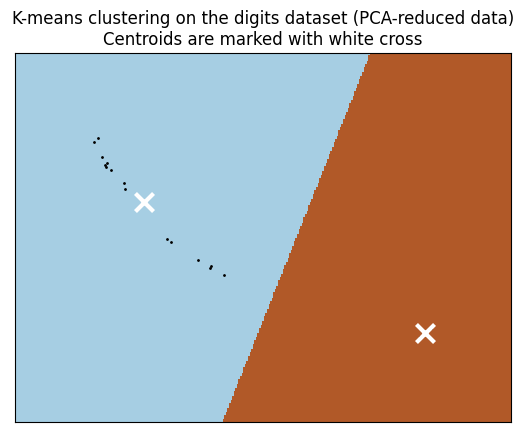

In [957]:
h = 0.02  # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1
y_min, y_max = reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = km.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.imshow(
    Z,
    interpolation="nearest",
    extent=(xx.min(), xx.max(), yy.min(), yy.max()),
    cmap=plt.cm.Paired,
    aspect="auto",
    origin="lower",
)

plt.plot(reduced_data[:, 0], reduced_data[:, 1], "k.", markersize=2)
# Plot the centroids as a white X
centroids = km.cluster_centers_
plt.scatter(
    centroids[:, 0],
    centroids[:, 1],
    marker="x",
    s=169,
    linewidths=3,
    color="w",
    zorder=10,
)
plt.title(
    "K-means clustering on the digits dataset (PCA-reduced data)\n"
    "Centroids are marked with white cross"
)
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

<AxesSubplot: >

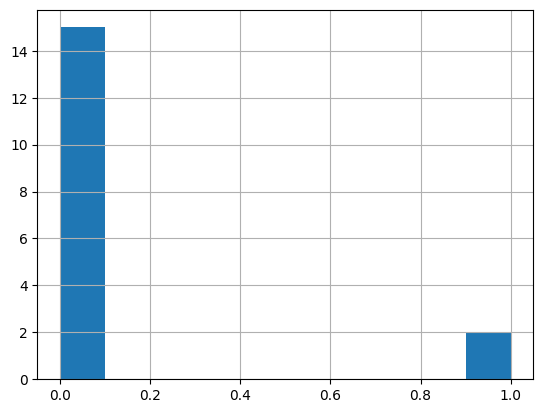

In [958]:
pd.Series(km.labels_).hist()

In [960]:
x = pd.concat([pd.DataFrame([km.labels_, y]).T, pd.DataFrame(reduced_data, columns=['var1', 'var2'])], axis=1)

In [961]:
x.groupby([1, 0]).count()

var1  var2
1      0            
poesia 0     6     6
       1     1     1
teatro 0     9     9
       1     1     1

In [923]:
x.groupby([0, 1]).count()

,,var1,var2
0,1,,
0,romance,1,1
1,romance,1,1


In [918]:
x.groupby([1, 0]).count().reset_index().sort_values('var1', ascending=False)

,1,0,var1,var2
0,romance,0,1,1
1,romance,1,1,1


In [701]:
x.groupby(0).count()['var1']

0
0    10
1    38
2     4
3    17
4     8
5     2
6    11
7    26
Name: var1, dtype: int64

In [ ]:
def distance_lists(l1, l2, cat1, cat2):
    ls = []

    for i in l1:
        for j in l2:

            h0_bottleneck = persim.bottleneck(i['diagram'][0], j['diagram'][0])
            h1_bottleneck = persim.bottleneck(i['diagram'][1], j['diagram'][1])
    #         h1_bottleneck = persim.bottleneck(romance['diagram'][1], poesia['diagram'][1])
            wass = persim.wasserstein(i['diagram'][0], j['diagram'][0])

            ls.append(
                {
                    'h0_bottleneck' : h0_bottleneck,
                    'h1_bottleneck' : h1_bottleneck,
                    'wass' : wass,
                    cat1 : i['titulo'],
                    cat2 : j['titulo']
                }
            )

    return pd.DataFrame(ls)


Memórias Póstumas de Brás Cubas


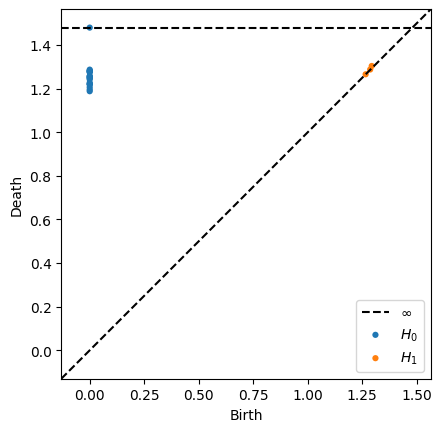

In [540]:
print(romance_diagrams[0]['titulo'])
plot_diagrams(romance_diagrams[0]['diagram'])

In [505]:
persim.wasserstein(romance_diagrams[1]['diagram'][0], romance_diagrams[0]['diagram'][0])

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points



0.7530500888824463

In [972]:
all_diagrams= all_diagrams()

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: 

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: 

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?



In [975]:


def distance_lists(l1, l2, cat1, cat2):
    ls = []

    for i in l1:
        for j in l2:

            h0_bottleneck = persim.bottleneck(i['diagram'][0], j['diagram'][0])
            h1_bottleneck = persim.bottleneck(i['diagram'][1], j['diagram'][1])
    #         h1_bottleneck = persim.bottleneck(romance['diagram'][1], poesia['diagram'][1])
            wass = persim.wasserstein(i['diagram'][0], j['diagram'][0])

            ls.append(
                {
                    'h0_bottleneck' : h0_bottleneck,
                    'h1_bottleneck' : h1_bottleneck,
                    'wass' : wass,
                    cat1 : i['titulo'],
                    cat2 : j['titulo']
                }
            )

    return pd.DataFrame(ls)



In [976]:
dist_df = distance_lists(romance_diagrams, romance_diagrams+poesia_diagrams, 'romance', 'romance+poesia')

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

In [977]:
dist_df

,h0_bottleneck,h1_bottleneck,wass,romance,romance+poesia
0,0.000000,0.000000,0.000000,Memórias Póstumas de Brás Cubas,Memórias Póstumas de Brás Cubas
1,0.056985,0.019583,0.753050,Memórias Póstumas de Brás Cubas,Esaú e Jacó
2,0.080492,0.008539,1.011485,Memórias Póstumas de Brás Cubas,Helena
3,0.143993,0.006265,0.897484,Memórias Póstumas de Brás Cubas,Ressurreição
4,0.083165,0.005272,1.312513,Memórias Póstumas de Brás Cubas,A Mão e a Luva
5,0.044447,0.007929,0.462015,Memórias Póstumas de Brás Cubas,Memorial de Aires
6,0.028368,0.005272,0.255411,Memórias Póstumas de Brás Cubas,Casa Velha
7,0.156143,0.006248,0.772600,Memórias Póstumas de Brás Cubas,Quincas Borba
8,0.032349,0.005272,0.257044,Memórias Póstumas de Brás Cubas,Dom Casmurro
9,0.152897,0.010215,2.592343,Memórias Póstumas de Brás Cubas,Iaiá Garcia


In [518]:
dist_df['dist'] = ((dist_df['h0_bottleneck'] + dist_df['h1_bottleneck'])**2) ** 0.5

In [530]:
dist_df.sort_values('dist', ascending=False).head(20)

,h0_bottleneck,h1_bottleneck,wass,romance,romance+poesia,dist
116,0.314215,0.004784,1.976072,Casa Velha,Falenas,0.318998
99,0.306514,0.007929,2.216190,Memorial de Aires,Falenas,0.314443
14,0.294359,0.005272,1.778618,Memórias Póstumas de Brás Cubas,Falenas,0.299631
150,0.290574,0.004885,2.002694,Dom Casmurro,Falenas,0.295460
130,0.281808,0.006248,2.357789,Quincas Borba,Gazeta de Holanda,0.288056
164,0.277273,0.010215,4.177531,Iaiá Garcia,Gazeta de Holanda,0.287488
31,0.266777,0.019583,2.327407,Esaú e Jacó,Falenas,0.286360
62,0.269658,0.006265,2.482673,Ressurreição,Gazeta de Holanda,0.275923
166,0.240251,0.010215,4.063576,Iaiá Garcia,Ocidentais,0.250465
48,0.228754,0.008539,2.356151,Helena,Falenas,0.237293


In [536]:
dist_df.merge(df[['titulo', 'categoria']], left_on='romance', right_on='titulo').merge(df[['titulo', 'categoria']], left_on='romance+poesia', right_on='titulo').sort_values('dist', ascending=False).head(20)

,h0_bottleneck,h1_bottleneck,wass,romance,romance+poesia,dist,titulo_x,categoria_x,titulo_y,categoria_y
146,0.314215,0.004784,1.976072,Casa Velha,Falenas,0.318998,Casa Velha,romance,Falenas,poesia
145,0.306514,0.007929,2.216190,Memorial de Aires,Falenas,0.314443,Memorial de Aires,romance,Falenas,poesia
140,0.294359,0.005272,1.778618,Memórias Póstumas de Brás Cubas,Falenas,0.299631,Memórias Póstumas de Brás Cubas,romance,Falenas,poesia
148,0.290574,0.004885,2.002694,Dom Casmurro,Falenas,0.295460,Dom Casmurro,romance,Falenas,poesia
117,0.281808,0.006248,2.357789,Quincas Borba,Gazeta de Holanda,0.288056,Quincas Borba,romance,Gazeta de Holanda,poesia
119,0.277273,0.010215,4.177531,Iaiá Garcia,Gazeta de Holanda,0.287488,Iaiá Garcia,romance,Gazeta de Holanda,poesia
141,0.266777,0.019583,2.327407,Esaú e Jacó,Falenas,0.286360,Esaú e Jacó,romance,Falenas,poesia
113,0.269658,0.006265,2.482673,Ressurreição,Gazeta de Holanda,0.275923,Ressurreição,romance,Gazeta de Holanda,poesia
139,0.240251,0.010215,4.063576,Iaiá Garcia,Ocidentais,0.250465,Iaiá Garcia,romance,Ocidentais,poesia
142,0.228754,0.008539,2.356151,Helena,Falenas,0.237293,Helena,romance,Falenas,poesia


In [483]:
from itertools import combinations

cats = df['categoria'].unique().tolist()

cats_diagrams = {}

for cat in cats:
    
    cats_diagrams[cat] = cat_diagrams(cat)

comb = list(combinations(cats, 2))

comb_bottleneck = []

for i in comb:
    
    print(type(i[0]), i[1])
    mean_bottleneck = distance_lists(cats_diagrams[i[0]], cats_diagrams[i[1]], i[0], i[1])[0]
    mean_wass = distance_lists(cats_diagrams[i[0]], cats_diagrams[i[1]], i[0], i[1])[1]
    
    comb_bottleneck.append(
        {
            'cat1' : i[0],
            'cat2' : i[1],
            'mean_bottleneck' : mean_bottleneck,
            'mean_wass' : mean_wass
        }
    )
    
    
metric_df = pd.DataFrame(comb_bottleneck)
    

41
41
41
41
41
41
41
41
41
41
41
41
41
41
41
41
41
41
41
25
41
41
41
41
41
41
41
41
41
41
41
41
41
41
41
41
41
41
41
39
386
386
386
386
386
386
386
386
386
386
386
386
386
386
386
386
386
386
386
384
19
19
19
19
19
19
19
19
19
19
19
19
19
19
19
19
19
19
19
10
70
70
70
70
70
70
70
70
70
70
70
70
70
70
70
70
70
70
70
62
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
834
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
98
21
21
21
21
21
21
21
21
21
21
21
21
21
21
21
21
21
21
21
10
58
58
58
58
58
58
58
58
58
58
58
58
58
58
58
58
58
58
58
49
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
18
12
27
27
27
27
27
27
27
27
27
27
27
27
27
27
27
27
27
27
27
16
149
149
149
149
149
149
149
149
149
149
149
149
149
149
149
149
149
149
149
133
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
28
58
58
58
58
58
58
58
58
58
58
58
58
58
58
58
58
58
58
58
43
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
133
7

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: 


40
40
40
40
40
40
40
40
24
29
29
29
29
29
29
29
29
29
29
29
29
29
29
29
29
29
29
29
26
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
1
0
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
29
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
80
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
20
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
34
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
5
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
0
1702
1702
1702
1702
1702
1702
1702
1702
1702
1702
1702
1702
1702
1702
1702
1702
1702
1702
1702
1685
1987
1987
1987
1987
1987
1987
1987
1987
1987
1987
1987
1987
1987
1987
1987
1987
1987
1987
1987
1976
1588
1588
1588
1588
1588
1588
1588
1588
1588
1588
1588
1588
1588
1588
1588
1588
1588
1588
1588
1570
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1006
972
972
972
972
972
972
972
972
972
972
972
972
972
97

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: 

607
607
607
607
607
607
607
607
607
607
607
607
607
607
607
607
607
607
607
606
2211
2211
2211
2211
2211
2211
2211
2211
2211
2211
2211
2211
2211
2211
2211
2211
2211
2211
2211
2200
1786
1786
1786
1786
1786
1786
1786
1786
1786
1786
1786
1786
1786
1786
1786
1786
1786
1786
1786
1775
1593
1593
1593
1593
1593
1593
1593
1593
1593
1593
1593
1593
1593
1593
1593
1593
1593
1593
1593
1581
528
528
528
528
528
528
528
528
528
528
528
528
528
528
528
528
528
528
528
520
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
583
520
520
520
520
520
520
520
520
520
520
520
520
520
520
520
520
520
520
520
513
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
217
207
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
523


/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: 

372
372
372
372
372
372
372
372
372
372
372
372
372
372
372
372
372
372
372
371
720
720
720
720
720
720
720
720
720
720
720
720
720
720
720
720
720
720
720
704
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
73
165
165
165
165
165
165
165
165
165
165
165
165
165
165
165
165
165
165
165
161
21
21
21
21
21
21
21
21
21
21
21
21
21
21
21
21
21
21
21
12
530
530
530
530
530
530
530
530
530
530
530
530
530
530
530
530
530
530
530
519
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
4
7323
7323
7323
7323
7323
7323
7323
7323
7323
7323
7323
7323
7323
7323
7323
7323
7323
7323
7323
7305


/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: 

590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
580
456
456
456
456
456
456
456
456
456
456
456
456
456
456
456
456
456
456
456
439
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
61
61
61
61
61
61
61
61
61
61
61
61
61
61
61
61
61
61
61
60
2169
2169
2169
2169
2169
2169
2169
2169
2169
2169
2169
2169
2169
2169
2169
2169
2169
2169
2169
2164
595
595
595
595
595
595
595
595
595
595
595
595
595
595
595
595
595
595
595
593
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
113
313
313
313
313
313
313
313
313
313
313
313
313
313
313
313
313
313
313
313
302
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
0
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
1
0
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
898
19
19
19
19
19
19
19
19
19
19
19
19
19
19
19
19
19
19
19
7
152
152
152
152
152
152
152
152
152
152
152
152
152
152
152
152
152
152
152
143
22
22
22
22
22
22
22
22
22
22
22
22
22
22
22
22
22
22
22
20
17
17
17
17
17
17
17
17
17
17
17
17
17
17

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: 

148
148
148
148
148
148
148
148
148
148
148
148
148
148
148
148
148
148
148
141
219
219
219
219
219
219
219
219
219
219
219
219
219
219
219
219
219
219
219
200
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
45
34
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
120
202
202
202
202
202
202
202
202
202
202
202
202
202
202
202
202
202
202
202
202
174
174
174
174
174
174
174
174
174
174
174
174
174
174
174
174
174
174
174
173
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
268
255
182
182
182
182
182
182
182
182
182
182
182
182
182
182
182
182
182
182
182
164
341
341
341
341
341
341
341
341
341
341
341
341
341
341
341
341
341
341
341
340
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1171
1154
1409
1409
1409
1409
1409
1409
1409
1409
1409
1409
1409
1409
1409
1409
1409
1409
1409
1409
1409
1404
816
816
816
816
816
816
816
816
816
816
816
816
816
816
816
816
816
816
816
813
1549
1549
1549
1549


/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning:

The input point cloud has more columns than rows; did you mean to transpose?

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:5

1589
1589
1589
1589
1589
1589
1589
1589
1589
1589
1589
1589
1589
1589
1589
1589
1589
1589
1589
1572
625
625
625
625
625
625
625
625
625
625
625
625
625
625
625
625
625
625
625
612
3317
3317
3317
3317
3317
3317
3317
3317
3317
3317
3317
3317
3317
3317
3317
3317
3317
3317
3317
3300
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
278
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1763
1745
<class 'str'> miscelânea


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> romance


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> poesia


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

<class 'str'> crônica


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> teatro


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

<class 'str'> conto


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> tradução


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

<class 'str'> romance


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> poesia


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> crônica


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> teatro


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> conto


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> tradução


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> poesia


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

<class 'str'> crônica


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

<class 'str'> teatro


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

<class 'str'> conto


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> tradução


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

<class 'str'> crônica


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> teatro


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> conto


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> tradução


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> teatro


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> conto


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> tradução


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> conto


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> tradução


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-fi

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

<class 'str'> tradução


/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:51: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/wasserstein.py:61: UserWarning:

dgm2 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:56: UserWarning:

dgm1 has points with non-finite death times;ignoring those points

/opt/homebrew/lib/python3.9/site-packages/persim/bottleneck.py:66: UserWarning:

dgm2 has points with non-fin

In [994]:
metric_df.sort_values('mean_bottleneck')

,cat1,cat2,mean_bottleneck,mean_wass
15,romance,teatro,0.131003,1.249443
2,crítica,poesia,0.142084,1.250031
3,crítica,crônica,0.144087,1.640609
13,romance,poesia,0.151200,1.889471
27,conto,tradução,0.161224,1.896686
0,crítica,miscelânea,0.164179,1.915020
25,teatro,conto,0.169856,1.674065
18,poesia,crônica,0.170088,1.612372
26,teatro,tradução,0.173499,1.998461
1,crítica,romance,0.180350,2.540428


In [995]:
metric_df_2 = metric_df.copy()

In [999]:
metric_df_2.rename(columns=
{
    'cat1' : 'categoria 1',
    'cat2' : 'categoria 2'
}
).sort_values('mean_bottleneck')

,categoria 1,categoria 2,mean_bottleneck,mean_wass
15,romance,teatro,0.131003,1.249443
2,crítica,poesia,0.142084,1.250031
3,crítica,crônica,0.144087,1.640609
13,romance,poesia,0.151200,1.889471
27,conto,tradução,0.161224,1.896686
0,crítica,miscelânea,0.164179,1.915020
25,teatro,conto,0.169856,1.674065
18,poesia,crônica,0.170088,1.612372
26,teatro,tradução,0.173499,1.998461
1,crítica,romance,0.180350,2.540428


In [465]:
metric_df[metric_df['mean_bottleneck'] < 0.1]

,cat1,cat2,mean_bottleneck,mean_wass
0,crítica,miscelânea,0.071520,0.489373
1,crítica,romance,0.091002,0.587721
2,crítica,poesia,0.095446,0.350009
3,crítica,crônica,0.062593,0.267317
9,miscelânea,crônica,0.090938,0.543632
15,romance,teatro,0.099218,0.520478


# Tests

## KeplerMapper & NLP examples

In [986]:
# from kmapper import jupyter
import kmapper as km
from kmapper import Cover, jupyter
import numpy as np

from sklearn.datasets import fetch_20newsgroups
from sklearn.cluster import AgglomerativeClustering
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import Isomap
from sklearn.preprocessing import MinMaxScaler

In [110]:
newsgroups = fetch_20newsgroups(subset='train')
# X = data / textos
# y = target variable

X, y, target_names = np.array(newsgroups.data), np.array(newsgroups.target), np.array(newsgroups.target_names)
print("SAMPLE",X[0])
print("SHAPE",X.shape)
print("TARGET",target_names[y[0]])

SAMPLE From: lerxst@wam.umd.edu (where's my thing)
Subject: WHAT car is this!?
Nntp-Posting-Host: rac3.wam.umd.edu
Organization: University of Maryland, College Park
Lines: 15

 I was wondering if anyone out there could enlighten me on this car I saw
the other day. It was a 2-door sports car, looked to be from the late 60s/
early 70s. It was called a Bricklin. The doors were really small. In addition,
the front bumper was separate from the rest of the body. This is 
all I know. If anyone can tellme a model name, engine specs, years
of production, where this car is made, history, or whatever info you
have on this funky looking car, please e-mail.

Thanks,
- IL
   ---- brought to you by your neighborhood Lerxst ----





SHAPE (11314,)
TARGET rec.autos


In [90]:
mapper = km.KeplerMapper(verbose=2)

projected_X = mapper.fit_transform(X,
    projection=[TfidfVectorizer(analyzer="char",
                                ngram_range=(1,1),
                                max_df=0.83,
                                min_df=0.05),
                TruncatedSVD(n_components=100,
                             random_state=1729),
                Isomap(n_components=2,
                       n_jobs=-1)],
    scaler=[None, None, MinMaxScaler()])

print("SHAPE",projected_X.shape)

KeplerMapper(verbose=2)
..Composing projection pipeline of length 3:
	Projections: TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))
		TruncatedSVD(n_components=100, random_state=1729)
		Isomap(n_jobs=-1)
	Distance matrices: False
False
False
	Scalers: None
None
MinMaxScaler()
..Projecting on data shaped (11314,)

..Projecting data using: 
	TfidfVectorizer(analyzer='char', max_df=0.83, min_df=0.05, ngram_range=(1, 6))


..Created projection shaped (11314, 13967)
..Projecting on data shaped (11314, 13967)

..Projecting data using: 
	TruncatedSVD(n_components=100, random_state=1729)

..Projecting on data shaped (11314, 100)

..Projecting data using: 
	Isomap(n_jobs=-1)



/opt/homebrew/lib/python3.9/site-packages/sklearn/manifold/_isomap.py:324: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/opt/homebrew/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])



..Scaling with: MinMaxScaler()

SHAPE (11314, 2)


In [53]:
from sklearn import cluster
graph = mapper.map(projected_X,
                   X=None,
                   clusterer=cluster.AgglomerativeClustering(n_clusters=2,
                                                             linkage="complete",
                                                             affinity="cosine"),
                   cover=Cover(perc_overlap=0.33))

Mapping on data shaped (116, 3) using lens shaped (116, 3)

Minimal points in hypercube before clustering: 2
Creating 1000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

   > Found 2 clusters in hypercube 26.
Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

   > Found 2 clusters in hypercube 35.
   > Found 2 clusters in hypercube 36.
Cube_37 is empty.

Cube_38 is empty.

Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

In [54]:
vec = TfidfVectorizer(analyzer="word",
                      strip_accents="unicode",
                      stop_words="english",
                      ngram_range=(1,3),
                      max_df=0.97,
                      min_df=0.02)

interpretable_inverse_X = vec.fit_transform(X).toarray()
interpretable_inverse_X_names = vec.get_feature_names()

print("SHAPE", interpretable_inverse_X.shape)
print("FEATURE NAMES SAMPLE", interpretable_inverse_X_names[:400])

SHAPE (116, 108909)
FEATURE NAMES SAMPLE ['000', '000 000', '08', '10', '10 abril', '10 agosto', '10 fevereiro', '10 horas', '10 horas da', '10 janeiro', '10 marco', '10 novembro', '100', '10000', '11', '11 abril', '11 agosto', '11 horas', '11 horas da', '11 junho', '11 outubro', '11 setembro', '12', '12 fevereiro', '12 janeiro', '12 junho', '12 maio', '12 marco', '12 novembro', '120', '13', '13 agosto', '13 fevereiro', '13 janeiro', '13 maio', '13 outubro', '13 setembro', '14', '14 agosto', '14 janeiro', '14 julho', '14 junho', '14 marco', '14 setembro', '15', '15 abril', '15 agosto', '15 dezembro', '15 fevereiro', '15 janeiro', '15 junho', '15 maio', '15 marco', '15 novembro', '15 outubro', '15 setembro', '150', '16', '16 abril', '16 dezembro', '16 fevereiro', '16 junho', '16 maio', '16 outubro', '17', '17 abril', '17 anos', '17 janeiro', '17 outubro', '18', '18 fevereiro', '18 julho', '18 junho', '18 nao', '18 outubro', '18 setembro', '1815', '1820', '1821', '1822', '1823', '1828', 

/opt/homebrew/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [94]:
_ = mapper.visualize(graph,
                        X=interpretable_inverse_X,
                        X_names=interpretable_inverse_X_names,
                        path_html="newsgroups20.html",
                        lens=projected_X,
                        lens_names=["ISOMAP1", "ISOMAP2"],
                        title="Newsgroups20: Latent Semantic Char-gram Analysis with Isometric Embedding",
                        custom_tooltips=np.array([target_names[ys] for ys in y]),
                        color_values=y,
                        color_function_name='target')

jupyter.display("machado_tda/newsgroups20.html")

Wrote visualization to: newsgroups20.html


/opt/homebrew/lib/python3.9/site-packages/IPython/core/display.py:419: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


## GridSearch

In [44]:
from pprint import pprint
from time import time
import logging

from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

# Display progress logs on stdout
logging.basicConfig(level=logging.INFO, format="%(asctime)s %(levelname)s %(message)s")

# Load some categories from the training set
categories = [
    "alt.atheism",
    "talk.religion.misc",
]

# Uncomment the following to do the analysis on all the categories
# categories = None

print("Loading 20 newsgroups dataset for categories:")
print(categories)

data = fetch_20newsgroups(subset="train", categories=categories)
print("%d documents" % len(data.filenames))
print("%d categories" % len(data.target_names))
print()

Loading 20 newsgroups dataset for categories:
['alt.atheism', 'talk.religion.misc']
857 documents
2 categories



In [45]:
# Define a pipeline combining a text feature extractor with a simple classifier
pipeline = Pipeline(
    [
        ("vect", CountVectorizer()),
        ("tfidf", TfidfTransformer()),
        ("clf", SGDClassifier()),
    ]
)

# Parameters to use for grid search. Uncommenting more parameters will give
# better exploring power but will increase processing time in a combinatorial
# way
parameters = {
    "vect__max_df": (0.5, 0.75, 1.0),
    # 'vect__max_features': (None, 5000, 10000, 50000),
    "vect__ngram_range": ((1, 1), (1, 2)),  # unigrams or bigrams
    # 'tfidf__use_idf': (True, False),
    # 'tfidf__norm': ('l1', 'l2'),
    "clf__max_iter": (20,),
    "clf__alpha": (0.00001, 0.000001),
    "clf__penalty": ("l2", "elasticnet"),
    # 'clf__max_iter': (10, 50, 80),
}

# Find the best parameters for both the feature extraction and the
# classifier
grid_search = GridSearchCV(pipeline, parameters, n_jobs=-1, verbose=1)

print("Performing grid search...")
print("pipeline:", [name for name, _ in pipeline.steps])
print("parameters:")
pprint(parameters)
t0 = time()
grid_search.fit(data.data, data.target)
print("done in %0.3fs" % (time() - t0))
print()

print("Best score: %0.3f" % grid_search.best_score_)
print("Best parameters set:")
best_parameters = grid_search.best_estimator_.get_params()
for param_name in sorted(parameters.keys()):
    print("\t%s: %r" % (param_name, best_parameters[param_name]))

Performing grid search...
pipeline: ['vect', 'tfidf', 'clf']
parameters:
{'clf__alpha': (1e-05, 1e-06),
 'clf__max_iter': (20,),
 'clf__penalty': ('l2', 'elasticnet'),
 'vect__max_df': (0.5, 0.75, 1.0),
 'vect__ngram_range': ((1, 1), (1, 2))}
Fitting 5 folds for each of 24 candidates, totalling 120 fits
done in 7.036s

Best score: 0.956
Best parameters set:
	clf__alpha: 1e-05
	clf__max_iter: 20
	clf__penalty: 'elasticnet'
	vect__max_df: 0.5
	vect__ngram_range: (1, 2)


## Persim

In [129]:
import numpy as np
from sklearn import datasets
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt

from ripser import Rips
from persim import PersImage
from persim import PersistenceImager

params = {"ytick.color" : "b",
          "xtick.color" : "b",
          "axes.labelcolor" : "w",
          "axes.edgecolor" : "b"}
plt.rcParams.update(params)

In [123]:
N = 200
N_per_class = int(N / 2)
N_in_class = 400

def noise(N, scale):
    return scale * np.random.random((N, 2))

def circle(N, scale, offset):
    return offset + scale * datasets.make_circles(n_samples=N, factor=0.4, noise=0.05)[0]

just_noise = [noise(N_in_class, 150) for _ in range(N_per_class)]

half = int(N_in_class / 2)
with_circle = [np.concatenate((circle(half, 50, 70), noise(half, 150)))
               for _ in range(N_per_class)]

datas = []
datas.extend(just_noise)
datas.extend(with_circle)

# Define labels
labels = np.zeros(N)
labels[N_per_class:] = 1

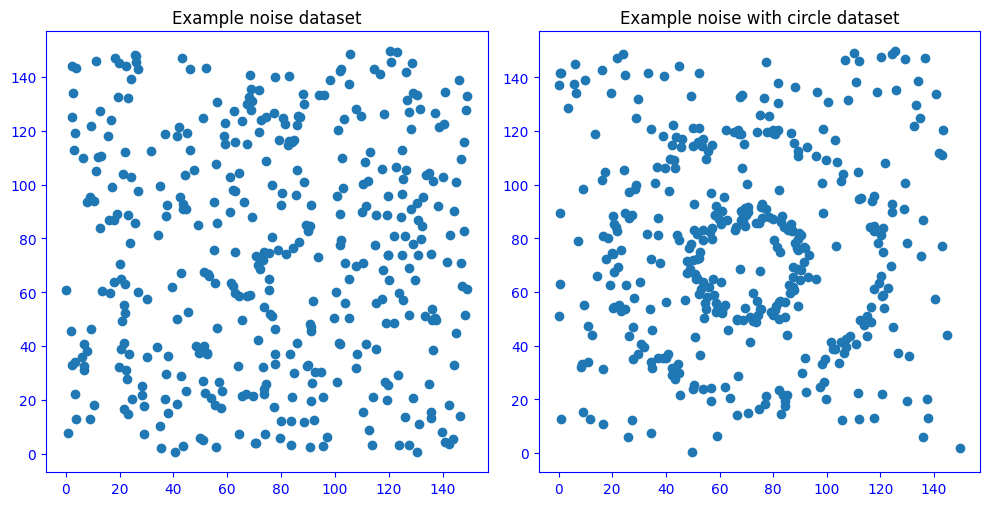

In [130]:
# Visualize the data
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(10,5)

xs, ys = just_noise[0][:,0], just_noise[0][:,1]
axs[0].scatter(xs, ys)
axs[0].set_title("Example noise dataset")
axs[0].set_aspect('equal', 'box')

xs_, ys_ = with_circle[0][:,0], with_circle[0][:,1]
axs[1].scatter(xs_, ys_)
axs[1].set_title("Example noise with circle dataset")
axs[1].set_aspect('equal', 'box')

fig.tight_layout()

In [157]:
rips = Rips(maxdim=1, coeff=2)
diagrams = rips.fit_transform(interpretable_inverse_X[0])
# diagrams_h1 = rips.fit_transform(interpretable_inverse_X)[1]


Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


IndexError: tuple index out of range

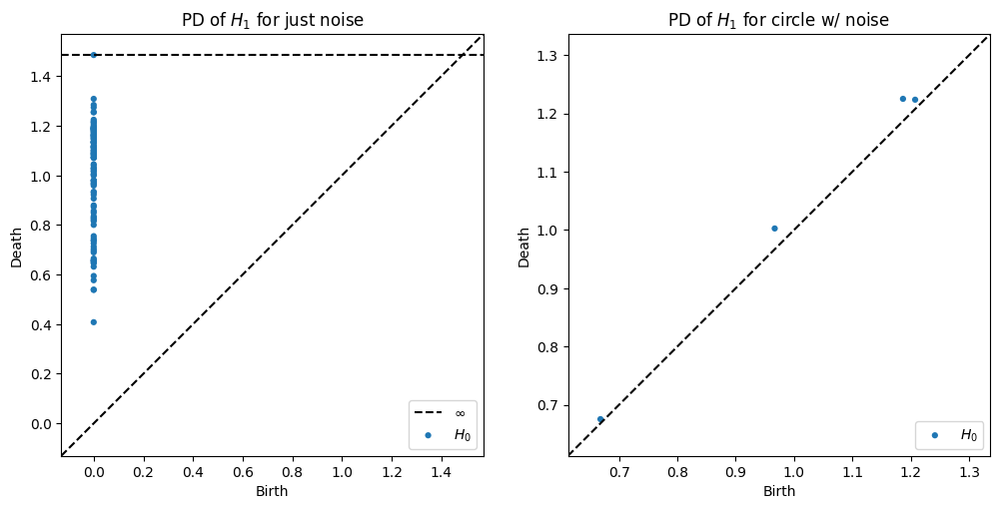

In [156]:
plt.figure(figsize=(12,6))
plt.subplot(121)

rips.plot(diagrams[0], show=False)
plt.title("PD of $H_1$ for just noise")

plt.subplot(122)
rips.plot(diagrams[-1], show=False)
plt.title("PD of $H_1$ for circle w/ noise")

plt.show()

In [154]:
for i in diagrams[0]:
    print(i)
    print('\n')

[0.         0.40785351]


[0.         0.53801209]


[0.         0.53914571]


[0.         0.57702589]


[0.         0.59429646]


[0.         0.63166016]


[0.         0.64617968]


[0.         0.64773345]


[0.        0.6540876]


[0.         0.65507787]


[0.         0.65637147]


[0.         0.65857857]


[0.         0.66444403]


[0.         0.68934381]


[0.         0.69585919]


[0.         0.70316559]


[0.         0.71267599]


[0.         0.72596574]


[0.         0.73672271]


[0.         0.73711169]


[0.         0.74565053]


[0.         0.75485408]


[0.         0.80024797]


[0.        0.8156687]


[0.         0.82000434]


[0.         0.82589889]


[0.         0.82966828]


[0.         0.83490598]


[0.         0.84936589]


[0.         0.85627562]


[0.         0.87321961]


[0.         0.87897027]


[0.         0.90625948]


[0.         0.92182344]


[0.         0.93101996]


[0.         0.93386418]


[0.         0.95867288]


[0.         0.96477026]


[0.         0.96

In [152]:
diagrams[1]

array([[1.20736408, 1.22332489],
       [1.18653941, 1.22479391],
       [0.96675426, 1.00248241],
       [0.66818774, 0.67544681]])

In [132]:
pimgr = PersistenceImager(pixel_size=1)
pimgr.fit(diagrams_h1)
imgs = pimgr.transform(diagrams_h1)

In [134]:
imgs_array = np.array([img.flatten() for img in imgs])

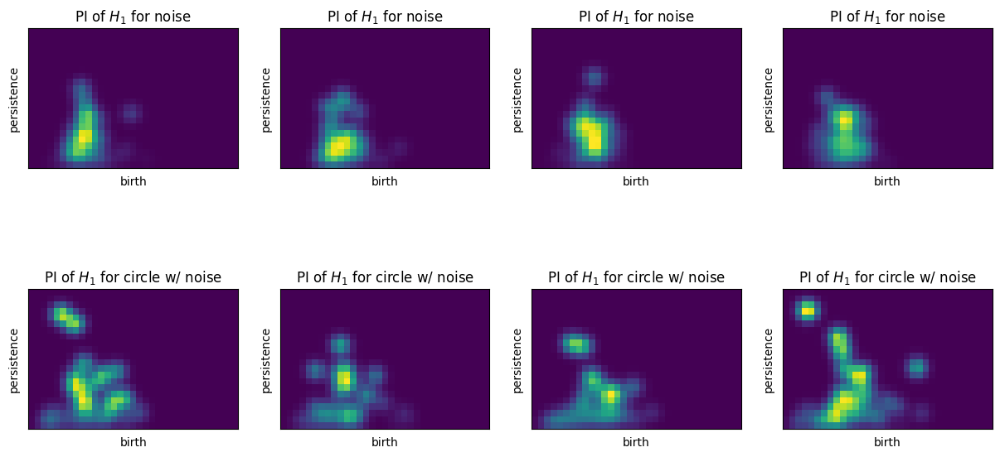

In [136]:
plt.figure(figsize=(15,7.5))

for i in range(4):
    ax = plt.subplot(240+i+1)
    pimgr.plot_image(imgs[i], ax)
    plt.title("PI of $H_1$ for noise")

for i in range(4):
    ax = plt.subplot(240+i+5)
    pimgr.plot_image(imgs[-(i+1)], ax)
    plt.title("PI of $H_1$ for circle w/ noise")

In [141]:
for i in interpretable_inverse_X:
    print(sum(i))

20.01995019095585
18.623781995233703
31.78628711437212
16.272682952490268
19.696912784846994
38.917818434640985
22.17043541334233
13.987584941724535
22.836706977183226
14.660728218998964
15.467944253106616
20.581014554440177
18.10728989338866
18.445180619096227
23.295214671183974
24.46676527318976
23.80626828062307
12.529248024302166
17.37797093449211
17.6388809521093
23.243381107393283
20.226681711581723
20.470338692742505
17.07769189464358
20.226390800038967
15.836923209748237
22.945435968497566
18.95626749690604
11.647559643622214
17.756975621895744
33.11599269308234
15.987899349186144
16.457832510195523
20.056099470086565
15.295418901544625
20.64042535231297
19.378597407194217
23.427535429808994
23.66270743345133
27.44816140032309
12.92789397683975
17.486792313908357
13.924567841868052
31.80397844192868
18.62242430755094
19.471699409644433
16.641349702768185
8.447355415306836
17.45272637347925
25.070133392613887
15.321169776638156
18.038763127842962
19.760423616838217
12.3927409901